# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
#data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

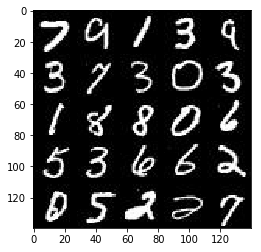

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

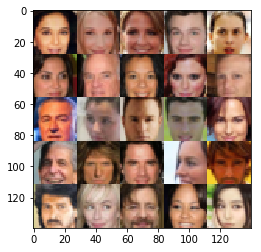

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels], name='input_real')
    input_z = tf.placeholder(tf.float32, [None, z_dim], name='input_z')
    learning_rate = tf.placeholder(tf.float32, None, name='learning_rate')
    return input_real, input_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def leaky_relu(x, alpha=0.2, name='leaky_relu'):
    return tf.maximum(alpha * x, x, name=name)

def conv_layer2d(inputs, filters, kernel_size=5, strides=2, padding='same', normalize=True):
    conv_layer2d = tf.layers.conv2d(inputs=inputs, filters=filters, kernel_size=kernel_size,
                                  strides=strides, padding=padding, 
                                  kernel_initializer=tf.contrib.layers.xavier_initializer())
    if normalize:
        conv_layer2d = tf.layers.batch_normalization(inputs=conv_layer2d, training=True)
    conv_layer2d = leaky_relu(x=conv_layer2d)
    conv_layer2d = tf.layers.dropout(inputs=conv_layer2d, rate=0.50)
    return conv_layer2d

def get_conv_layer_volume(conv_layer):
    return conv_layer.get_shape().as_list()[1] * conv_layer.get_shape().as_list()[2] * conv_layer.get_shape().as_list()[3]

def reshape_conv_layer(conv_layer, conv_layer_volume):
    return tf.reshape(conv_layer, [-1, conv_layer_volume])

def discriminator(images, reuse=False, alpha=0.2):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        x = conv_layer2d(inputs=images, filters=32, normalize=False)
        conv_layer = conv_layer2d(inputs=x, filters=64)
        conv_layer = conv_layer2d(inputs=conv_layer, filters=128)
        #conv_layer = conv_layer2d(inputs=conv_layer, filters=128)
        conv_layer_volume = get_conv_layer_volume(conv_layer=conv_layer)
        conv_layer_flattened = reshape_conv_layer(conv_layer=conv_layer, conv_layer_volume=conv_layer_volume)
        logits = tf.layers.dense(inputs=conv_layer_flattened, units=1)
        out = tf.sigmoid(x=logits)
        
        return out, logits

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator_first_layer(inputs, filters, is_train, width=7, height=7):
    x = tf.layers.dense(inputs=inputs, units=width*height*filters)
    x = tf.reshape(x, shape=[-1, width, height, filters])
    x = tf.layers.batch_normalization(inputs=x, training=is_train)
    x = leaky_relu(x=x)
    return x

def conv2d_transpose(inputs, filters, is_train, kernel_size=5, strides=2, padding='same', normalize=True):
    conv_layer_transposed = tf.layers.conv2d_transpose(inputs=inputs, filters=filters, kernel_size=kernel_size,
                                                      strides=strides, padding=padding,
                                                      kernel_initializer=tf.contrib.layers.xavier_initializer())
    if normalize:
        conv_layer_transposed = tf.layers.batch_normalization(inputs=conv_layer_transposed, training=is_train)
    conv_layer_transposed = leaky_relu(x=conv_layer_transposed)
    #conv_layer_transpose = tf.layers.dropout(inputs=conv_layer_transpose, rate=0.50, training=is_train)

    return conv_layer_transposed

def generator(z, out_channel_dim, is_train=True, alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse=not is_train):
        x = generator_first_layer(inputs=z, filters=256, is_train=is_train)
        conv_layer_transpose = conv2d_transpose(inputs=x, filters=128, is_train=is_train)
        conv_layer_transpose = conv2d_transpose(inputs=conv_layer_transpose, filters=64, is_train=is_train)
        #conv_layer_transpose = conv2d_transpose(inputs=conv_layer_transpose, filters=32, is_train=is_train, 
        #                                         strides=(1, 1))

        logits = conv2d_transpose(inputs=conv_layer_transpose, filters=out_channel_dim, is_train=is_train,
                                  strides=(1, 1), normalize=False)
        out = tf.tanh(x=logits)
        
        return out

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    smooth = 0.1
    g_model = generator(z=input_z, out_channel_dim=out_channel_dim)
    d_model_real, d_logits_real = discriminator(images=input_real)
    d_model_fake, d_logits_fake = discriminator(images=g_model, reuse=True)
    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, 
                                             labels=tf.ones_like(d_model_fake)))
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real,
                                             labels=tf.ones_like(d_model_real) * (1.0 - smooth)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                             labels=tf.zeros_like(d_model_fake)))
    
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    trainable_vars = tf.trainable_variables()
    d_vars = [var for var in trainable_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in trainable_vars if var.name.startswith('generator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_op = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_op = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_train_op, g_train_op


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    image_width = data_shape[1]
    image_height = data_shape[2]
    out_channel_dim = data_shape[3]
    input_real, input_z, learning_rate_p = model_inputs(image_width=image_width, image_height=image_height, 
                                                      image_channels=out_channel_dim, z_dim=z_dim)
    d_loss, g_loss = model_loss(input_real=input_real, input_z=input_z, out_channel_dim=out_channel_dim)
    d_train_opt, g_train_opt = model_opt(d_loss=d_loss, g_loss=g_loss, learning_rate=learning_rate, beta1=beta1) 
    
    step = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                batch_images *= 2
                step += 1
                
                batch_z = np.random.uniform(-1, 1, size=[batch_size, z_dim])
                
                _ = sess.run(d_train_opt, 
                             feed_dict={input_real: batch_images, input_z: batch_z, learning_rate_p: learning_rate})
                _ = sess.run(g_train_opt, feed_dict={input_real: batch_images, input_z: batch_z, 
                                                     learning_rate_p: learning_rate})
                
                train_loss_d = sess.run(d_loss, feed_dict={input_real: batch_images, input_z: batch_z})
                train_loss_g = sess.run(g_loss, feed_dict={input_z: batch_z})
            
                print("Epoch {}/{}".format(epoch_i + 1, epoch_count),
                      "Discriminator loss: {:.4f}".format(train_loss_d),
                      "Generator loss: {:.4f}".format(train_loss_g))
                if step == 1 or step % 20 == 0:
                    show_generator_output(sess=sess, n_images=25, input_z=input_z, 
                                      out_channel_dim=out_channel_dim, image_mode=data_image_mode)
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2 Discriminator loss: 7.7305 Generator loss: 0.0016


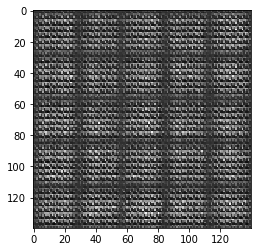

Epoch 1/2 Discriminator loss: 1.8435 Generator loss: 0.5067
Epoch 1/2 Discriminator loss: 1.6031 Generator loss: 0.7777
Epoch 1/2 Discriminator loss: 0.6401 Generator loss: 2.9939
Epoch 1/2 Discriminator loss: 1.1043 Generator loss: 0.9055
Epoch 1/2 Discriminator loss: 0.4053 Generator loss: 10.9843
Epoch 1/2 Discriminator loss: 0.4020 Generator loss: 10.4141
Epoch 1/2 Discriminator loss: 0.4032 Generator loss: 4.1457
Epoch 1/2 Discriminator loss: 1.7728 Generator loss: 0.3135
Epoch 1/2 Discriminator loss: 1.3419 Generator loss: 16.3167
Epoch 1/2 Discriminator loss: 0.6818 Generator loss: 13.0355
Epoch 1/2 Discriminator loss: 0.6987 Generator loss: 7.1742
Epoch 1/2 Discriminator loss: 1.1258 Generator loss: 1.1592
Epoch 1/2 Discriminator loss: 0.4045 Generator loss: 9.9121
Epoch 1/2 Discriminator loss: 0.4441 Generator loss: 4.7448
Epoch 1/2 Discriminator loss: 1.4982 Generator loss: 0.7307
Epoch 1/2 Discriminator loss: 2.1163 Generator loss: 13.9644
Epoch 1/2 Discriminator loss: 0.910

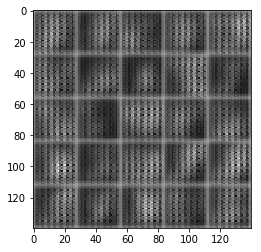

Epoch 1/2 Discriminator loss: 1.0785 Generator loss: 1.3863
Epoch 1/2 Discriminator loss: 0.8427 Generator loss: 4.5274
Epoch 1/2 Discriminator loss: 3.4128 Generator loss: 0.2588
Epoch 1/2 Discriminator loss: 2.4902 Generator loss: 8.5376
Epoch 1/2 Discriminator loss: 1.7276 Generator loss: 0.7797
Epoch 1/2 Discriminator loss: 1.1449 Generator loss: 1.5884
Epoch 1/2 Discriminator loss: 1.7056 Generator loss: 0.8056
Epoch 1/2 Discriminator loss: 1.2245 Generator loss: 1.8207
Epoch 1/2 Discriminator loss: 1.8683 Generator loss: 0.4493
Epoch 1/2 Discriminator loss: 2.2825 Generator loss: 6.0373
Epoch 1/2 Discriminator loss: 1.2866 Generator loss: 0.8336
Epoch 1/2 Discriminator loss: 0.9209 Generator loss: 1.0779
Epoch 1/2 Discriminator loss: 0.9772 Generator loss: 2.5208
Epoch 1/2 Discriminator loss: 1.7637 Generator loss: 0.3985
Epoch 1/2 Discriminator loss: 1.5484 Generator loss: 2.4701
Epoch 1/2 Discriminator loss: 2.5522 Generator loss: 0.2091
Epoch 1/2 Discriminator loss: 1.9543 Gen

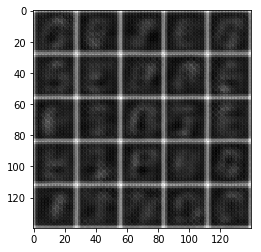

Epoch 1/2 Discriminator loss: 1.3609 Generator loss: 1.1521
Epoch 1/2 Discriminator loss: 1.5061 Generator loss: 0.4912
Epoch 1/2 Discriminator loss: 1.2561 Generator loss: 1.2977
Epoch 1/2 Discriminator loss: 1.9668 Generator loss: 0.3104
Epoch 1/2 Discriminator loss: 1.8014 Generator loss: 1.5901
Epoch 1/2 Discriminator loss: 2.5051 Generator loss: 0.1858
Epoch 1/2 Discriminator loss: 1.6948 Generator loss: 1.9202
Epoch 1/2 Discriminator loss: 1.9709 Generator loss: 0.3205
Epoch 1/2 Discriminator loss: 1.5138 Generator loss: 1.1533
Epoch 1/2 Discriminator loss: 1.7730 Generator loss: 0.3802
Epoch 1/2 Discriminator loss: 1.4485 Generator loss: 1.0733
Epoch 1/2 Discriminator loss: 1.5707 Generator loss: 0.5076
Epoch 1/2 Discriminator loss: 1.6413 Generator loss: 0.9881
Epoch 1/2 Discriminator loss: 1.7453 Generator loss: 0.4172
Epoch 1/2 Discriminator loss: 1.5888 Generator loss: 0.7541
Epoch 1/2 Discriminator loss: 1.5414 Generator loss: 0.5933
Epoch 1/2 Discriminator loss: 1.4981 Gen

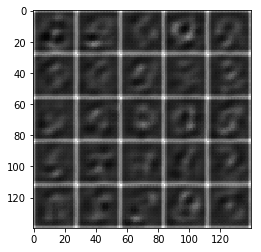

Epoch 1/2 Discriminator loss: 1.7372 Generator loss: 0.3547
Epoch 1/2 Discriminator loss: 1.6603 Generator loss: 1.2357
Epoch 1/2 Discriminator loss: 1.8949 Generator loss: 0.2863
Epoch 1/2 Discriminator loss: 1.9425 Generator loss: 1.9646
Epoch 1/2 Discriminator loss: 1.9079 Generator loss: 0.2828
Epoch 1/2 Discriminator loss: 1.5325 Generator loss: 1.2793
Epoch 1/2 Discriminator loss: 1.5136 Generator loss: 0.5020
Epoch 1/2 Discriminator loss: 1.4201 Generator loss: 0.9851
Epoch 1/2 Discriminator loss: 1.5217 Generator loss: 0.5315
Epoch 1/2 Discriminator loss: 1.3610 Generator loss: 0.9622
Epoch 1/2 Discriminator loss: 1.5138 Generator loss: 0.5314
Epoch 1/2 Discriminator loss: 1.4970 Generator loss: 0.7995
Epoch 1/2 Discriminator loss: 1.5308 Generator loss: 0.5403
Epoch 1/2 Discriminator loss: 1.4048 Generator loss: 0.8489
Epoch 1/2 Discriminator loss: 1.4991 Generator loss: 0.5667
Epoch 1/2 Discriminator loss: 1.4750 Generator loss: 0.8855
Epoch 1/2 Discriminator loss: 1.5743 Gen

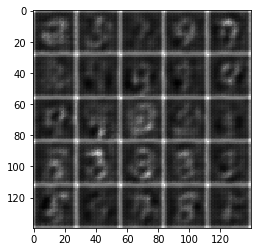

Epoch 1/2 Discriminator loss: 1.6023 Generator loss: 0.4430
Epoch 1/2 Discriminator loss: 1.4892 Generator loss: 1.0415
Epoch 1/2 Discriminator loss: 1.6636 Generator loss: 0.3954
Epoch 1/2 Discriminator loss: 1.5977 Generator loss: 1.0768
Epoch 1/2 Discriminator loss: 1.5098 Generator loss: 0.5363
Epoch 1/2 Discriminator loss: 1.3830 Generator loss: 0.8172
Epoch 1/2 Discriminator loss: 1.4988 Generator loss: 0.5603
Epoch 1/2 Discriminator loss: 1.4320 Generator loss: 0.8088
Epoch 1/2 Discriminator loss: 1.5480 Generator loss: 0.5119
Epoch 1/2 Discriminator loss: 1.4879 Generator loss: 0.8381
Epoch 1/2 Discriminator loss: 1.5547 Generator loss: 0.4711
Epoch 1/2 Discriminator loss: 1.4267 Generator loss: 0.8524
Epoch 1/2 Discriminator loss: 1.5202 Generator loss: 0.5365
Epoch 1/2 Discriminator loss: 1.4402 Generator loss: 0.9323
Epoch 1/2 Discriminator loss: 1.5362 Generator loss: 0.4822
Epoch 1/2 Discriminator loss: 1.5213 Generator loss: 0.9697
Epoch 1/2 Discriminator loss: 1.5824 Gen

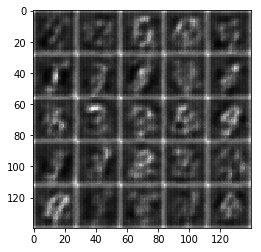

Epoch 1/2 Discriminator loss: 1.6438 Generator loss: 0.4011
Epoch 1/2 Discriminator loss: 1.4789 Generator loss: 1.0339
Epoch 1/2 Discriminator loss: 1.5323 Generator loss: 0.4948
Epoch 1/2 Discriminator loss: 1.5427 Generator loss: 0.9864
Epoch 1/2 Discriminator loss: 1.6192 Generator loss: 0.4701
Epoch 1/2 Discriminator loss: 1.5780 Generator loss: 0.8471
Epoch 1/2 Discriminator loss: 1.5070 Generator loss: 0.5081
Epoch 1/2 Discriminator loss: 1.3833 Generator loss: 0.9465
Epoch 1/2 Discriminator loss: 1.4584 Generator loss: 0.6250
Epoch 1/2 Discriminator loss: 1.4062 Generator loss: 0.8494
Epoch 1/2 Discriminator loss: 1.5090 Generator loss: 0.5382
Epoch 1/2 Discriminator loss: 1.4091 Generator loss: 0.9931
Epoch 1/2 Discriminator loss: 1.3838 Generator loss: 0.5968
Epoch 1/2 Discriminator loss: 1.4070 Generator loss: 0.9076
Epoch 1/2 Discriminator loss: 1.3979 Generator loss: 0.6319
Epoch 1/2 Discriminator loss: 1.3721 Generator loss: 0.8208
Epoch 1/2 Discriminator loss: 1.4591 Gen

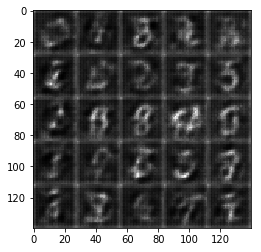

Epoch 1/2 Discriminator loss: 1.4287 Generator loss: 0.5155
Epoch 1/2 Discriminator loss: 1.3802 Generator loss: 1.0777
Epoch 1/2 Discriminator loss: 1.5961 Generator loss: 0.4071
Epoch 1/2 Discriminator loss: 1.4882 Generator loss: 1.1201
Epoch 1/2 Discriminator loss: 1.5019 Generator loss: 0.4888
Epoch 1/2 Discriminator loss: 1.6307 Generator loss: 0.9194
Epoch 1/2 Discriminator loss: 1.5091 Generator loss: 0.5000
Epoch 1/2 Discriminator loss: 1.4242 Generator loss: 1.0253
Epoch 1/2 Discriminator loss: 1.5243 Generator loss: 0.4742
Epoch 1/2 Discriminator loss: 1.3604 Generator loss: 1.1768
Epoch 1/2 Discriminator loss: 1.4706 Generator loss: 0.4991
Epoch 1/2 Discriminator loss: 1.4100 Generator loss: 1.2128
Epoch 1/2 Discriminator loss: 1.6241 Generator loss: 0.3847
Epoch 1/2 Discriminator loss: 1.4407 Generator loss: 1.2307
Epoch 1/2 Discriminator loss: 1.5079 Generator loss: 0.4793
Epoch 1/2 Discriminator loss: 1.4272 Generator loss: 1.0716
Epoch 1/2 Discriminator loss: 1.3896 Gen

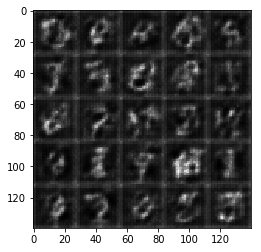

Epoch 1/2 Discriminator loss: 1.4947 Generator loss: 0.4529
Epoch 1/2 Discriminator loss: 1.3862 Generator loss: 1.0176
Epoch 1/2 Discriminator loss: 1.3966 Generator loss: 0.5593
Epoch 1/2 Discriminator loss: 1.3028 Generator loss: 1.0265
Epoch 1/2 Discriminator loss: 1.3333 Generator loss: 0.6074
Epoch 1/2 Discriminator loss: 1.3689 Generator loss: 0.9854
Epoch 1/2 Discriminator loss: 1.3369 Generator loss: 0.6384
Epoch 1/2 Discriminator loss: 1.2911 Generator loss: 0.8806
Epoch 1/2 Discriminator loss: 1.3554 Generator loss: 0.6981
Epoch 1/2 Discriminator loss: 1.2669 Generator loss: 0.7676
Epoch 1/2 Discriminator loss: 1.3469 Generator loss: 0.8612
Epoch 1/2 Discriminator loss: 1.3472 Generator loss: 0.6103
Epoch 1/2 Discriminator loss: 1.3376 Generator loss: 1.0755
Epoch 1/2 Discriminator loss: 1.4273 Generator loss: 0.5006
Epoch 1/2 Discriminator loss: 1.4284 Generator loss: 1.3963
Epoch 1/2 Discriminator loss: 1.5389 Generator loss: 0.4295
Epoch 1/2 Discriminator loss: 1.4441 Gen

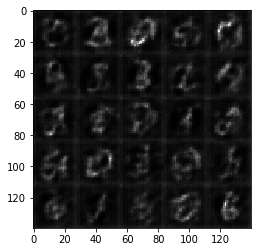

Epoch 1/2 Discriminator loss: 1.3339 Generator loss: 0.6421
Epoch 1/2 Discriminator loss: 1.2703 Generator loss: 1.0579
Epoch 1/2 Discriminator loss: 1.3343 Generator loss: 0.6747
Epoch 1/2 Discriminator loss: 1.3175 Generator loss: 0.8641
Epoch 1/2 Discriminator loss: 1.2822 Generator loss: 0.6887
Epoch 1/2 Discriminator loss: 1.2546 Generator loss: 1.0081
Epoch 1/2 Discriminator loss: 1.3796 Generator loss: 0.5837
Epoch 1/2 Discriminator loss: 1.2499 Generator loss: 1.1882
Epoch 1/2 Discriminator loss: 1.4484 Generator loss: 0.4887
Epoch 1/2 Discriminator loss: 1.3766 Generator loss: 1.3925
Epoch 1/2 Discriminator loss: 1.6008 Generator loss: 0.3804
Epoch 1/2 Discriminator loss: 1.3996 Generator loss: 1.5668
Epoch 1/2 Discriminator loss: 1.4806 Generator loss: 0.4685
Epoch 1/2 Discriminator loss: 1.2935 Generator loss: 1.0942
Epoch 1/2 Discriminator loss: 1.3283 Generator loss: 0.5767
Epoch 1/2 Discriminator loss: 1.2908 Generator loss: 1.0954
Epoch 1/2 Discriminator loss: 1.3620 Gen

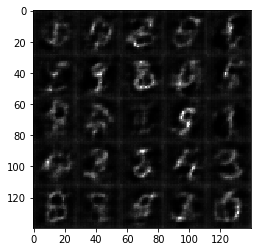

Epoch 1/2 Discriminator loss: 1.3889 Generator loss: 0.5312
Epoch 1/2 Discriminator loss: 1.4458 Generator loss: 1.3570
Epoch 1/2 Discriminator loss: 1.6083 Generator loss: 0.3665
Epoch 1/2 Discriminator loss: 1.5417 Generator loss: 1.5494
Epoch 1/2 Discriminator loss: 1.5785 Generator loss: 0.3931
Epoch 1/2 Discriminator loss: 1.3838 Generator loss: 1.3030
Epoch 1/2 Discriminator loss: 1.3879 Generator loss: 0.5398
Epoch 1/2 Discriminator loss: 1.2397 Generator loss: 0.9422
Epoch 1/2 Discriminator loss: 1.2603 Generator loss: 0.7959
Epoch 1/2 Discriminator loss: 1.2511 Generator loss: 0.7205
Epoch 1/2 Discriminator loss: 1.2696 Generator loss: 0.9579
Epoch 1/2 Discriminator loss: 1.2379 Generator loss: 0.6783
Epoch 1/2 Discriminator loss: 1.2105 Generator loss: 0.9426
Epoch 1/2 Discriminator loss: 1.2536 Generator loss: 0.7874
Epoch 1/2 Discriminator loss: 1.2745 Generator loss: 0.6847
Epoch 1/2 Discriminator loss: 1.2501 Generator loss: 0.8858
Epoch 1/2 Discriminator loss: 1.2476 Gen

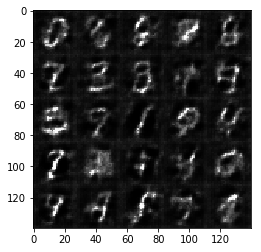

Epoch 1/2 Discriminator loss: 1.3010 Generator loss: 0.9723
Epoch 1/2 Discriminator loss: 1.5720 Generator loss: 0.3877
Epoch 1/2 Discriminator loss: 1.8887 Generator loss: 2.4658
Epoch 1/2 Discriminator loss: 1.7671 Generator loss: 0.2932
Epoch 1/2 Discriminator loss: 1.6575 Generator loss: 1.6771
Epoch 1/2 Discriminator loss: 1.5616 Generator loss: 0.4114
Epoch 1/2 Discriminator loss: 1.2378 Generator loss: 1.0291
Epoch 1/2 Discriminator loss: 1.2408 Generator loss: 0.8160
Epoch 1/2 Discriminator loss: 1.2865 Generator loss: 0.7870
Epoch 1/2 Discriminator loss: 1.2617 Generator loss: 0.7365
Epoch 1/2 Discriminator loss: 1.2266 Generator loss: 0.7763
Epoch 1/2 Discriminator loss: 1.2173 Generator loss: 0.9303
Epoch 1/2 Discriminator loss: 1.3801 Generator loss: 0.6031
Epoch 1/2 Discriminator loss: 1.1693 Generator loss: 1.0911
Epoch 1/2 Discriminator loss: 1.4216 Generator loss: 0.5242
Epoch 1/2 Discriminator loss: 1.3663 Generator loss: 1.2586
Epoch 1/2 Discriminator loss: 1.5122 Gen

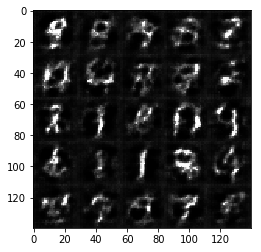

Epoch 1/2 Discriminator loss: 1.3978 Generator loss: 0.5502
Epoch 1/2 Discriminator loss: 1.2789 Generator loss: 1.0381
Epoch 1/2 Discriminator loss: 1.4544 Generator loss: 0.5085
Epoch 1/2 Discriminator loss: 1.2369 Generator loss: 1.1671
Epoch 1/2 Discriminator loss: 1.5379 Generator loss: 0.4188
Epoch 1/2 Discriminator loss: 1.4146 Generator loss: 1.2569
Epoch 1/2 Discriminator loss: 1.3624 Generator loss: 0.5154
Epoch 1/2 Discriminator loss: 1.3084 Generator loss: 1.3192
Epoch 1/2 Discriminator loss: 1.4056 Generator loss: 0.4933
Epoch 1/2 Discriminator loss: 1.4266 Generator loss: 1.0999
Epoch 1/2 Discriminator loss: 1.2975 Generator loss: 0.6429
Epoch 1/2 Discriminator loss: 1.1844 Generator loss: 1.0292
Epoch 1/2 Discriminator loss: 1.2965 Generator loss: 0.6220
Epoch 1/2 Discriminator loss: 1.2331 Generator loss: 1.0024
Epoch 1/2 Discriminator loss: 1.3023 Generator loss: 0.6128
Epoch 1/2 Discriminator loss: 1.2877 Generator loss: 1.1402
Epoch 1/2 Discriminator loss: 1.5464 Gen

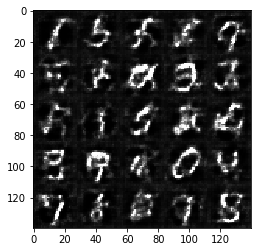

Epoch 1/2 Discriminator loss: 1.4498 Generator loss: 0.4639
Epoch 1/2 Discriminator loss: 1.3993 Generator loss: 1.4536
Epoch 1/2 Discriminator loss: 1.4900 Generator loss: 0.4377
Epoch 1/2 Discriminator loss: 1.3430 Generator loss: 1.3563
Epoch 1/2 Discriminator loss: 1.4363 Generator loss: 0.4576
Epoch 1/2 Discriminator loss: 1.2255 Generator loss: 1.3177
Epoch 1/2 Discriminator loss: 1.3239 Generator loss: 0.5926
Epoch 1/2 Discriminator loss: 1.3180 Generator loss: 1.0206
Epoch 1/2 Discriminator loss: 1.2382 Generator loss: 0.6383
Epoch 1/2 Discriminator loss: 1.2050 Generator loss: 1.0335
Epoch 1/2 Discriminator loss: 1.3217 Generator loss: 0.6077
Epoch 1/2 Discriminator loss: 1.2470 Generator loss: 1.2260
Epoch 1/2 Discriminator loss: 1.4626 Generator loss: 0.4574
Epoch 1/2 Discriminator loss: 1.3840 Generator loss: 1.3939
Epoch 1/2 Discriminator loss: 1.7087 Generator loss: 0.3260
Epoch 1/2 Discriminator loss: 1.9375 Generator loss: 2.2766
Epoch 1/2 Discriminator loss: 1.6860 Gen

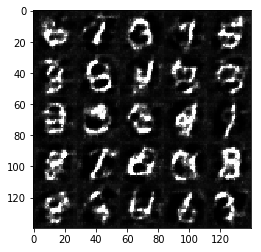

Epoch 1/2 Discriminator loss: 1.3292 Generator loss: 0.6471
Epoch 1/2 Discriminator loss: 1.2222 Generator loss: 0.7756
Epoch 1/2 Discriminator loss: 1.2889 Generator loss: 1.0578
Epoch 1/2 Discriminator loss: 1.2838 Generator loss: 0.6286
Epoch 1/2 Discriminator loss: 1.1776 Generator loss: 0.9462
Epoch 1/2 Discriminator loss: 1.2143 Generator loss: 0.8112
Epoch 1/2 Discriminator loss: 1.2712 Generator loss: 0.6987
Epoch 1/2 Discriminator loss: 1.1809 Generator loss: 1.1137
Epoch 1/2 Discriminator loss: 1.3519 Generator loss: 0.5317
Epoch 1/2 Discriminator loss: 1.1949 Generator loss: 1.2523
Epoch 1/2 Discriminator loss: 1.3609 Generator loss: 0.5665
Epoch 1/2 Discriminator loss: 1.2650 Generator loss: 1.1200
Epoch 1/2 Discriminator loss: 1.3453 Generator loss: 0.5302
Epoch 1/2 Discriminator loss: 1.2048 Generator loss: 1.2267
Epoch 1/2 Discriminator loss: 1.2394 Generator loss: 0.6331
Epoch 1/2 Discriminator loss: 1.3139 Generator loss: 1.5937
Epoch 1/2 Discriminator loss: 1.5387 Gen

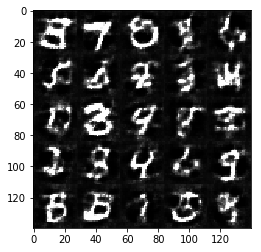

Epoch 1/2 Discriminator loss: 1.1543 Generator loss: 0.7933
Epoch 1/2 Discriminator loss: 1.1641 Generator loss: 1.0008
Epoch 1/2 Discriminator loss: 1.2712 Generator loss: 0.5796
Epoch 1/2 Discriminator loss: 1.2130 Generator loss: 1.4971
Epoch 1/2 Discriminator loss: 1.4819 Generator loss: 0.4395
Epoch 1/2 Discriminator loss: 1.2147 Generator loss: 1.4640
Epoch 1/2 Discriminator loss: 1.4222 Generator loss: 0.4643
Epoch 1/2 Discriminator loss: 1.6161 Generator loss: 1.6261
Epoch 1/2 Discriminator loss: 1.5760 Generator loss: 0.4033
Epoch 1/2 Discriminator loss: 1.8662 Generator loss: 2.2343
Epoch 1/2 Discriminator loss: 2.1967 Generator loss: 0.2058
Epoch 1/2 Discriminator loss: 1.4536 Generator loss: 1.6363
Epoch 1/2 Discriminator loss: 1.3176 Generator loss: 0.7035
Epoch 1/2 Discriminator loss: 1.2859 Generator loss: 0.7573
Epoch 1/2 Discriminator loss: 1.2532 Generator loss: 0.8908
Epoch 1/2 Discriminator loss: 1.2987 Generator loss: 0.7517
Epoch 1/2 Discriminator loss: 1.2704 Gen

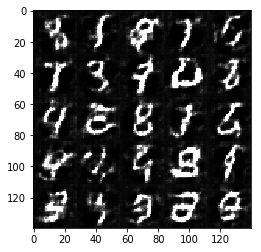

Epoch 1/2 Discriminator loss: 1.2545 Generator loss: 0.7759
Epoch 1/2 Discriminator loss: 1.2100 Generator loss: 0.8018
Epoch 1/2 Discriminator loss: 1.2309 Generator loss: 0.8873
Epoch 1/2 Discriminator loss: 1.2465 Generator loss: 0.6850
Epoch 1/2 Discriminator loss: 1.1117 Generator loss: 1.0111
Epoch 1/2 Discriminator loss: 1.1917 Generator loss: 0.7312
Epoch 1/2 Discriminator loss: 1.1495 Generator loss: 0.9441
Epoch 1/2 Discriminator loss: 1.2029 Generator loss: 0.8029
Epoch 1/2 Discriminator loss: 1.2330 Generator loss: 0.7838
Epoch 1/2 Discriminator loss: 1.2133 Generator loss: 0.8164
Epoch 1/2 Discriminator loss: 1.1683 Generator loss: 0.9048
Epoch 1/2 Discriminator loss: 1.2466 Generator loss: 0.7082
Epoch 1/2 Discriminator loss: 1.1249 Generator loss: 0.9394
Epoch 1/2 Discriminator loss: 1.2698 Generator loss: 0.6601
Epoch 1/2 Discriminator loss: 1.1370 Generator loss: 1.1279
Epoch 1/2 Discriminator loss: 1.2978 Generator loss: 0.5548
Epoch 1/2 Discriminator loss: 1.2959 Gen

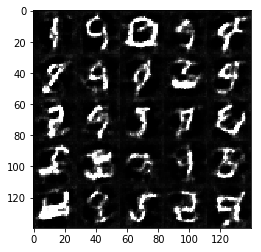

Epoch 1/2 Discriminator loss: 1.6849 Generator loss: 1.9528
Epoch 1/2 Discriminator loss: 1.3684 Generator loss: 0.5438
Epoch 1/2 Discriminator loss: 1.0708 Generator loss: 1.0936
Epoch 1/2 Discriminator loss: 1.2395 Generator loss: 0.6873
Epoch 1/2 Discriminator loss: 1.2489 Generator loss: 0.8514
Epoch 1/2 Discriminator loss: 1.2445 Generator loss: 0.7404
Epoch 1/2 Discriminator loss: 1.1554 Generator loss: 0.9280
Epoch 1/2 Discriminator loss: 1.2912 Generator loss: 0.6439
Epoch 1/2 Discriminator loss: 1.2029 Generator loss: 1.0662
Epoch 1/2 Discriminator loss: 1.2395 Generator loss: 0.6519
Epoch 1/2 Discriminator loss: 1.1755 Generator loss: 1.0623
Epoch 1/2 Discriminator loss: 1.2116 Generator loss: 0.7451
Epoch 1/2 Discriminator loss: 1.1350 Generator loss: 0.9064
Epoch 1/2 Discriminator loss: 1.1689 Generator loss: 0.8034
Epoch 1/2 Discriminator loss: 1.1242 Generator loss: 0.8479
Epoch 1/2 Discriminator loss: 1.1130 Generator loss: 0.8280
Epoch 1/2 Discriminator loss: 1.0966 Gen

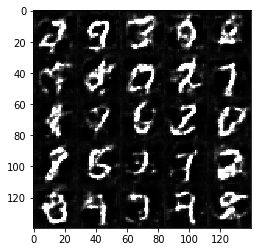

Epoch 1/2 Discriminator loss: 1.8376 Generator loss: 1.9929
Epoch 1/2 Discriminator loss: 2.1706 Generator loss: 0.2203
Epoch 1/2 Discriminator loss: 1.6553 Generator loss: 1.7357
Epoch 1/2 Discriminator loss: 1.2436 Generator loss: 0.7215
Epoch 1/2 Discriminator loss: 1.2613 Generator loss: 0.7246
Epoch 1/2 Discriminator loss: 1.2639 Generator loss: 0.9195
Epoch 1/2 Discriminator loss: 1.2907 Generator loss: 0.6527
Epoch 1/2 Discriminator loss: 1.2352 Generator loss: 0.9155
Epoch 1/2 Discriminator loss: 1.2261 Generator loss: 0.7288
Epoch 1/2 Discriminator loss: 1.1809 Generator loss: 0.9274
Epoch 1/2 Discriminator loss: 1.1551 Generator loss: 0.7914
Epoch 1/2 Discriminator loss: 1.1557 Generator loss: 0.8025
Epoch 1/2 Discriminator loss: 1.1438 Generator loss: 0.9503
Epoch 1/2 Discriminator loss: 1.2228 Generator loss: 0.6837
Epoch 1/2 Discriminator loss: 1.1550 Generator loss: 1.1839
Epoch 1/2 Discriminator loss: 1.2681 Generator loss: 0.6023
Epoch 1/2 Discriminator loss: 1.1823 Gen

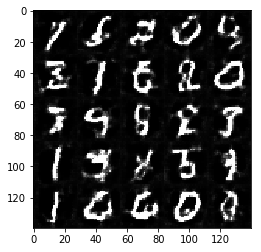

Epoch 1/2 Discriminator loss: 1.1569 Generator loss: 0.8164
Epoch 1/2 Discriminator loss: 1.1086 Generator loss: 0.9684
Epoch 1/2 Discriminator loss: 1.2437 Generator loss: 0.6103
Epoch 1/2 Discriminator loss: 1.2078 Generator loss: 1.5198
Epoch 1/2 Discriminator loss: 1.5875 Generator loss: 0.3815
Epoch 1/2 Discriminator loss: 1.6570 Generator loss: 1.6741
Epoch 1/2 Discriminator loss: 1.4927 Generator loss: 0.4429
Epoch 1/2 Discriminator loss: 1.6268 Generator loss: 1.9337
Epoch 1/2 Discriminator loss: 1.8219 Generator loss: 0.2894
Epoch 1/2 Discriminator loss: 1.5471 Generator loss: 1.6198
Epoch 1/2 Discriminator loss: 1.4669 Generator loss: 0.4825
Epoch 1/2 Discriminator loss: 1.2487 Generator loss: 1.0469
Epoch 1/2 Discriminator loss: 1.2870 Generator loss: 0.7030
Epoch 1/2 Discriminator loss: 1.2024 Generator loss: 0.8581
Epoch 1/2 Discriminator loss: 1.2018 Generator loss: 0.8580
Epoch 1/2 Discriminator loss: 1.2954 Generator loss: 0.6100
Epoch 1/2 Discriminator loss: 1.3272 Gen

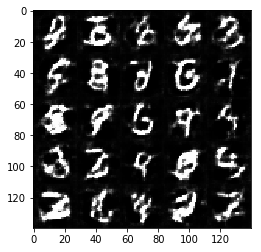

Epoch 1/2 Discriminator loss: 1.2322 Generator loss: 0.7268
Epoch 1/2 Discriminator loss: 1.2311 Generator loss: 0.7543
Epoch 1/2 Discriminator loss: 1.0908 Generator loss: 0.9799
Epoch 1/2 Discriminator loss: 1.0458 Generator loss: 1.0545
Epoch 1/2 Discriminator loss: 1.2549 Generator loss: 0.6381
Epoch 1/2 Discriminator loss: 1.1003 Generator loss: 1.2798
Epoch 1/2 Discriminator loss: 1.3260 Generator loss: 0.5099
Epoch 1/2 Discriminator loss: 1.3089 Generator loss: 1.7017
Epoch 1/2 Discriminator loss: 1.7371 Generator loss: 0.3074
Epoch 1/2 Discriminator loss: 1.4138 Generator loss: 1.7460
Epoch 1/2 Discriminator loss: 1.4469 Generator loss: 0.4541
Epoch 1/2 Discriminator loss: 1.2538 Generator loss: 1.3518
Epoch 1/2 Discriminator loss: 1.5283 Generator loss: 0.4136
Epoch 1/2 Discriminator loss: 1.2684 Generator loss: 1.5117
Epoch 1/2 Discriminator loss: 1.3620 Generator loss: 0.5352
Epoch 1/2 Discriminator loss: 1.1675 Generator loss: 1.0794
Epoch 1/2 Discriminator loss: 1.1840 Gen

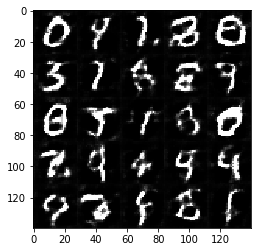

Epoch 1/2 Discriminator loss: 1.0830 Generator loss: 0.8889
Epoch 1/2 Discriminator loss: 1.0560 Generator loss: 1.0853
Epoch 1/2 Discriminator loss: 1.1919 Generator loss: 0.7014
Epoch 1/2 Discriminator loss: 1.1367 Generator loss: 0.9960
Epoch 1/2 Discriminator loss: 1.2959 Generator loss: 0.5782
Epoch 1/2 Discriminator loss: 1.0727 Generator loss: 1.2432
Epoch 1/2 Discriminator loss: 1.3495 Generator loss: 0.5452
Epoch 1/2 Discriminator loss: 1.9191 Generator loss: 2.2438
Epoch 1/2 Discriminator loss: 1.5848 Generator loss: 0.3872
Epoch 1/2 Discriminator loss: 2.0408 Generator loss: 1.9810
Epoch 1/2 Discriminator loss: 2.0082 Generator loss: 0.2387
Epoch 1/2 Discriminator loss: 1.4663 Generator loss: 1.3695
Epoch 1/2 Discriminator loss: 1.3053 Generator loss: 0.6630
Epoch 1/2 Discriminator loss: 1.3381 Generator loss: 0.8113
Epoch 1/2 Discriminator loss: 1.2532 Generator loss: 0.9263
Epoch 1/2 Discriminator loss: 1.2511 Generator loss: 0.6781
Epoch 1/2 Discriminator loss: 1.2587 Gen

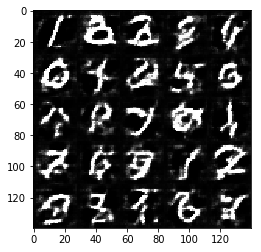

Epoch 1/2 Discriminator loss: 1.2015 Generator loss: 1.1842
Epoch 1/2 Discriminator loss: 1.2404 Generator loss: 0.6573
Epoch 1/2 Discriminator loss: 1.2551 Generator loss: 0.9514
Epoch 1/2 Discriminator loss: 1.2052 Generator loss: 0.7869
Epoch 1/2 Discriminator loss: 1.2939 Generator loss: 0.7478
Epoch 1/2 Discriminator loss: 1.2913 Generator loss: 0.6869
Epoch 1/2 Discriminator loss: 1.2779 Generator loss: 1.0634
Epoch 1/2 Discriminator loss: 1.4382 Generator loss: 0.4537
Epoch 1/2 Discriminator loss: 1.3842 Generator loss: 1.4835
Epoch 1/2 Discriminator loss: 1.4249 Generator loss: 0.4734
Epoch 1/2 Discriminator loss: 1.2408 Generator loss: 1.5154
Epoch 1/2 Discriminator loss: 1.4068 Generator loss: 0.4900
Epoch 1/2 Discriminator loss: 1.2111 Generator loss: 1.2525
Epoch 1/2 Discriminator loss: 1.2246 Generator loss: 0.6647
Epoch 1/2 Discriminator loss: 1.1910 Generator loss: 0.9471
Epoch 1/2 Discriminator loss: 1.1835 Generator loss: 0.8107
Epoch 1/2 Discriminator loss: 1.2664 Gen

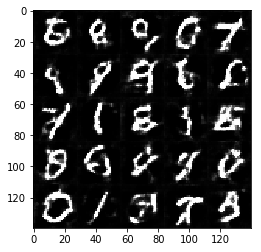

Epoch 1/2 Discriminator loss: 1.2128 Generator loss: 0.7014
Epoch 1/2 Discriminator loss: 1.1212 Generator loss: 1.0643
Epoch 1/2 Discriminator loss: 1.1703 Generator loss: 0.7388
Epoch 1/2 Discriminator loss: 1.1182 Generator loss: 1.0593
Epoch 1/2 Discriminator loss: 1.2172 Generator loss: 0.6476
Epoch 1/2 Discriminator loss: 1.1894 Generator loss: 1.2892
Epoch 1/2 Discriminator loss: 1.3429 Generator loss: 0.5182
Epoch 1/2 Discriminator loss: 1.1886 Generator loss: 1.2833
Epoch 1/2 Discriminator loss: 1.3870 Generator loss: 0.5149
Epoch 1/2 Discriminator loss: 1.4417 Generator loss: 1.5960
Epoch 1/2 Discriminator loss: 1.5741 Generator loss: 0.3807
Epoch 1/2 Discriminator loss: 1.8233 Generator loss: 2.2588
Epoch 1/2 Discriminator loss: 1.5768 Generator loss: 0.3850
Epoch 1/2 Discriminator loss: 1.3352 Generator loss: 1.3405
Epoch 1/2 Discriminator loss: 1.2608 Generator loss: 0.6562
Epoch 1/2 Discriminator loss: 1.2363 Generator loss: 0.8479
Epoch 1/2 Discriminator loss: 1.1101 Gen

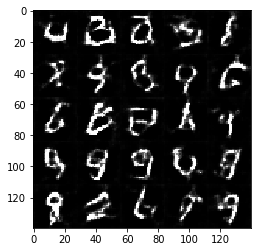

Epoch 1/2 Discriminator loss: 1.1700 Generator loss: 1.1575
Epoch 1/2 Discriminator loss: 1.3527 Generator loss: 0.5107
Epoch 1/2 Discriminator loss: 1.1962 Generator loss: 1.2377
Epoch 1/2 Discriminator loss: 1.3438 Generator loss: 0.5570
Epoch 1/2 Discriminator loss: 1.0663 Generator loss: 1.1426
Epoch 1/2 Discriminator loss: 1.2133 Generator loss: 0.6640
Epoch 1/2 Discriminator loss: 1.1648 Generator loss: 0.8022
Epoch 1/2 Discriminator loss: 1.0992 Generator loss: 1.0731
Epoch 1/2 Discriminator loss: 1.3457 Generator loss: 0.5202
Epoch 1/2 Discriminator loss: 1.1981 Generator loss: 1.3909
Epoch 1/2 Discriminator loss: 1.2953 Generator loss: 0.5511
Epoch 1/2 Discriminator loss: 1.1268 Generator loss: 1.2538
Epoch 1/2 Discriminator loss: 1.3053 Generator loss: 0.5631
Epoch 1/2 Discriminator loss: 1.2999 Generator loss: 1.7695
Epoch 1/2 Discriminator loss: 1.5305 Generator loss: 0.4292
Epoch 1/2 Discriminator loss: 1.6540 Generator loss: 1.8291
Epoch 1/2 Discriminator loss: 1.9615 Gen

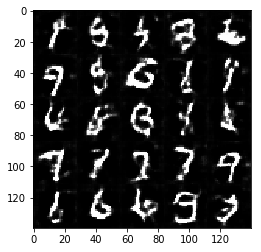

Epoch 1/2 Discriminator loss: 1.1617 Generator loss: 0.7715
Epoch 1/2 Discriminator loss: 1.1690 Generator loss: 0.9095
Epoch 1/2 Discriminator loss: 1.1485 Generator loss: 0.8092
Epoch 1/2 Discriminator loss: 1.1356 Generator loss: 0.8610
Epoch 1/2 Discriminator loss: 1.2342 Generator loss: 0.6735
Epoch 1/2 Discriminator loss: 1.0389 Generator loss: 1.1481
Epoch 1/2 Discriminator loss: 1.2595 Generator loss: 0.6352
Epoch 1/2 Discriminator loss: 1.0656 Generator loss: 1.2377
Epoch 1/2 Discriminator loss: 1.2612 Generator loss: 0.5844
Epoch 1/2 Discriminator loss: 1.1124 Generator loss: 1.1283
Epoch 1/2 Discriminator loss: 1.1632 Generator loss: 0.7304
Epoch 1/2 Discriminator loss: 1.0522 Generator loss: 1.0438
Epoch 1/2 Discriminator loss: 1.1916 Generator loss: 0.6566
Epoch 1/2 Discriminator loss: 1.1211 Generator loss: 1.1898
Epoch 1/2 Discriminator loss: 1.1324 Generator loss: 0.7071
Epoch 1/2 Discriminator loss: 1.1194 Generator loss: 1.3754
Epoch 1/2 Discriminator loss: 1.6440 Gen

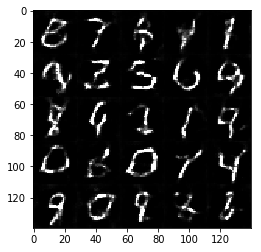

Epoch 1/2 Discriminator loss: 1.5467 Generator loss: 0.4026
Epoch 1/2 Discriminator loss: 1.6981 Generator loss: 1.9954
Epoch 1/2 Discriminator loss: 1.6400 Generator loss: 0.4016
Epoch 1/2 Discriminator loss: 1.3433 Generator loss: 1.4043
Epoch 1/2 Discriminator loss: 1.2431 Generator loss: 0.7391
Epoch 1/2 Discriminator loss: 1.2367 Generator loss: 0.7822
Epoch 1/2 Discriminator loss: 1.1333 Generator loss: 0.8811
Epoch 1/2 Discriminator loss: 1.1734 Generator loss: 0.7834
Epoch 1/2 Discriminator loss: 1.1905 Generator loss: 0.8783
Epoch 1/2 Discriminator loss: 1.1945 Generator loss: 0.6991
Epoch 1/2 Discriminator loss: 1.1426 Generator loss: 0.8330
Epoch 1/2 Discriminator loss: 1.2287 Generator loss: 0.8501
Epoch 1/2 Discriminator loss: 1.1407 Generator loss: 0.7694
Epoch 1/2 Discriminator loss: 1.0585 Generator loss: 1.0398
Epoch 1/2 Discriminator loss: 1.0322 Generator loss: 0.8164
Epoch 1/2 Discriminator loss: 1.0503 Generator loss: 1.1063
Epoch 1/2 Discriminator loss: 1.1746 Gen

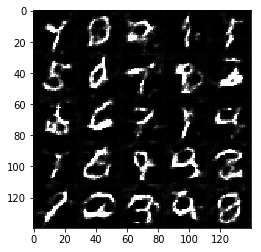

Epoch 1/2 Discriminator loss: 1.0602 Generator loss: 1.2627
Epoch 1/2 Discriminator loss: 1.3070 Generator loss: 0.5663
Epoch 1/2 Discriminator loss: 1.0763 Generator loss: 1.5304
Epoch 1/2 Discriminator loss: 1.4221 Generator loss: 0.4739
Epoch 1/2 Discriminator loss: 1.3613 Generator loss: 1.6463
Epoch 1/2 Discriminator loss: 1.5642 Generator loss: 0.4030
Epoch 1/2 Discriminator loss: 1.9388 Generator loss: 2.1171
Epoch 1/2 Discriminator loss: 2.1379 Generator loss: 0.2148
Epoch 1/2 Discriminator loss: 1.4930 Generator loss: 2.0706
Epoch 1/2 Discriminator loss: 1.3229 Generator loss: 0.6822
Epoch 1/2 Discriminator loss: 1.0769 Generator loss: 1.2894
Epoch 1/2 Discriminator loss: 1.0669 Generator loss: 0.9856
Epoch 1/2 Discriminator loss: 1.1601 Generator loss: 0.8560
Epoch 1/2 Discriminator loss: 1.1757 Generator loss: 0.7468
Epoch 1/2 Discriminator loss: 1.2216 Generator loss: 0.7806
Epoch 1/2 Discriminator loss: 1.1164 Generator loss: 0.9373
Epoch 1/2 Discriminator loss: 1.1995 Gen

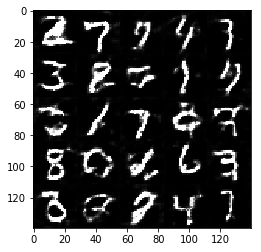

Epoch 1/2 Discriminator loss: 1.0519 Generator loss: 0.8719
Epoch 1/2 Discriminator loss: 1.0988 Generator loss: 0.9210
Epoch 1/2 Discriminator loss: 1.1155 Generator loss: 0.8860
Epoch 1/2 Discriminator loss: 1.1002 Generator loss: 0.7907
Epoch 1/2 Discriminator loss: 1.0245 Generator loss: 1.0270
Epoch 1/2 Discriminator loss: 1.2390 Generator loss: 0.6289
Epoch 1/2 Discriminator loss: 0.9816 Generator loss: 1.4633
Epoch 1/2 Discriminator loss: 1.3149 Generator loss: 0.5404
Epoch 1/2 Discriminator loss: 1.6113 Generator loss: 2.0158
Epoch 1/2 Discriminator loss: 1.7226 Generator loss: 0.3370
Epoch 1/2 Discriminator loss: 1.9872 Generator loss: 2.5783
Epoch 1/2 Discriminator loss: 1.7439 Generator loss: 0.3152
Epoch 1/2 Discriminator loss: 1.3027 Generator loss: 1.2979
Epoch 1/2 Discriminator loss: 1.3301 Generator loss: 0.6473
Epoch 1/2 Discriminator loss: 1.2865 Generator loss: 1.0676
Epoch 1/2 Discriminator loss: 1.3902 Generator loss: 0.5748
Epoch 1/2 Discriminator loss: 1.2917 Gen

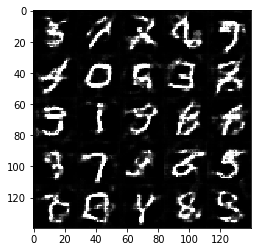

Epoch 1/2 Discriminator loss: 1.2681 Generator loss: 1.0639
Epoch 1/2 Discriminator loss: 1.1896 Generator loss: 0.7118
Epoch 1/2 Discriminator loss: 1.1621 Generator loss: 0.9151
Epoch 1/2 Discriminator loss: 1.1864 Generator loss: 0.8199
Epoch 1/2 Discriminator loss: 1.1221 Generator loss: 0.7995
Epoch 1/2 Discriminator loss: 1.1745 Generator loss: 1.0736
Epoch 1/2 Discriminator loss: 1.3220 Generator loss: 0.5668
Epoch 1/2 Discriminator loss: 1.1241 Generator loss: 1.2778
Epoch 1/2 Discriminator loss: 1.3226 Generator loss: 0.5696
Epoch 1/2 Discriminator loss: 1.0936 Generator loss: 1.3469
Epoch 1/2 Discriminator loss: 1.3502 Generator loss: 0.5304
Epoch 1/2 Discriminator loss: 1.1603 Generator loss: 1.7357
Epoch 1/2 Discriminator loss: 1.7171 Generator loss: 0.3181
Epoch 1/2 Discriminator loss: 1.4577 Generator loss: 1.9166
Epoch 1/2 Discriminator loss: 1.2864 Generator loss: 0.6148
Epoch 1/2 Discriminator loss: 1.1636 Generator loss: 1.0828
Epoch 1/2 Discriminator loss: 1.2101 Gen

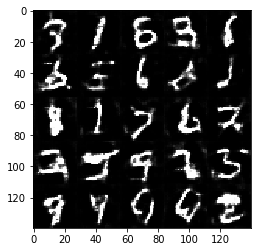

Epoch 1/2 Discriminator loss: 1.1299 Generator loss: 0.7508
Epoch 1/2 Discriminator loss: 1.0947 Generator loss: 1.0476
Epoch 1/2 Discriminator loss: 1.2495 Generator loss: 0.6464
Epoch 1/2 Discriminator loss: 1.1295 Generator loss: 1.2567
Epoch 1/2 Discriminator loss: 1.2888 Generator loss: 0.5794
Epoch 1/2 Discriminator loss: 1.1155 Generator loss: 1.2807
Epoch 1/2 Discriminator loss: 1.3160 Generator loss: 0.5240
Epoch 1/2 Discriminator loss: 1.3439 Generator loss: 1.7234
Epoch 1/2 Discriminator loss: 1.2927 Generator loss: 0.5878
Epoch 1/2 Discriminator loss: 1.2634 Generator loss: 1.5257
Epoch 1/2 Discriminator loss: 1.5234 Generator loss: 0.4197
Epoch 1/2 Discriminator loss: 1.4916 Generator loss: 2.0282
Epoch 1/2 Discriminator loss: 1.4858 Generator loss: 0.4408
Epoch 1/2 Discriminator loss: 1.1545 Generator loss: 1.1151
Epoch 1/2 Discriminator loss: 1.1967 Generator loss: 0.6962
Epoch 1/2 Discriminator loss: 1.1618 Generator loss: 0.8855
Epoch 1/2 Discriminator loss: 1.0588 Gen

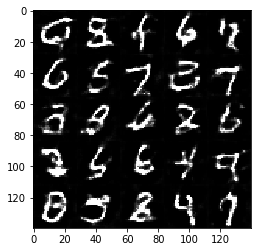

Epoch 1/2 Discriminator loss: 1.0969 Generator loss: 0.9107
Epoch 1/2 Discriminator loss: 1.0099 Generator loss: 0.9696
Epoch 1/2 Discriminator loss: 1.1102 Generator loss: 0.7957
Epoch 1/2 Discriminator loss: 1.0356 Generator loss: 1.1551
Epoch 1/2 Discriminator loss: 1.3101 Generator loss: 0.5374
Epoch 1/2 Discriminator loss: 1.1807 Generator loss: 1.6427
Epoch 1/2 Discriminator loss: 1.6792 Generator loss: 0.3646
Epoch 1/2 Discriminator loss: 1.6915 Generator loss: 1.9580
Epoch 1/2 Discriminator loss: 1.5065 Generator loss: 0.4444
Epoch 1/2 Discriminator loss: 1.7277 Generator loss: 2.1508
Epoch 1/2 Discriminator loss: 1.7028 Generator loss: 0.3577
Epoch 1/2 Discriminator loss: 1.2856 Generator loss: 1.5039
Epoch 1/2 Discriminator loss: 1.3683 Generator loss: 0.5595
Epoch 1/2 Discriminator loss: 1.1750 Generator loss: 0.8606
Epoch 1/2 Discriminator loss: 1.1466 Generator loss: 0.9694
Epoch 1/2 Discriminator loss: 1.1930 Generator loss: 0.8084
Epoch 1/2 Discriminator loss: 1.1498 Gen

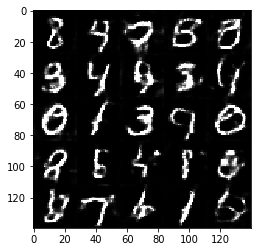

Epoch 1/2 Discriminator loss: 1.2002 Generator loss: 0.6940
Epoch 1/2 Discriminator loss: 1.0361 Generator loss: 1.1227
Epoch 1/2 Discriminator loss: 1.1471 Generator loss: 0.7117
Epoch 1/2 Discriminator loss: 1.0392 Generator loss: 1.0695
Epoch 1/2 Discriminator loss: 0.9938 Generator loss: 0.9051
Epoch 1/2 Discriminator loss: 1.0289 Generator loss: 0.9069
Epoch 1/2 Discriminator loss: 1.0590 Generator loss: 0.8370
Epoch 1/2 Discriminator loss: 0.9975 Generator loss: 1.3032
Epoch 1/2 Discriminator loss: 1.2881 Generator loss: 0.5657
Epoch 1/2 Discriminator loss: 1.0404 Generator loss: 1.3528
Epoch 1/2 Discriminator loss: 1.2895 Generator loss: 0.5741
Epoch 1/2 Discriminator loss: 1.5411 Generator loss: 2.0149
Epoch 1/2 Discriminator loss: 2.1509 Generator loss: 0.2086
Epoch 1/2 Discriminator loss: 1.9923 Generator loss: 2.5224
Epoch 1/2 Discriminator loss: 1.2505 Generator loss: 0.6165
Epoch 1/2 Discriminator loss: 1.2008 Generator loss: 1.8510
Epoch 1/2 Discriminator loss: 1.5190 Gen

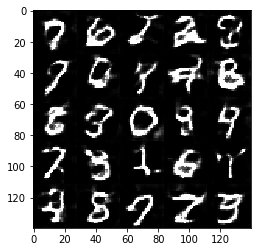

Epoch 1/2 Discriminator loss: 1.0756 Generator loss: 1.0057
Epoch 1/2 Discriminator loss: 1.0516 Generator loss: 0.8917
Epoch 1/2 Discriminator loss: 1.0799 Generator loss: 0.9021
Epoch 1/2 Discriminator loss: 1.1019 Generator loss: 0.8661
Epoch 1/2 Discriminator loss: 1.0464 Generator loss: 0.8225
Epoch 1/2 Discriminator loss: 0.9818 Generator loss: 1.3639
Epoch 1/2 Discriminator loss: 1.1357 Generator loss: 0.6749
Epoch 1/2 Discriminator loss: 1.1287 Generator loss: 1.0765
Epoch 1/2 Discriminator loss: 1.1619 Generator loss: 0.7040
Epoch 1/2 Discriminator loss: 0.9831 Generator loss: 1.3794
Epoch 1/2 Discriminator loss: 1.2330 Generator loss: 0.6211
Epoch 1/2 Discriminator loss: 1.0042 Generator loss: 1.2654
Epoch 1/2 Discriminator loss: 1.0526 Generator loss: 0.8151
Epoch 1/2 Discriminator loss: 1.1118 Generator loss: 0.7817
Epoch 1/2 Discriminator loss: 1.0090 Generator loss: 1.1462
Epoch 1/2 Discriminator loss: 1.1009 Generator loss: 0.7512
Epoch 1/2 Discriminator loss: 1.0315 Gen

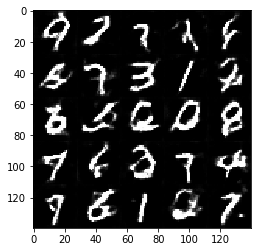

Epoch 1/2 Discriminator loss: 0.8741 Generator loss: 1.6928
Epoch 1/2 Discriminator loss: 1.2792 Generator loss: 0.5706
Epoch 1/2 Discriminator loss: 1.0457 Generator loss: 1.3005
Epoch 1/2 Discriminator loss: 1.2356 Generator loss: 0.6054
Epoch 1/2 Discriminator loss: 0.9802 Generator loss: 1.4906
Epoch 1/2 Discriminator loss: 1.2930 Generator loss: 0.5437
Epoch 1/2 Discriminator loss: 1.4676 Generator loss: 1.8698
Epoch 1/2 Discriminator loss: 1.2732 Generator loss: 0.7135
Epoch 1/2 Discriminator loss: 1.2033 Generator loss: 1.0512
Epoch 1/2 Discriminator loss: 1.6577 Generator loss: 0.3554
Epoch 1/2 Discriminator loss: 1.9883 Generator loss: 2.3539
Epoch 1/2 Discriminator loss: 1.9598 Generator loss: 0.2607
Epoch 1/2 Discriminator loss: 1.5109 Generator loss: 1.9354
Epoch 1/2 Discriminator loss: 1.3099 Generator loss: 0.6317
Epoch 1/2 Discriminator loss: 1.1397 Generator loss: 1.0763
Epoch 1/2 Discriminator loss: 1.1932 Generator loss: 0.8134
Epoch 1/2 Discriminator loss: 1.1773 Gen

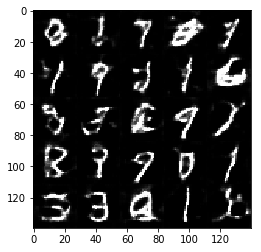

Epoch 1/2 Discriminator loss: 1.0979 Generator loss: 0.8553
Epoch 1/2 Discriminator loss: 1.0551 Generator loss: 0.9858
Epoch 1/2 Discriminator loss: 1.1594 Generator loss: 0.7662
Epoch 1/2 Discriminator loss: 1.0972 Generator loss: 1.0826
Epoch 1/2 Discriminator loss: 1.0981 Generator loss: 0.7767
Epoch 1/2 Discriminator loss: 1.0152 Generator loss: 1.2433
Epoch 1/2 Discriminator loss: 1.2901 Generator loss: 0.5538
Epoch 1/2 Discriminator loss: 1.1850 Generator loss: 1.8241
Epoch 1/2 Discriminator loss: 1.5065 Generator loss: 0.4472
Epoch 1/2 Discriminator loss: 1.3465 Generator loss: 2.0372
Epoch 1/2 Discriminator loss: 1.5710 Generator loss: 0.3983
Epoch 1/2 Discriminator loss: 1.9662 Generator loss: 2.7368
Epoch 1/2 Discriminator loss: 1.6449 Generator loss: 0.3475
Epoch 1/2 Discriminator loss: 1.4540 Generator loss: 1.8116
Epoch 1/2 Discriminator loss: 1.3443 Generator loss: 0.5889
Epoch 1/2 Discriminator loss: 1.1994 Generator loss: 1.0467
Epoch 1/2 Discriminator loss: 1.1765 Gen

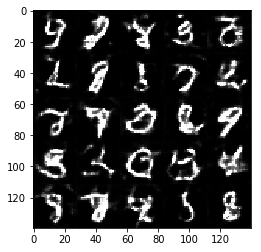

Epoch 1/2 Discriminator loss: 1.0985 Generator loss: 1.2478
Epoch 1/2 Discriminator loss: 1.1297 Generator loss: 0.7322
Epoch 1/2 Discriminator loss: 1.0268 Generator loss: 1.2113
Epoch 1/2 Discriminator loss: 1.2364 Generator loss: 0.6463
Epoch 1/2 Discriminator loss: 1.0472 Generator loss: 1.1427
Epoch 1/2 Discriminator loss: 1.1376 Generator loss: 0.7528
Epoch 1/2 Discriminator loss: 1.0414 Generator loss: 1.0798
Epoch 1/2 Discriminator loss: 1.1198 Generator loss: 0.8127
Epoch 1/2 Discriminator loss: 1.1094 Generator loss: 0.7522
Epoch 1/2 Discriminator loss: 0.9332 Generator loss: 1.1855
Epoch 1/2 Discriminator loss: 1.0573 Generator loss: 0.7963
Epoch 1/2 Discriminator loss: 0.9570 Generator loss: 1.1508
Epoch 1/2 Discriminator loss: 1.0751 Generator loss: 0.8568
Epoch 1/2 Discriminator loss: 0.9057 Generator loss: 1.1037
Epoch 1/2 Discriminator loss: 1.0077 Generator loss: 0.9306
Epoch 1/2 Discriminator loss: 0.9610 Generator loss: 1.0261
Epoch 1/2 Discriminator loss: 1.0772 Gen

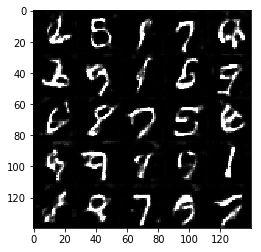

Epoch 1/2 Discriminator loss: 1.1617 Generator loss: 0.7252
Epoch 1/2 Discriminator loss: 1.1961 Generator loss: 1.5425
Epoch 1/2 Discriminator loss: 1.5062 Generator loss: 0.4213
Epoch 1/2 Discriminator loss: 1.9166 Generator loss: 2.7776
Epoch 1/2 Discriminator loss: 1.5110 Generator loss: 0.4198
Epoch 1/2 Discriminator loss: 1.2757 Generator loss: 1.3104
Epoch 1/2 Discriminator loss: 1.3549 Generator loss: 0.5281
Epoch 1/2 Discriminator loss: 1.0973 Generator loss: 1.0234
Epoch 1/2 Discriminator loss: 1.0714 Generator loss: 0.8914
Epoch 1/2 Discriminator loss: 0.9703 Generator loss: 0.9694
Epoch 1/2 Discriminator loss: 1.0035 Generator loss: 0.9484
Epoch 1/2 Discriminator loss: 1.0533 Generator loss: 0.8728
Epoch 1/2 Discriminator loss: 0.9688 Generator loss: 0.9365
Epoch 1/2 Discriminator loss: 0.9837 Generator loss: 0.9392
Epoch 1/2 Discriminator loss: 1.0632 Generator loss: 0.8488
Epoch 1/2 Discriminator loss: 0.9811 Generator loss: 1.1109
Epoch 1/2 Discriminator loss: 1.1549 Gen

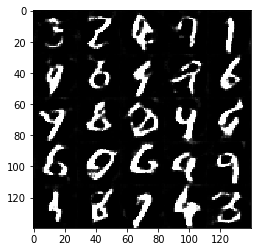

Epoch 1/2 Discriminator loss: 0.9082 Generator loss: 0.9177
Epoch 1/2 Discriminator loss: 0.8536 Generator loss: 1.7687
Epoch 1/2 Discriminator loss: 1.2325 Generator loss: 0.5763
Epoch 1/2 Discriminator loss: 1.0917 Generator loss: 1.8326
Epoch 1/2 Discriminator loss: 1.3280 Generator loss: 0.5455
Epoch 1/2 Discriminator loss: 1.1035 Generator loss: 1.6177
Epoch 1/2 Discriminator loss: 1.7717 Generator loss: 0.3512
Epoch 1/2 Discriminator loss: 1.7966 Generator loss: 2.9624
Epoch 1/2 Discriminator loss: 1.3326 Generator loss: 0.5464
Epoch 1/2 Discriminator loss: 0.9694 Generator loss: 1.2798
Epoch 1/2 Discriminator loss: 1.0591 Generator loss: 0.8064
Epoch 1/2 Discriminator loss: 0.9413 Generator loss: 1.0804
Epoch 1/2 Discriminator loss: 0.9463 Generator loss: 1.0728
Epoch 1/2 Discriminator loss: 1.1109 Generator loss: 0.7113
Epoch 1/2 Discriminator loss: 0.9596 Generator loss: 1.5634
Epoch 1/2 Discriminator loss: 1.1022 Generator loss: 0.7182
Epoch 1/2 Discriminator loss: 0.9330 Gen

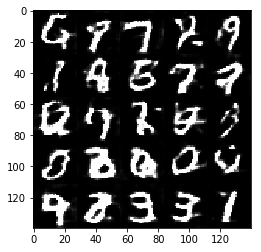

Epoch 1/2 Discriminator loss: 1.0399 Generator loss: 0.7579
Epoch 1/2 Discriminator loss: 0.9796 Generator loss: 1.7961
Epoch 1/2 Discriminator loss: 1.5984 Generator loss: 0.3760
Epoch 1/2 Discriminator loss: 2.4149 Generator loss: 2.8949
Epoch 1/2 Discriminator loss: 1.1060 Generator loss: 0.8898
Epoch 1/2 Discriminator loss: 1.1181 Generator loss: 1.1313
Epoch 1/2 Discriminator loss: 1.2029 Generator loss: 0.6987
Epoch 1/2 Discriminator loss: 1.1792 Generator loss: 1.3037
Epoch 1/2 Discriminator loss: 1.4233 Generator loss: 0.5050
Epoch 1/2 Discriminator loss: 1.3163 Generator loss: 1.6633
Epoch 1/2 Discriminator loss: 1.6151 Generator loss: 0.3973
Epoch 1/2 Discriminator loss: 1.3997 Generator loss: 1.6888
Epoch 1/2 Discriminator loss: 1.4672 Generator loss: 0.4713
Epoch 1/2 Discriminator loss: 1.2270 Generator loss: 1.2553
Epoch 1/2 Discriminator loss: 1.1619 Generator loss: 0.7532
Epoch 1/2 Discriminator loss: 1.1811 Generator loss: 0.8238
Epoch 1/2 Discriminator loss: 1.0350 Gen

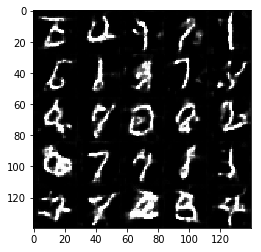

Epoch 1/2 Discriminator loss: 1.0977 Generator loss: 0.8397
Epoch 1/2 Discriminator loss: 1.1659 Generator loss: 1.4138
Epoch 1/2 Discriminator loss: 1.4168 Generator loss: 0.4886
Epoch 1/2 Discriminator loss: 1.1768 Generator loss: 1.8646
Epoch 1/2 Discriminator loss: 1.3696 Generator loss: 0.5539
Epoch 1/2 Discriminator loss: 1.1074 Generator loss: 1.2045
Epoch 1/2 Discriminator loss: 1.2442 Generator loss: 0.5995
Epoch 1/2 Discriminator loss: 1.0289 Generator loss: 1.2673
Epoch 1/2 Discriminator loss: 1.1111 Generator loss: 0.7299
Epoch 1/2 Discriminator loss: 0.9696 Generator loss: 1.2217
Epoch 1/2 Discriminator loss: 1.0069 Generator loss: 0.8786
Epoch 1/2 Discriminator loss: 0.9272 Generator loss: 1.1444
Epoch 1/2 Discriminator loss: 0.9876 Generator loss: 0.9527
Epoch 1/2 Discriminator loss: 0.9753 Generator loss: 1.0455
Epoch 1/2 Discriminator loss: 0.8907 Generator loss: 1.0855
Epoch 1/2 Discriminator loss: 1.0068 Generator loss: 0.8642
Epoch 1/2 Discriminator loss: 0.9069 Gen

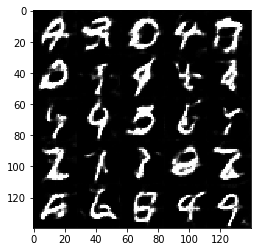

Epoch 1/2 Discriminator loss: 1.7977 Generator loss: 2.4281
Epoch 1/2 Discriminator loss: 1.6282 Generator loss: 0.4292
Epoch 1/2 Discriminator loss: 2.2261 Generator loss: 2.4923
Epoch 1/2 Discriminator loss: 1.9583 Generator loss: 0.2856
Epoch 1/2 Discriminator loss: 1.2069 Generator loss: 1.5484
Epoch 1/2 Discriminator loss: 1.1260 Generator loss: 0.9128
Epoch 1/2 Discriminator loss: 1.2330 Generator loss: 0.7840
Epoch 1/2 Discriminator loss: 1.0217 Generator loss: 1.0428
Epoch 1/2 Discriminator loss: 1.3196 Generator loss: 0.5708
Epoch 1/2 Discriminator loss: 1.0816 Generator loss: 1.3420
Epoch 1/2 Discriminator loss: 1.3130 Generator loss: 0.5793
Epoch 1/2 Discriminator loss: 1.0536 Generator loss: 1.2570
Epoch 1/2 Discriminator loss: 1.0995 Generator loss: 0.8002
Epoch 1/2 Discriminator loss: 1.0026 Generator loss: 1.2278
Epoch 1/2 Discriminator loss: 1.1718 Generator loss: 0.7454
Epoch 1/2 Discriminator loss: 1.0263 Generator loss: 0.9697
Epoch 1/2 Discriminator loss: 1.0447 Gen

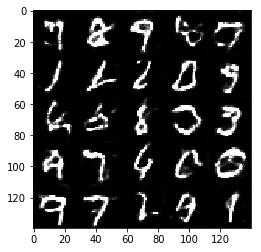

Epoch 1/2 Discriminator loss: 1.0718 Generator loss: 0.7756
Epoch 1/2 Discriminator loss: 0.8639 Generator loss: 1.1266
Epoch 1/2 Discriminator loss: 0.8036 Generator loss: 1.3064
Epoch 1/2 Discriminator loss: 0.9274 Generator loss: 0.9910
Epoch 1/2 Discriminator loss: 0.9446 Generator loss: 0.8961
Epoch 1/2 Discriminator loss: 0.9446 Generator loss: 1.2542
Epoch 1/2 Discriminator loss: 1.1171 Generator loss: 0.7243
Epoch 1/2 Discriminator loss: 0.8911 Generator loss: 1.7755
Epoch 1/2 Discriminator loss: 1.1390 Generator loss: 0.6928
Epoch 1/2 Discriminator loss: 1.1418 Generator loss: 2.0055
Epoch 1/2 Discriminator loss: 1.1799 Generator loss: 0.7117
Epoch 1/2 Discriminator loss: 0.9887 Generator loss: 0.9850
Epoch 1/2 Discriminator loss: 0.9358 Generator loss: 1.1500
Epoch 1/2 Discriminator loss: 1.1166 Generator loss: 0.7466
Epoch 1/2 Discriminator loss: 1.1442 Generator loss: 1.6744
Epoch 1/2 Discriminator loss: 1.9208 Generator loss: 0.2809
Epoch 1/2 Discriminator loss: 1.8535 Gen

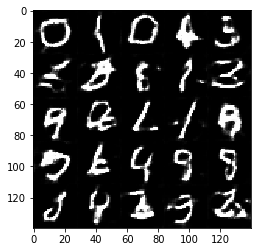

Epoch 1/2 Discriminator loss: 1.8671 Generator loss: 2.6159
Epoch 1/2 Discriminator loss: 1.5617 Generator loss: 0.4117
Epoch 1/2 Discriminator loss: 1.1160 Generator loss: 1.2043
Epoch 1/2 Discriminator loss: 1.1231 Generator loss: 0.8159
Epoch 1/2 Discriminator loss: 1.0765 Generator loss: 1.0146
Epoch 1/2 Discriminator loss: 1.0254 Generator loss: 0.9850
Epoch 1/2 Discriminator loss: 1.0557 Generator loss: 0.7829
Epoch 1/2 Discriminator loss: 0.9572 Generator loss: 1.2536
Epoch 1/2 Discriminator loss: 1.0861 Generator loss: 0.7485
Epoch 1/2 Discriminator loss: 0.9586 Generator loss: 1.2643
Epoch 1/2 Discriminator loss: 1.1738 Generator loss: 0.6699
Epoch 1/2 Discriminator loss: 1.0412 Generator loss: 1.6794
Epoch 1/2 Discriminator loss: 1.0045 Generator loss: 0.8583
Epoch 1/2 Discriminator loss: 1.0671 Generator loss: 1.5338
Epoch 1/2 Discriminator loss: 1.1937 Generator loss: 0.6105
Epoch 1/2 Discriminator loss: 1.0159 Generator loss: 1.5701
Epoch 1/2 Discriminator loss: 1.4357 Gen

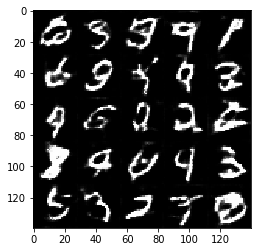

Epoch 1/2 Discriminator loss: 1.1066 Generator loss: 0.7623
Epoch 1/2 Discriminator loss: 0.9430 Generator loss: 1.2331
Epoch 1/2 Discriminator loss: 1.0400 Generator loss: 0.8860
Epoch 1/2 Discriminator loss: 0.9088 Generator loss: 1.4793
Epoch 1/2 Discriminator loss: 1.0068 Generator loss: 0.8112
Epoch 1/2 Discriminator loss: 0.9082 Generator loss: 1.0811
Epoch 1/2 Discriminator loss: 0.9118 Generator loss: 1.3883
Epoch 1/2 Discriminator loss: 1.0500 Generator loss: 0.8236
Epoch 1/2 Discriminator loss: 1.0054 Generator loss: 1.6761
Epoch 1/2 Discriminator loss: 1.3846 Generator loss: 0.5886
Epoch 1/2 Discriminator loss: 1.1047 Generator loss: 1.6303
Epoch 1/2 Discriminator loss: 1.1687 Generator loss: 0.7543
Epoch 1/2 Discriminator loss: 1.1469 Generator loss: 1.9377
Epoch 1/2 Discriminator loss: 1.6243 Generator loss: 0.3979
Epoch 1/2 Discriminator loss: 1.4025 Generator loss: 2.2129
Epoch 1/2 Discriminator loss: 1.2613 Generator loss: 0.5950
Epoch 1/2 Discriminator loss: 1.1224 Gen

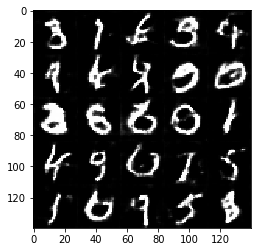

Epoch 1/2 Discriminator loss: 1.0097 Generator loss: 1.2385
Epoch 1/2 Discriminator loss: 0.9861 Generator loss: 0.9153
Epoch 1/2 Discriminator loss: 0.9476 Generator loss: 1.1154
Epoch 1/2 Discriminator loss: 0.8377 Generator loss: 1.2703
Epoch 1/2 Discriminator loss: 0.9319 Generator loss: 0.9725
Epoch 1/2 Discriminator loss: 0.8362 Generator loss: 1.4234
Epoch 1/2 Discriminator loss: 1.0719 Generator loss: 0.7781
Epoch 1/2 Discriminator loss: 0.7693 Generator loss: 1.9903
Epoch 1/2 Discriminator loss: 1.0517 Generator loss: 0.7971
Epoch 1/2 Discriminator loss: 1.1182 Generator loss: 2.3788
Epoch 1/2 Discriminator loss: 1.6241 Generator loss: 0.4373
Epoch 1/2 Discriminator loss: 1.6957 Generator loss: 2.6023
Epoch 1/2 Discriminator loss: 2.3110 Generator loss: 0.1958
Epoch 1/2 Discriminator loss: 1.3928 Generator loss: 2.3697
Epoch 1/2 Discriminator loss: 1.1717 Generator loss: 0.7310
Epoch 1/2 Discriminator loss: 1.0301 Generator loss: 0.8848
Epoch 1/2 Discriminator loss: 1.0482 Gen

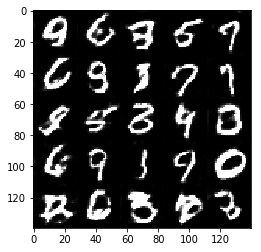

Epoch 1/2 Discriminator loss: 0.9146 Generator loss: 1.1341
Epoch 1/2 Discriminator loss: 0.9614 Generator loss: 1.0016
Epoch 1/2 Discriminator loss: 1.1286 Generator loss: 0.6972
Epoch 1/2 Discriminator loss: 0.9067 Generator loss: 1.2827
Epoch 1/2 Discriminator loss: 1.1849 Generator loss: 0.6584
Epoch 1/2 Discriminator loss: 0.8597 Generator loss: 1.5924
Epoch 1/2 Discriminator loss: 1.0206 Generator loss: 0.8349
Epoch 1/2 Discriminator loss: 0.8785 Generator loss: 1.4634
Epoch 1/2 Discriminator loss: 1.0615 Generator loss: 0.7667
Epoch 1/2 Discriminator loss: 0.7991 Generator loss: 1.4857
Epoch 1/2 Discriminator loss: 1.4225 Generator loss: 0.4907
Epoch 1/2 Discriminator loss: 1.1297 Generator loss: 2.0259
Epoch 1/2 Discriminator loss: 1.1888 Generator loss: 0.6584
Epoch 1/2 Discriminator loss: 0.8903 Generator loss: 1.9432
Epoch 1/2 Discriminator loss: 1.6173 Generator loss: 0.3876
Epoch 1/2 Discriminator loss: 1.8358 Generator loss: 2.6200
Epoch 1/2 Discriminator loss: 1.0207 Gen

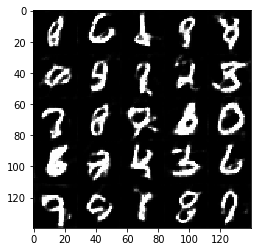

Epoch 1/2 Discriminator loss: 1.1528 Generator loss: 1.0696
Epoch 1/2 Discriminator loss: 1.0685 Generator loss: 0.8426
Epoch 1/2 Discriminator loss: 1.0381 Generator loss: 0.9416
Epoch 1/2 Discriminator loss: 1.0849 Generator loss: 0.7573
Epoch 1/2 Discriminator loss: 1.0345 Generator loss: 1.7106
Epoch 1/2 Discriminator loss: 1.6692 Generator loss: 0.3857
Epoch 1/2 Discriminator loss: 1.6386 Generator loss: 2.7632
Epoch 1/2 Discriminator loss: 1.5286 Generator loss: 0.4316
Epoch 1/2 Discriminator loss: 1.7527 Generator loss: 2.3143
Epoch 1/2 Discriminator loss: 1.6140 Generator loss: 0.4379
Epoch 1/2 Discriminator loss: 1.0021 Generator loss: 1.7136
Epoch 1/2 Discriminator loss: 0.9731 Generator loss: 1.0217
Epoch 1/2 Discriminator loss: 0.9820 Generator loss: 0.9884
Epoch 1/2 Discriminator loss: 0.9396 Generator loss: 1.3074
Epoch 1/2 Discriminator loss: 1.1892 Generator loss: 0.7016
Epoch 1/2 Discriminator loss: 0.9900 Generator loss: 1.0318
Epoch 1/2 Discriminator loss: 1.0812 Gen

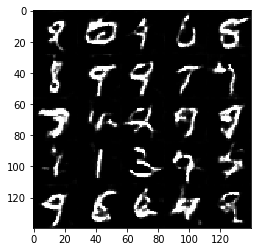

Epoch 2/2 Discriminator loss: 0.8797 Generator loss: 1.2115
Epoch 2/2 Discriminator loss: 0.8908 Generator loss: 1.0301
Epoch 2/2 Discriminator loss: 0.8006 Generator loss: 1.2152
Epoch 2/2 Discriminator loss: 0.9232 Generator loss: 0.9748
Epoch 2/2 Discriminator loss: 0.8486 Generator loss: 1.3943
Epoch 2/2 Discriminator loss: 0.9420 Generator loss: 0.9118
Epoch 2/2 Discriminator loss: 0.8064 Generator loss: 1.2553
Epoch 2/2 Discriminator loss: 0.8861 Generator loss: 1.1769
Epoch 2/2 Discriminator loss: 0.9674 Generator loss: 0.8893
Epoch 2/2 Discriminator loss: 0.8492 Generator loss: 1.2522
Epoch 2/2 Discriminator loss: 0.7639 Generator loss: 1.4626
Epoch 2/2 Discriminator loss: 1.1356 Generator loss: 0.6812
Epoch 2/2 Discriminator loss: 0.9847 Generator loss: 2.1656
Epoch 2/2 Discriminator loss: 1.5707 Generator loss: 0.4066
Epoch 2/2 Discriminator loss: 2.2455 Generator loss: 3.4772
Epoch 2/2 Discriminator loss: 1.5521 Generator loss: 0.4155
Epoch 2/2 Discriminator loss: 1.7631 Gen

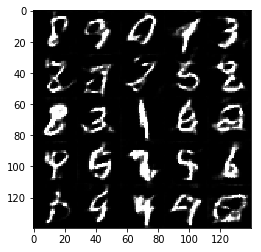

Epoch 2/2 Discriminator loss: 1.1283 Generator loss: 0.8515
Epoch 2/2 Discriminator loss: 1.0479 Generator loss: 0.8993
Epoch 2/2 Discriminator loss: 1.0495 Generator loss: 0.9546
Epoch 2/2 Discriminator loss: 1.0993 Generator loss: 0.9304
Epoch 2/2 Discriminator loss: 0.8729 Generator loss: 1.1789
Epoch 2/2 Discriminator loss: 0.7758 Generator loss: 1.2400
Epoch 2/2 Discriminator loss: 0.7248 Generator loss: 1.6782
Epoch 2/2 Discriminator loss: 0.9591 Generator loss: 0.8612
Epoch 2/2 Discriminator loss: 0.8813 Generator loss: 1.6529
Epoch 2/2 Discriminator loss: 0.8879 Generator loss: 1.0342
Epoch 2/2 Discriminator loss: 0.9572 Generator loss: 0.9853
Epoch 2/2 Discriminator loss: 0.7736 Generator loss: 1.3454
Epoch 2/2 Discriminator loss: 0.9078 Generator loss: 1.0182
Epoch 2/2 Discriminator loss: 0.8276 Generator loss: 1.3177
Epoch 2/2 Discriminator loss: 1.0414 Generator loss: 0.8262
Epoch 2/2 Discriminator loss: 0.9544 Generator loss: 1.8084
Epoch 2/2 Discriminator loss: 1.6387 Gen

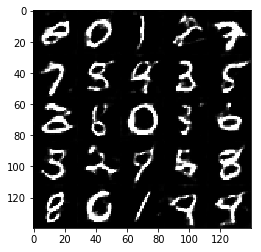

Epoch 2/2 Discriminator loss: 1.9250 Generator loss: 0.2983
Epoch 2/2 Discriminator loss: 1.0754 Generator loss: 1.7798
Epoch 2/2 Discriminator loss: 1.3607 Generator loss: 0.5285
Epoch 2/2 Discriminator loss: 0.9907 Generator loss: 1.6575
Epoch 2/2 Discriminator loss: 1.2902 Generator loss: 0.5799
Epoch 2/2 Discriminator loss: 1.0258 Generator loss: 1.2617
Epoch 2/2 Discriminator loss: 1.1947 Generator loss: 0.6422
Epoch 2/2 Discriminator loss: 0.9039 Generator loss: 1.5261
Epoch 2/2 Discriminator loss: 1.0796 Generator loss: 0.7743
Epoch 2/2 Discriminator loss: 0.8763 Generator loss: 1.6446
Epoch 2/2 Discriminator loss: 0.9394 Generator loss: 0.9395
Epoch 2/2 Discriminator loss: 0.8757 Generator loss: 1.2711
Epoch 2/2 Discriminator loss: 0.8725 Generator loss: 1.1373
Epoch 2/2 Discriminator loss: 1.1103 Generator loss: 0.7965
Epoch 2/2 Discriminator loss: 0.7912 Generator loss: 1.7910
Epoch 2/2 Discriminator loss: 0.9840 Generator loss: 0.8350
Epoch 2/2 Discriminator loss: 0.8110 Gen

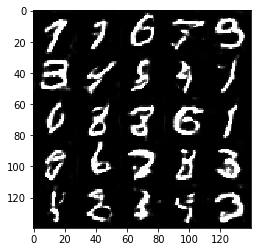

Epoch 2/2 Discriminator loss: 0.8224 Generator loss: 1.3394
Epoch 2/2 Discriminator loss: 1.1032 Generator loss: 0.7069
Epoch 2/2 Discriminator loss: 0.8685 Generator loss: 1.7626
Epoch 2/2 Discriminator loss: 0.9092 Generator loss: 0.9842
Epoch 2/2 Discriminator loss: 0.8146 Generator loss: 1.2292
Epoch 2/2 Discriminator loss: 0.8656 Generator loss: 1.0919
Epoch 2/2 Discriminator loss: 0.7399 Generator loss: 1.5542
Epoch 2/2 Discriminator loss: 0.7977 Generator loss: 1.2004
Epoch 2/2 Discriminator loss: 0.7543 Generator loss: 1.5631
Epoch 2/2 Discriminator loss: 0.7568 Generator loss: 1.2113
Epoch 2/2 Discriminator loss: 0.7112 Generator loss: 1.4119
Epoch 2/2 Discriminator loss: 0.8132 Generator loss: 1.2323
Epoch 2/2 Discriminator loss: 0.8269 Generator loss: 1.2141
Epoch 2/2 Discriminator loss: 1.1515 Generator loss: 0.6744
Epoch 2/2 Discriminator loss: 0.7733 Generator loss: 1.8771
Epoch 2/2 Discriminator loss: 1.3641 Generator loss: 0.5380
Epoch 2/2 Discriminator loss: 1.3410 Gen

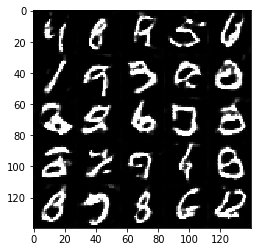

Epoch 2/2 Discriminator loss: 1.2736 Generator loss: 1.9863
Epoch 2/2 Discriminator loss: 1.4761 Generator loss: 0.4712
Epoch 2/2 Discriminator loss: 1.1845 Generator loss: 1.5992
Epoch 2/2 Discriminator loss: 1.2403 Generator loss: 0.6125
Epoch 2/2 Discriminator loss: 1.0926 Generator loss: 1.2514
Epoch 2/2 Discriminator loss: 1.2082 Generator loss: 0.6710
Epoch 2/2 Discriminator loss: 1.2777 Generator loss: 1.8076
Epoch 2/2 Discriminator loss: 1.6089 Generator loss: 0.4111
Epoch 2/2 Discriminator loss: 1.0288 Generator loss: 1.7777
Epoch 2/2 Discriminator loss: 1.2789 Generator loss: 0.6513
Epoch 2/2 Discriminator loss: 0.9028 Generator loss: 1.2402
Epoch 2/2 Discriminator loss: 0.9433 Generator loss: 1.0738
Epoch 2/2 Discriminator loss: 0.9694 Generator loss: 0.9250
Epoch 2/2 Discriminator loss: 0.9177 Generator loss: 1.0621
Epoch 2/2 Discriminator loss: 1.0306 Generator loss: 0.9151
Epoch 2/2 Discriminator loss: 0.9647 Generator loss: 1.0847
Epoch 2/2 Discriminator loss: 0.9182 Gen

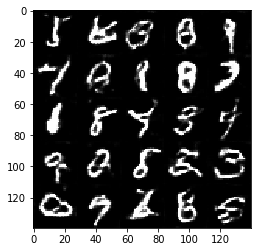

Epoch 2/2 Discriminator loss: 0.9145 Generator loss: 0.9774
Epoch 2/2 Discriminator loss: 0.8687 Generator loss: 1.1921
Epoch 2/2 Discriminator loss: 0.9874 Generator loss: 0.8568
Epoch 2/2 Discriminator loss: 0.7619 Generator loss: 1.7642
Epoch 2/2 Discriminator loss: 1.1362 Generator loss: 0.7008
Epoch 2/2 Discriminator loss: 1.1185 Generator loss: 1.9509
Epoch 2/2 Discriminator loss: 1.1501 Generator loss: 0.7052
Epoch 2/2 Discriminator loss: 1.0613 Generator loss: 1.5617
Epoch 2/2 Discriminator loss: 1.2998 Generator loss: 0.5619
Epoch 2/2 Discriminator loss: 0.9380 Generator loss: 1.7902
Epoch 2/2 Discriminator loss: 1.2067 Generator loss: 0.6487
Epoch 2/2 Discriminator loss: 0.7944 Generator loss: 1.5869
Epoch 2/2 Discriminator loss: 1.0342 Generator loss: 0.7975
Epoch 2/2 Discriminator loss: 0.7349 Generator loss: 1.8844
Epoch 2/2 Discriminator loss: 0.7357 Generator loss: 1.2723
Epoch 2/2 Discriminator loss: 0.6888 Generator loss: 1.5710
Epoch 2/2 Discriminator loss: 0.7222 Gen

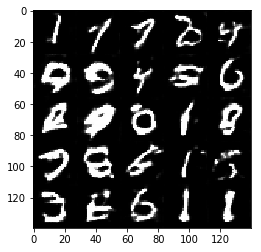

Epoch 2/2 Discriminator loss: 0.9082 Generator loss: 0.9857
Epoch 2/2 Discriminator loss: 0.6816 Generator loss: 1.5219
Epoch 2/2 Discriminator loss: 0.7660 Generator loss: 1.2458
Epoch 2/2 Discriminator loss: 0.6960 Generator loss: 1.5605
Epoch 2/2 Discriminator loss: 0.9793 Generator loss: 0.8377
Epoch 2/2 Discriminator loss: 0.8914 Generator loss: 2.1653
Epoch 2/2 Discriminator loss: 1.5603 Generator loss: 0.4831
Epoch 2/2 Discriminator loss: 1.5105 Generator loss: 2.3032
Epoch 2/2 Discriminator loss: 2.5496 Generator loss: 0.1994
Epoch 2/2 Discriminator loss: 3.5733 Generator loss: 4.2954
Epoch 2/2 Discriminator loss: 1.3785 Generator loss: 0.6132
Epoch 2/2 Discriminator loss: 1.1928 Generator loss: 0.8679
Epoch 2/2 Discriminator loss: 1.0968 Generator loss: 1.4291
Epoch 2/2 Discriminator loss: 1.2057 Generator loss: 0.6834
Epoch 2/2 Discriminator loss: 0.9466 Generator loss: 1.3330
Epoch 2/2 Discriminator loss: 1.1097 Generator loss: 0.8264
Epoch 2/2 Discriminator loss: 0.9245 Gen

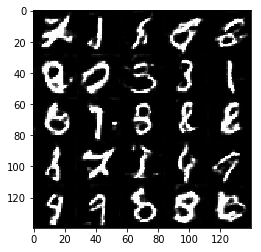

Epoch 2/2 Discriminator loss: 0.9049 Generator loss: 1.0120
Epoch 2/2 Discriminator loss: 0.9689 Generator loss: 0.9696
Epoch 2/2 Discriminator loss: 0.8785 Generator loss: 1.2266
Epoch 2/2 Discriminator loss: 0.9028 Generator loss: 0.9928
Epoch 2/2 Discriminator loss: 0.7996 Generator loss: 1.6555
Epoch 2/2 Discriminator loss: 1.0593 Generator loss: 0.8253
Epoch 2/2 Discriminator loss: 1.0210 Generator loss: 2.1590
Epoch 2/2 Discriminator loss: 1.2004 Generator loss: 0.6846
Epoch 2/2 Discriminator loss: 1.1133 Generator loss: 1.6547
Epoch 2/2 Discriminator loss: 1.9913 Generator loss: 0.2711
Epoch 2/2 Discriminator loss: 1.6562 Generator loss: 3.0693
Epoch 2/2 Discriminator loss: 1.1613 Generator loss: 0.7487
Epoch 2/2 Discriminator loss: 0.9783 Generator loss: 1.1935
Epoch 2/2 Discriminator loss: 0.9924 Generator loss: 0.9015
Epoch 2/2 Discriminator loss: 0.8407 Generator loss: 1.3766
Epoch 2/2 Discriminator loss: 0.9643 Generator loss: 0.8689
Epoch 2/2 Discriminator loss: 0.8636 Gen

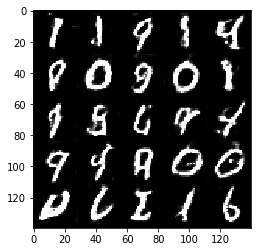

Epoch 2/2 Discriminator loss: 0.7173 Generator loss: 1.4773
Epoch 2/2 Discriminator loss: 0.9512 Generator loss: 0.9377
Epoch 2/2 Discriminator loss: 0.8078 Generator loss: 1.4131
Epoch 2/2 Discriminator loss: 0.6990 Generator loss: 1.4191
Epoch 2/2 Discriminator loss: 0.9901 Generator loss: 0.8979
Epoch 2/2 Discriminator loss: 0.7649 Generator loss: 1.4700
Epoch 2/2 Discriminator loss: 0.8363 Generator loss: 1.1123
Epoch 2/2 Discriminator loss: 0.7690 Generator loss: 1.3193
Epoch 2/2 Discriminator loss: 0.8082 Generator loss: 1.1830
Epoch 2/2 Discriminator loss: 0.7188 Generator loss: 1.4076
Epoch 2/2 Discriminator loss: 0.7352 Generator loss: 1.7219
Epoch 2/2 Discriminator loss: 1.1875 Generator loss: 0.7408
Epoch 2/2 Discriminator loss: 0.7527 Generator loss: 2.5455
Epoch 2/2 Discriminator loss: 0.8865 Generator loss: 1.0155
Epoch 2/2 Discriminator loss: 0.7360 Generator loss: 1.7076
Epoch 2/2 Discriminator loss: 0.9269 Generator loss: 0.9444
Epoch 2/2 Discriminator loss: 0.7573 Gen

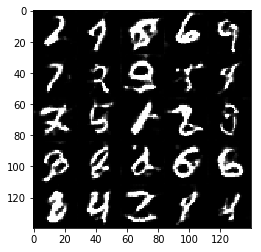

Epoch 2/2 Discriminator loss: 0.9010 Generator loss: 1.1540
Epoch 2/2 Discriminator loss: 0.9492 Generator loss: 0.9057
Epoch 2/2 Discriminator loss: 0.5999 Generator loss: 2.0065
Epoch 2/2 Discriminator loss: 0.8281 Generator loss: 1.0427
Epoch 2/2 Discriminator loss: 0.7006 Generator loss: 1.6492
Epoch 2/2 Discriminator loss: 0.9362 Generator loss: 0.9177
Epoch 2/2 Discriminator loss: 0.6019 Generator loss: 2.2725
Epoch 2/2 Discriminator loss: 0.9805 Generator loss: 0.8933
Epoch 2/2 Discriminator loss: 0.6635 Generator loss: 1.6023
Epoch 2/2 Discriminator loss: 0.8268 Generator loss: 1.1485
Epoch 2/2 Discriminator loss: 0.5693 Generator loss: 2.4007
Epoch 2/2 Discriminator loss: 1.0825 Generator loss: 0.7697
Epoch 2/2 Discriminator loss: 0.7570 Generator loss: 1.8559
Epoch 2/2 Discriminator loss: 1.0082 Generator loss: 0.8643
Epoch 2/2 Discriminator loss: 0.7882 Generator loss: 1.7339
Epoch 2/2 Discriminator loss: 1.3911 Generator loss: 0.5222
Epoch 2/2 Discriminator loss: 1.6149 Gen

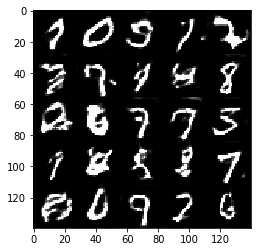

Epoch 2/2 Discriminator loss: 1.4935 Generator loss: 0.4888
Epoch 2/2 Discriminator loss: 0.9757 Generator loss: 1.3977
Epoch 2/2 Discriminator loss: 1.0470 Generator loss: 0.9059
Epoch 2/2 Discriminator loss: 0.9910 Generator loss: 1.0990
Epoch 2/2 Discriminator loss: 1.0389 Generator loss: 1.1073
Epoch 2/2 Discriminator loss: 1.2189 Generator loss: 0.6383
Epoch 2/2 Discriminator loss: 1.0266 Generator loss: 1.9456
Epoch 2/2 Discriminator loss: 1.6076 Generator loss: 0.3882
Epoch 2/2 Discriminator loss: 1.1919 Generator loss: 2.1034
Epoch 2/2 Discriminator loss: 1.2117 Generator loss: 0.6214
Epoch 2/2 Discriminator loss: 0.8965 Generator loss: 1.4375
Epoch 2/2 Discriminator loss: 0.9908 Generator loss: 0.8640
Epoch 2/2 Discriminator loss: 1.0068 Generator loss: 1.8548
Epoch 2/2 Discriminator loss: 1.1252 Generator loss: 0.7298
Epoch 2/2 Discriminator loss: 1.1797 Generator loss: 2.2679
Epoch 2/2 Discriminator loss: 1.7707 Generator loss: 0.3480
Epoch 2/2 Discriminator loss: 2.0127 Gen

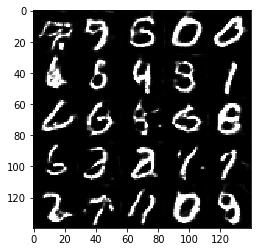

Epoch 2/2 Discriminator loss: 0.9457 Generator loss: 1.2134
Epoch 2/2 Discriminator loss: 0.8302 Generator loss: 1.4008
Epoch 2/2 Discriminator loss: 1.0019 Generator loss: 0.9275
Epoch 2/2 Discriminator loss: 0.8758 Generator loss: 1.2059
Epoch 2/2 Discriminator loss: 0.9195 Generator loss: 1.0716
Epoch 2/2 Discriminator loss: 0.8181 Generator loss: 1.2489
Epoch 2/2 Discriminator loss: 0.9608 Generator loss: 0.9331
Epoch 2/2 Discriminator loss: 0.7805 Generator loss: 1.7049
Epoch 2/2 Discriminator loss: 0.8061 Generator loss: 1.1770
Epoch 2/2 Discriminator loss: 0.8703 Generator loss: 1.0008
Epoch 2/2 Discriminator loss: 0.8338 Generator loss: 1.3365
Epoch 2/2 Discriminator loss: 0.8925 Generator loss: 1.1093
Epoch 2/2 Discriminator loss: 0.6722 Generator loss: 1.4740
Epoch 2/2 Discriminator loss: 0.8771 Generator loss: 1.1771
Epoch 2/2 Discriminator loss: 0.8998 Generator loss: 1.1594
Epoch 2/2 Discriminator loss: 0.6457 Generator loss: 1.7683
Epoch 2/2 Discriminator loss: 0.8554 Gen

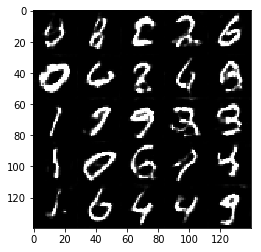

Epoch 2/2 Discriminator loss: 0.9500 Generator loss: 0.9064
Epoch 2/2 Discriminator loss: 0.8956 Generator loss: 1.3434
Epoch 2/2 Discriminator loss: 1.0821 Generator loss: 0.7467
Epoch 2/2 Discriminator loss: 0.7686 Generator loss: 2.2002
Epoch 2/2 Discriminator loss: 1.2378 Generator loss: 0.6412
Epoch 2/2 Discriminator loss: 0.8574 Generator loss: 2.0124
Epoch 2/2 Discriminator loss: 0.9453 Generator loss: 0.9136
Epoch 2/2 Discriminator loss: 0.8660 Generator loss: 1.5877
Epoch 2/2 Discriminator loss: 1.2867 Generator loss: 0.5584
Epoch 2/2 Discriminator loss: 0.6870 Generator loss: 2.1461
Epoch 2/2 Discriminator loss: 1.1215 Generator loss: 0.6973
Epoch 2/2 Discriminator loss: 0.8221 Generator loss: 1.2769
Epoch 2/2 Discriminator loss: 0.9797 Generator loss: 0.9455
Epoch 2/2 Discriminator loss: 0.7635 Generator loss: 2.0004
Epoch 2/2 Discriminator loss: 0.9019 Generator loss: 1.0793
Epoch 2/2 Discriminator loss: 0.8244 Generator loss: 1.4200
Epoch 2/2 Discriminator loss: 1.0396 Gen

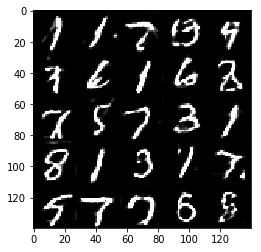

Epoch 2/2 Discriminator loss: 1.3160 Generator loss: 0.6572
Epoch 2/2 Discriminator loss: 1.6199 Generator loss: 3.0463
Epoch 2/2 Discriminator loss: 1.8189 Generator loss: 0.3569
Epoch 2/2 Discriminator loss: 1.0752 Generator loss: 1.7698
Epoch 2/2 Discriminator loss: 0.9828 Generator loss: 0.9156
Epoch 2/2 Discriminator loss: 0.9279 Generator loss: 0.9485
Epoch 2/2 Discriminator loss: 0.8901 Generator loss: 1.3347
Epoch 2/2 Discriminator loss: 0.9509 Generator loss: 0.9315
Epoch 2/2 Discriminator loss: 0.8182 Generator loss: 1.1528
Epoch 2/2 Discriminator loss: 0.7296 Generator loss: 1.6337
Epoch 2/2 Discriminator loss: 0.8696 Generator loss: 1.0476
Epoch 2/2 Discriminator loss: 0.7554 Generator loss: 1.3545
Epoch 2/2 Discriminator loss: 0.8761 Generator loss: 1.0316
Epoch 2/2 Discriminator loss: 0.6903 Generator loss: 1.5874
Epoch 2/2 Discriminator loss: 0.9085 Generator loss: 0.9593
Epoch 2/2 Discriminator loss: 0.8024 Generator loss: 2.4445
Epoch 2/2 Discriminator loss: 1.2294 Gen

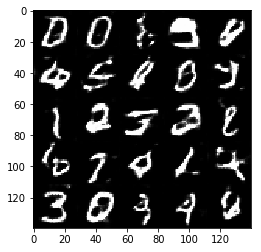

Epoch 2/2 Discriminator loss: 1.7372 Generator loss: 0.3883
Epoch 2/2 Discriminator loss: 1.3265 Generator loss: 1.7476
Epoch 2/2 Discriminator loss: 1.1838 Generator loss: 0.6594
Epoch 2/2 Discriminator loss: 0.9525 Generator loss: 1.9869
Epoch 2/2 Discriminator loss: 1.0921 Generator loss: 0.7701
Epoch 2/2 Discriminator loss: 0.8348 Generator loss: 1.3108
Epoch 2/2 Discriminator loss: 0.9616 Generator loss: 1.0977
Epoch 2/2 Discriminator loss: 0.8898 Generator loss: 1.0158
Epoch 2/2 Discriminator loss: 0.6513 Generator loss: 1.8120
Epoch 2/2 Discriminator loss: 0.7285 Generator loss: 1.4324
Epoch 2/2 Discriminator loss: 0.8865 Generator loss: 1.0214
Epoch 2/2 Discriminator loss: 0.7649 Generator loss: 1.6185
Epoch 2/2 Discriminator loss: 1.1554 Generator loss: 0.6857
Epoch 2/2 Discriminator loss: 0.7231 Generator loss: 1.5648
Epoch 2/2 Discriminator loss: 0.7331 Generator loss: 1.3657
Epoch 2/2 Discriminator loss: 0.9753 Generator loss: 0.8742
Epoch 2/2 Discriminator loss: 0.7468 Gen

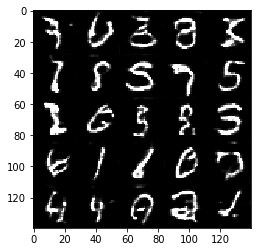

Epoch 2/2 Discriminator loss: 0.8374 Generator loss: 2.2750
Epoch 2/2 Discriminator loss: 1.0638 Generator loss: 0.8966
Epoch 2/2 Discriminator loss: 0.7952 Generator loss: 1.8339
Epoch 2/2 Discriminator loss: 1.9733 Generator loss: 0.2895
Epoch 2/2 Discriminator loss: 1.4182 Generator loss: 3.2111
Epoch 2/2 Discriminator loss: 1.0604 Generator loss: 0.9752
Epoch 2/2 Discriminator loss: 1.1495 Generator loss: 0.7033
Epoch 2/2 Discriminator loss: 1.5025 Generator loss: 2.7226
Epoch 2/2 Discriminator loss: 1.3246 Generator loss: 0.6962
Epoch 2/2 Discriminator loss: 1.2046 Generator loss: 2.0415
Epoch 2/2 Discriminator loss: 1.3362 Generator loss: 0.5921
Epoch 2/2 Discriminator loss: 1.0111 Generator loss: 2.0758
Epoch 2/2 Discriminator loss: 1.4477 Generator loss: 0.4786
Epoch 2/2 Discriminator loss: 1.0866 Generator loss: 2.0925
Epoch 2/2 Discriminator loss: 1.5274 Generator loss: 0.4637
Epoch 2/2 Discriminator loss: 0.8785 Generator loss: 2.1232
Epoch 2/2 Discriminator loss: 1.1577 Gen

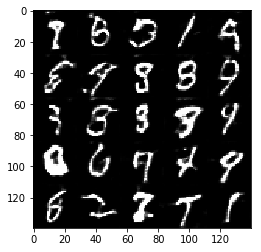

Epoch 2/2 Discriminator loss: 0.9905 Generator loss: 0.9148
Epoch 2/2 Discriminator loss: 0.8272 Generator loss: 1.4816
Epoch 2/2 Discriminator loss: 0.8652 Generator loss: 1.0528
Epoch 2/2 Discriminator loss: 0.7610 Generator loss: 1.3656
Epoch 2/2 Discriminator loss: 1.0086 Generator loss: 0.8723
Epoch 2/2 Discriminator loss: 0.7408 Generator loss: 1.6423
Epoch 2/2 Discriminator loss: 1.0526 Generator loss: 0.8361
Epoch 2/2 Discriminator loss: 0.6572 Generator loss: 1.8224
Epoch 2/2 Discriminator loss: 0.4838 Generator loss: 2.3465
Epoch 2/2 Discriminator loss: 0.5841 Generator loss: 1.7334
Epoch 2/2 Discriminator loss: 0.6420 Generator loss: 1.5550
Epoch 2/2 Discriminator loss: 0.6724 Generator loss: 1.4756
Epoch 2/2 Discriminator loss: 0.5887 Generator loss: 1.9407
Epoch 2/2 Discriminator loss: 0.7369 Generator loss: 1.2717
Epoch 2/2 Discriminator loss: 0.8139 Generator loss: 1.1445
Epoch 2/2 Discriminator loss: 0.7620 Generator loss: 1.3252
Epoch 2/2 Discriminator loss: 0.6208 Gen

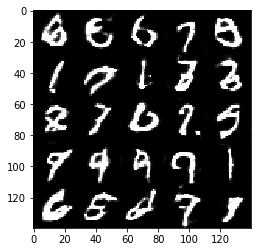

Epoch 2/2 Discriminator loss: 0.7390 Generator loss: 1.2563
Epoch 2/2 Discriminator loss: 0.7273 Generator loss: 1.3794
Epoch 2/2 Discriminator loss: 0.7245 Generator loss: 1.4125
Epoch 2/2 Discriminator loss: 0.9093 Generator loss: 0.9694
Epoch 2/2 Discriminator loss: 0.7590 Generator loss: 2.4133
Epoch 2/2 Discriminator loss: 0.6936 Generator loss: 1.4878
Epoch 2/2 Discriminator loss: 0.8885 Generator loss: 1.1177
Epoch 2/2 Discriminator loss: 0.9740 Generator loss: 0.9311
Epoch 2/2 Discriminator loss: 1.6306 Generator loss: 3.6626
Epoch 2/2 Discriminator loss: 1.3520 Generator loss: 0.6025
Epoch 2/2 Discriminator loss: 2.6705 Generator loss: 3.9419
Epoch 2/2 Discriminator loss: 3.7651 Generator loss: 0.0798
Epoch 2/2 Discriminator loss: 1.8938 Generator loss: 3.1334
Epoch 2/2 Discriminator loss: 1.4438 Generator loss: 0.5646
Epoch 2/2 Discriminator loss: 0.9381 Generator loss: 1.3566
Epoch 2/2 Discriminator loss: 0.9992 Generator loss: 1.1378
Epoch 2/2 Discriminator loss: 1.1868 Gen

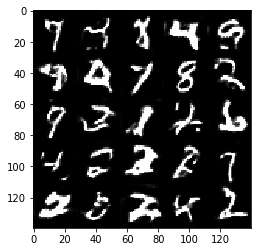

Epoch 2/2 Discriminator loss: 0.8153 Generator loss: 1.3642
Epoch 2/2 Discriminator loss: 0.9192 Generator loss: 1.0299
Epoch 2/2 Discriminator loss: 0.9253 Generator loss: 0.9619
Epoch 2/2 Discriminator loss: 0.8939 Generator loss: 1.1677
Epoch 2/2 Discriminator loss: 0.7740 Generator loss: 1.6660
Epoch 2/2 Discriminator loss: 1.0351 Generator loss: 0.7971
Epoch 2/2 Discriminator loss: 1.0114 Generator loss: 0.9215
Epoch 2/2 Discriminator loss: 0.8949 Generator loss: 2.1630
Epoch 2/2 Discriminator loss: 1.0944 Generator loss: 0.7236
Epoch 2/2 Discriminator loss: 0.8144 Generator loss: 1.5974
Epoch 2/2 Discriminator loss: 0.9572 Generator loss: 0.8812
Epoch 2/2 Discriminator loss: 0.8088 Generator loss: 1.6815
Epoch 2/2 Discriminator loss: 0.9807 Generator loss: 0.8648
Epoch 2/2 Discriminator loss: 0.7556 Generator loss: 1.3949
Epoch 2/2 Discriminator loss: 0.9062 Generator loss: 1.0981
Epoch 2/2 Discriminator loss: 1.0688 Generator loss: 0.7510
Epoch 2/2 Discriminator loss: 0.7921 Gen

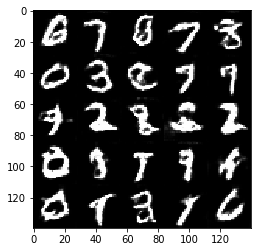

Epoch 2/2 Discriminator loss: 0.7738 Generator loss: 1.2452
Epoch 2/2 Discriminator loss: 0.9323 Generator loss: 0.9694
Epoch 2/2 Discriminator loss: 0.8646 Generator loss: 1.5278
Epoch 2/2 Discriminator loss: 1.4740 Generator loss: 0.4928
Epoch 2/2 Discriminator loss: 1.4014 Generator loss: 2.8809
Epoch 2/2 Discriminator loss: 1.4488 Generator loss: 0.5134
Epoch 2/2 Discriminator loss: 1.5113 Generator loss: 2.7787
Epoch 2/2 Discriminator loss: 2.7571 Generator loss: 0.1460
Epoch 2/2 Discriminator loss: 1.8959 Generator loss: 3.5758
Epoch 2/2 Discriminator loss: 1.3732 Generator loss: 0.6002
Epoch 2/2 Discriminator loss: 1.1367 Generator loss: 2.1437
Epoch 2/2 Discriminator loss: 1.6040 Generator loss: 0.4504
Epoch 2/2 Discriminator loss: 1.1319 Generator loss: 2.4625
Epoch 2/2 Discriminator loss: 0.9074 Generator loss: 1.0959
Epoch 2/2 Discriminator loss: 0.9676 Generator loss: 1.0626
Epoch 2/2 Discriminator loss: 0.8436 Generator loss: 1.2237
Epoch 2/2 Discriminator loss: 0.9377 Gen

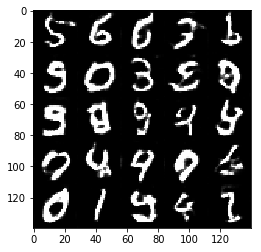

Epoch 2/2 Discriminator loss: 0.8484 Generator loss: 1.1228
Epoch 2/2 Discriminator loss: 0.7189 Generator loss: 1.7013
Epoch 2/2 Discriminator loss: 0.8294 Generator loss: 1.1036
Epoch 2/2 Discriminator loss: 0.8843 Generator loss: 1.1679
Epoch 2/2 Discriminator loss: 0.6835 Generator loss: 1.9573
Epoch 2/2 Discriminator loss: 0.8600 Generator loss: 1.0048
Epoch 2/2 Discriminator loss: 0.6823 Generator loss: 1.6188
Epoch 2/2 Discriminator loss: 1.0907 Generator loss: 0.7892
Epoch 2/2 Discriminator loss: 0.8814 Generator loss: 1.5547
Epoch 2/2 Discriminator loss: 0.7024 Generator loss: 1.7594
Epoch 2/2 Discriminator loss: 1.1637 Generator loss: 0.7215
Epoch 2/2 Discriminator loss: 1.0268 Generator loss: 1.9560
Epoch 2/2 Discriminator loss: 1.0143 Generator loss: 0.8616
Epoch 2/2 Discriminator loss: 0.8118 Generator loss: 1.5029
Epoch 2/2 Discriminator loss: 0.6516 Generator loss: 1.5717
Epoch 2/2 Discriminator loss: 0.7542 Generator loss: 1.4167
Epoch 2/2 Discriminator loss: 0.7133 Gen

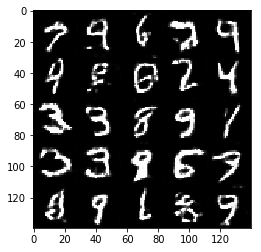

Epoch 2/2 Discriminator loss: 0.6524 Generator loss: 1.6650
Epoch 2/2 Discriminator loss: 0.5494 Generator loss: 2.1235
Epoch 2/2 Discriminator loss: 1.1748 Generator loss: 0.6736
Epoch 2/2 Discriminator loss: 0.6044 Generator loss: 2.0731
Epoch 2/2 Discriminator loss: 0.7429 Generator loss: 1.2608
Epoch 2/2 Discriminator loss: 0.7861 Generator loss: 1.3257
Epoch 2/2 Discriminator loss: 0.6618 Generator loss: 1.5441
Epoch 2/2 Discriminator loss: 0.6656 Generator loss: 1.6737
Epoch 2/2 Discriminator loss: 0.7860 Generator loss: 1.1750
Epoch 2/2 Discriminator loss: 0.7844 Generator loss: 1.1992
Epoch 2/2 Discriminator loss: 0.7697 Generator loss: 1.2989
Epoch 2/2 Discriminator loss: 0.7210 Generator loss: 2.0546
Epoch 2/2 Discriminator loss: 1.1738 Generator loss: 0.7017
Epoch 2/2 Discriminator loss: 0.8866 Generator loss: 1.6962
Epoch 2/2 Discriminator loss: 1.0922 Generator loss: 0.8643
Epoch 2/2 Discriminator loss: 0.7482 Generator loss: 1.6166
Epoch 2/2 Discriminator loss: 0.6988 Gen

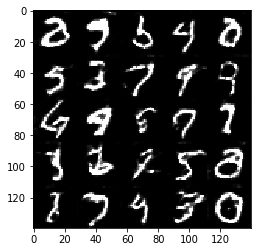

Epoch 2/2 Discriminator loss: 0.7056 Generator loss: 1.3964
Epoch 2/2 Discriminator loss: 0.8120 Generator loss: 1.1781
Epoch 2/2 Discriminator loss: 0.5354 Generator loss: 2.8608
Epoch 2/2 Discriminator loss: 0.7073 Generator loss: 1.3807
Epoch 2/2 Discriminator loss: 0.7248 Generator loss: 1.4353
Epoch 2/2 Discriminator loss: 0.7358 Generator loss: 1.3723
Epoch 2/2 Discriminator loss: 0.9572 Generator loss: 0.8816
Epoch 2/2 Discriminator loss: 0.6960 Generator loss: 2.0414
Epoch 2/2 Discriminator loss: 0.9167 Generator loss: 0.9391
Epoch 2/2 Discriminator loss: 0.7120 Generator loss: 1.5842
Epoch 2/2 Discriminator loss: 0.9296 Generator loss: 0.9445
Epoch 2/2 Discriminator loss: 1.1237 Generator loss: 3.4121
Epoch 2/2 Discriminator loss: 1.0688 Generator loss: 0.8795
Epoch 2/2 Discriminator loss: 1.6035 Generator loss: 2.6470
Epoch 2/2 Discriminator loss: 3.2016 Generator loss: 0.0973
Epoch 2/2 Discriminator loss: 2.8656 Generator loss: 4.7626
Epoch 2/2 Discriminator loss: 1.6009 Gen

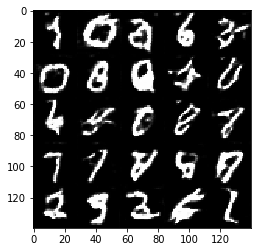

Epoch 2/2 Discriminator loss: 0.8331 Generator loss: 1.1439
Epoch 2/2 Discriminator loss: 0.8510 Generator loss: 1.3142
Epoch 2/2 Discriminator loss: 0.9610 Generator loss: 0.9035
Epoch 2/2 Discriminator loss: 0.8739 Generator loss: 1.2081
Epoch 2/2 Discriminator loss: 0.8105 Generator loss: 1.7192
Epoch 2/2 Discriminator loss: 1.3941 Generator loss: 0.5382
Epoch 2/2 Discriminator loss: 0.8903 Generator loss: 2.0508
Epoch 2/2 Discriminator loss: 1.0254 Generator loss: 0.8205
Epoch 2/2 Discriminator loss: 0.8636 Generator loss: 1.8716
Epoch 2/2 Discriminator loss: 1.2416 Generator loss: 0.6846
Epoch 2/2 Discriminator loss: 0.9455 Generator loss: 1.9619
Epoch 2/2 Discriminator loss: 1.5231 Generator loss: 0.4351
Epoch 2/2 Discriminator loss: 0.7204 Generator loss: 2.3807
Epoch 2/2 Discriminator loss: 1.0133 Generator loss: 0.8479
Epoch 2/2 Discriminator loss: 0.8977 Generator loss: 1.3951
Epoch 2/2 Discriminator loss: 0.8410 Generator loss: 1.0487
Epoch 2/2 Discriminator loss: 0.6918 Gen

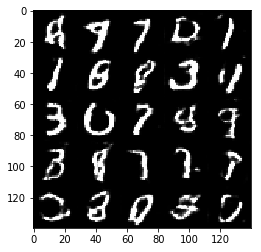

Epoch 2/2 Discriminator loss: 0.7075 Generator loss: 1.5470
Epoch 2/2 Discriminator loss: 0.8864 Generator loss: 0.9889
Epoch 2/2 Discriminator loss: 0.7530 Generator loss: 1.3588
Epoch 2/2 Discriminator loss: 0.8800 Generator loss: 1.0521
Epoch 2/2 Discriminator loss: 0.6821 Generator loss: 1.7700
Epoch 2/2 Discriminator loss: 0.8002 Generator loss: 1.2258
Epoch 2/2 Discriminator loss: 0.8220 Generator loss: 1.2121
Epoch 2/2 Discriminator loss: 0.7089 Generator loss: 1.3965
Epoch 2/2 Discriminator loss: 0.7077 Generator loss: 1.3977
Epoch 2/2 Discriminator loss: 0.6196 Generator loss: 1.7043
Epoch 2/2 Discriminator loss: 0.6418 Generator loss: 1.7310
Epoch 2/2 Discriminator loss: 0.7161 Generator loss: 1.3440
Epoch 2/2 Discriminator loss: 0.7556 Generator loss: 1.2807
Epoch 2/2 Discriminator loss: 0.6745 Generator loss: 1.6190
Epoch 2/2 Discriminator loss: 0.8769 Generator loss: 1.0239
Epoch 2/2 Discriminator loss: 0.7832 Generator loss: 1.6535
Epoch 2/2 Discriminator loss: 0.8787 Gen

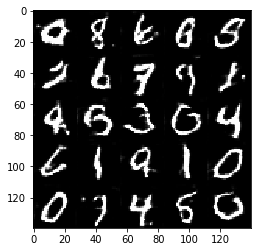

Epoch 2/2 Discriminator loss: 0.9030 Generator loss: 0.9941
Epoch 2/2 Discriminator loss: 0.7711 Generator loss: 3.1673
Epoch 2/2 Discriminator loss: 1.2264 Generator loss: 0.6581
Epoch 2/2 Discriminator loss: 0.6039 Generator loss: 2.2023
Epoch 2/2 Discriminator loss: 1.3913 Generator loss: 0.5245
Epoch 2/2 Discriminator loss: 0.9475 Generator loss: 2.6454
Epoch 2/2 Discriminator loss: 1.2608 Generator loss: 0.6511
Epoch 2/2 Discriminator loss: 1.2597 Generator loss: 2.4338
Epoch 2/2 Discriminator loss: 2.1889 Generator loss: 0.2779
Epoch 2/2 Discriminator loss: 3.7879 Generator loss: 5.4074
Epoch 2/2 Discriminator loss: 1.7708 Generator loss: 0.3674
Epoch 2/2 Discriminator loss: 1.0853 Generator loss: 2.1722
Epoch 2/2 Discriminator loss: 1.2574 Generator loss: 0.6446
Epoch 2/2 Discriminator loss: 0.9537 Generator loss: 1.5443
Epoch 2/2 Discriminator loss: 1.1112 Generator loss: 0.7540
Epoch 2/2 Discriminator loss: 1.0353 Generator loss: 1.6495
Epoch 2/2 Discriminator loss: 0.9581 Gen

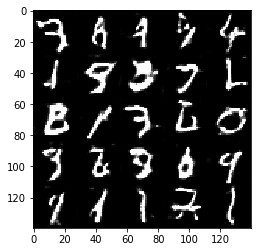

Epoch 2/2 Discriminator loss: 0.7875 Generator loss: 1.2261
Epoch 2/2 Discriminator loss: 1.1462 Generator loss: 0.7201
Epoch 2/2 Discriminator loss: 0.8194 Generator loss: 2.2309
Epoch 2/2 Discriminator loss: 0.6577 Generator loss: 1.4205
Epoch 2/2 Discriminator loss: 0.8021 Generator loss: 1.1824
Epoch 2/2 Discriminator loss: 0.6783 Generator loss: 1.6612
Epoch 2/2 Discriminator loss: 0.7558 Generator loss: 1.2030
Epoch 2/2 Discriminator loss: 0.9465 Generator loss: 0.9663
Epoch 2/2 Discriminator loss: 0.7692 Generator loss: 1.3469
Epoch 2/2 Discriminator loss: 0.7277 Generator loss: 1.3195
Epoch 2/2 Discriminator loss: 0.7324 Generator loss: 1.2921
Epoch 2/2 Discriminator loss: 0.7001 Generator loss: 1.4649
Epoch 2/2 Discriminator loss: 0.7050 Generator loss: 1.3938
Epoch 2/2 Discriminator loss: 0.5918 Generator loss: 1.9802
Epoch 2/2 Discriminator loss: 1.1275 Generator loss: 0.7140
Epoch 2/2 Discriminator loss: 0.7788 Generator loss: 1.8995
Epoch 2/2 Discriminator loss: 0.9867 Gen

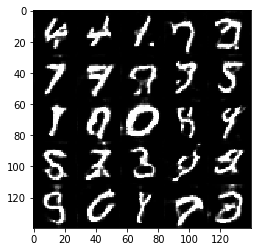

Epoch 2/2 Discriminator loss: 0.6842 Generator loss: 1.6436
Epoch 2/2 Discriminator loss: 0.5909 Generator loss: 1.6537
Epoch 2/2 Discriminator loss: 0.5688 Generator loss: 1.9375
Epoch 2/2 Discriminator loss: 0.5618 Generator loss: 1.9963
Epoch 2/2 Discriminator loss: 0.6026 Generator loss: 1.7359
Epoch 2/2 Discriminator loss: 0.5995 Generator loss: 2.0002
Epoch 2/2 Discriminator loss: 1.3518 Generator loss: 0.5744
Epoch 2/2 Discriminator loss: 0.9272 Generator loss: 2.5764
Epoch 2/2 Discriminator loss: 2.0325 Generator loss: 0.3277
Epoch 2/2 Discriminator loss: 2.8137 Generator loss: 3.9621
Epoch 2/2 Discriminator loss: 1.7964 Generator loss: 0.3821
Epoch 2/2 Discriminator loss: 1.0269 Generator loss: 1.7405
Epoch 2/2 Discriminator loss: 1.2071 Generator loss: 0.6868
Epoch 2/2 Discriminator loss: 0.9561 Generator loss: 1.2139
Epoch 2/2 Discriminator loss: 1.1158 Generator loss: 0.7416
Epoch 2/2 Discriminator loss: 0.8056 Generator loss: 1.8217
Epoch 2/2 Discriminator loss: 1.0513 Gen

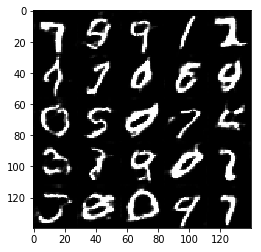

Epoch 2/2 Discriminator loss: 0.8411 Generator loss: 1.1112
Epoch 2/2 Discriminator loss: 0.7934 Generator loss: 1.3464
Epoch 2/2 Discriminator loss: 1.0578 Generator loss: 0.8151
Epoch 2/2 Discriminator loss: 0.6833 Generator loss: 1.6825
Epoch 2/2 Discriminator loss: 0.7366 Generator loss: 1.3580
Epoch 2/2 Discriminator loss: 0.6854 Generator loss: 1.3905
Epoch 2/2 Discriminator loss: 0.6936 Generator loss: 1.4871
Epoch 2/2 Discriminator loss: 0.7416 Generator loss: 1.3333
Epoch 2/2 Discriminator loss: 0.6718 Generator loss: 1.7647
Epoch 2/2 Discriminator loss: 1.1883 Generator loss: 0.6684
Epoch 2/2 Discriminator loss: 0.8180 Generator loss: 1.9596
Epoch 2/2 Discriminator loss: 0.8014 Generator loss: 1.2350
Epoch 2/2 Discriminator loss: 0.6881 Generator loss: 1.7842
Epoch 2/2 Discriminator loss: 0.7493 Generator loss: 1.4031
Epoch 2/2 Discriminator loss: 0.6971 Generator loss: 1.5162
Epoch 2/2 Discriminator loss: 0.7875 Generator loss: 1.3784
Epoch 2/2 Discriminator loss: 0.7644 Gen

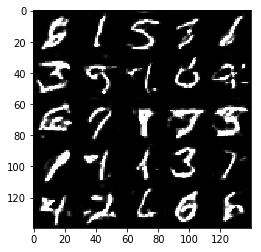

Epoch 2/2 Discriminator loss: 0.5239 Generator loss: 2.4041
Epoch 2/2 Discriminator loss: 1.0357 Generator loss: 0.8570
Epoch 2/2 Discriminator loss: 0.5608 Generator loss: 2.2942
Epoch 2/2 Discriminator loss: 0.4313 Generator loss: 2.6946
Epoch 2/2 Discriminator loss: 0.6260 Generator loss: 1.6249
Epoch 2/2 Discriminator loss: 0.6389 Generator loss: 1.5309
Epoch 2/2 Discriminator loss: 0.7190 Generator loss: 1.3628
Epoch 2/2 Discriminator loss: 0.9728 Generator loss: 0.8818
Epoch 2/2 Discriminator loss: 0.6960 Generator loss: 2.4385
Epoch 2/2 Discriminator loss: 1.5281 Generator loss: 0.4696
Epoch 2/2 Discriminator loss: 0.8605 Generator loss: 1.5752
Epoch 2/2 Discriminator loss: 1.1996 Generator loss: 0.6691
Epoch 2/2 Discriminator loss: 0.8073 Generator loss: 2.2382
Epoch 2/2 Discriminator loss: 0.6856 Generator loss: 1.4865
Epoch 2/2 Discriminator loss: 1.0210 Generator loss: 0.8757
Epoch 2/2 Discriminator loss: 0.6714 Generator loss: 1.8034
Epoch 2/2 Discriminator loss: 0.6227 Gen

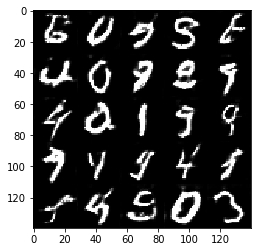

Epoch 2/2 Discriminator loss: 0.6947 Generator loss: 1.7731
Epoch 2/2 Discriminator loss: 1.1741 Generator loss: 0.6943
Epoch 2/2 Discriminator loss: 0.7178 Generator loss: 2.0168
Epoch 2/2 Discriminator loss: 0.9330 Generator loss: 1.0597
Epoch 2/2 Discriminator loss: 0.8263 Generator loss: 1.8529
Epoch 2/2 Discriminator loss: 1.0211 Generator loss: 0.9430
Epoch 2/2 Discriminator loss: 0.8486 Generator loss: 2.3496
Epoch 2/2 Discriminator loss: 1.2845 Generator loss: 0.7332
Epoch 2/2 Discriminator loss: 0.7729 Generator loss: 2.0390
Epoch 2/2 Discriminator loss: 0.8934 Generator loss: 1.0768
Epoch 2/2 Discriminator loss: 0.8046 Generator loss: 1.9950
Epoch 2/2 Discriminator loss: 1.1674 Generator loss: 0.7704
Epoch 2/2 Discriminator loss: 0.7274 Generator loss: 2.1398
Epoch 2/2 Discriminator loss: 0.9603 Generator loss: 1.0109
Epoch 2/2 Discriminator loss: 0.7369 Generator loss: 1.8096
Epoch 2/2 Discriminator loss: 0.7357 Generator loss: 1.3163
Epoch 2/2 Discriminator loss: 0.7148 Gen

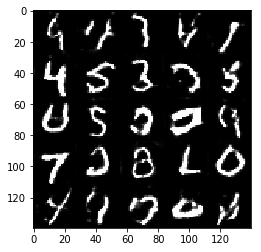

Epoch 2/2 Discriminator loss: 0.6973 Generator loss: 1.7918
Epoch 2/2 Discriminator loss: 0.8099 Generator loss: 1.1425
Epoch 2/2 Discriminator loss: 0.5614 Generator loss: 1.9460
Epoch 2/2 Discriminator loss: 0.5184 Generator loss: 2.0670
Epoch 2/2 Discriminator loss: 0.5456 Generator loss: 1.9803
Epoch 2/2 Discriminator loss: 0.5707 Generator loss: 1.8608
Epoch 2/2 Discriminator loss: 0.6901 Generator loss: 1.4269
Epoch 2/2 Discriminator loss: 0.7524 Generator loss: 1.2469
Epoch 2/2 Discriminator loss: 0.5403 Generator loss: 2.1495
Epoch 2/2 Discriminator loss: 0.5904 Generator loss: 2.2609
Epoch 2/2 Discriminator loss: 1.1289 Generator loss: 0.7907
Epoch 2/2 Discriminator loss: 0.7019 Generator loss: 1.6560
Epoch 2/2 Discriminator loss: 0.6328 Generator loss: 1.9255
Epoch 2/2 Discriminator loss: 0.7432 Generator loss: 1.2836
Epoch 2/2 Discriminator loss: 0.7329 Generator loss: 1.3063
Epoch 2/2 Discriminator loss: 0.4926 Generator loss: 2.8179
Epoch 2/2 Discriminator loss: 0.8196 Gen

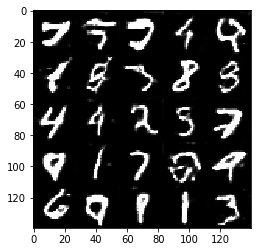

Epoch 2/2 Discriminator loss: 1.0406 Generator loss: 0.8330
Epoch 2/2 Discriminator loss: 1.2759 Generator loss: 2.6204
Epoch 2/2 Discriminator loss: 2.8474 Generator loss: 0.1701
Epoch 2/2 Discriminator loss: 2.5979 Generator loss: 4.7008
Epoch 2/2 Discriminator loss: 1.3645 Generator loss: 0.7621
Epoch 2/2 Discriminator loss: 1.7163 Generator loss: 2.5098
Epoch 2/2 Discriminator loss: 3.2611 Generator loss: 0.1204
Epoch 2/2 Discriminator loss: 1.6763 Generator loss: 3.0260
Epoch 2/2 Discriminator loss: 1.1486 Generator loss: 0.8829
Epoch 2/2 Discriminator loss: 0.9986 Generator loss: 1.2727
Epoch 2/2 Discriminator loss: 1.0551 Generator loss: 0.9845
Epoch 2/2 Discriminator loss: 0.9121 Generator loss: 1.2373
Epoch 2/2 Discriminator loss: 0.9652 Generator loss: 0.9406
Epoch 2/2 Discriminator loss: 0.9064 Generator loss: 1.0794
Epoch 2/2 Discriminator loss: 0.8907 Generator loss: 1.1302
Epoch 2/2 Discriminator loss: 0.8851 Generator loss: 1.1304
Epoch 2/2 Discriminator loss: 0.8386 Gen

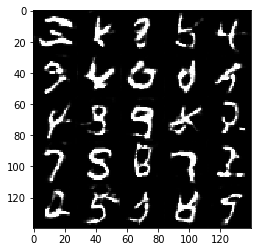

Epoch 2/2 Discriminator loss: 0.7235 Generator loss: 1.3478
Epoch 2/2 Discriminator loss: 0.6892 Generator loss: 1.4931
Epoch 2/2 Discriminator loss: 0.7083 Generator loss: 1.3112
Epoch 2/2 Discriminator loss: 0.6350 Generator loss: 1.7043
Epoch 2/2 Discriminator loss: 0.7950 Generator loss: 1.1702
Epoch 2/2 Discriminator loss: 0.7761 Generator loss: 1.3189
Epoch 2/2 Discriminator loss: 0.6884 Generator loss: 1.4668
Epoch 2/2 Discriminator loss: 0.9840 Generator loss: 0.8690
Epoch 2/2 Discriminator loss: 0.7681 Generator loss: 1.6058
Epoch 2/2 Discriminator loss: 1.0206 Generator loss: 0.8680
Epoch 2/2 Discriminator loss: 0.8414 Generator loss: 2.0214
Epoch 2/2 Discriminator loss: 0.9572 Generator loss: 0.9782
Epoch 2/2 Discriminator loss: 0.7378 Generator loss: 1.7116
Epoch 2/2 Discriminator loss: 0.8802 Generator loss: 1.0005
Epoch 2/2 Discriminator loss: 0.7116 Generator loss: 2.4461
Epoch 2/2 Discriminator loss: 0.9362 Generator loss: 0.9609
Epoch 2/2 Discriminator loss: 0.6890 Gen

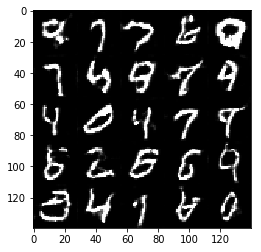

Epoch 2/2 Discriminator loss: 1.0141 Generator loss: 2.5786
Epoch 2/2 Discriminator loss: 1.0413 Generator loss: 0.8853
Epoch 2/2 Discriminator loss: 0.8889 Generator loss: 2.0476
Epoch 2/2 Discriminator loss: 1.3559 Generator loss: 0.5960
Epoch 2/2 Discriminator loss: 0.8915 Generator loss: 1.9025
Epoch 2/2 Discriminator loss: 1.7355 Generator loss: 0.4055
Epoch 2/2 Discriminator loss: 1.1018 Generator loss: 2.9318
Epoch 2/2 Discriminator loss: 1.0555 Generator loss: 0.8362
Epoch 2/2 Discriminator loss: 0.7961 Generator loss: 1.9222
Epoch 2/2 Discriminator loss: 0.5810 Generator loss: 1.7954
Epoch 2/2 Discriminator loss: 0.8275 Generator loss: 1.1892
Epoch 2/2 Discriminator loss: 0.6450 Generator loss: 1.6403
Epoch 2/2 Discriminator loss: 0.6151 Generator loss: 1.7588
Epoch 2/2 Discriminator loss: 0.7941 Generator loss: 1.1762
Epoch 2/2 Discriminator loss: 0.7194 Generator loss: 1.5112
Epoch 2/2 Discriminator loss: 0.8656 Generator loss: 1.0485
Epoch 2/2 Discriminator loss: 0.6029 Gen

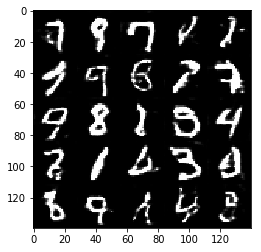

Epoch 2/2 Discriminator loss: 0.6264 Generator loss: 1.6302
Epoch 2/2 Discriminator loss: 0.4870 Generator loss: 2.2450
Epoch 2/2 Discriminator loss: 0.5639 Generator loss: 2.0200
Epoch 2/2 Discriminator loss: 0.5890 Generator loss: 1.6820
Epoch 2/2 Discriminator loss: 0.6178 Generator loss: 1.6516
Epoch 2/2 Discriminator loss: 0.6048 Generator loss: 1.7216
Epoch 2/2 Discriminator loss: 0.6553 Generator loss: 2.4472
Epoch 2/2 Discriminator loss: 1.1884 Generator loss: 0.6974
Epoch 2/2 Discriminator loss: 0.8345 Generator loss: 1.7972
Epoch 2/2 Discriminator loss: 0.8701 Generator loss: 1.1745
Epoch 2/2 Discriminator loss: 0.7474 Generator loss: 2.6970
Epoch 2/2 Discriminator loss: 1.2771 Generator loss: 0.7026
Epoch 2/2 Discriminator loss: 2.5715 Generator loss: 5.3661
Epoch 2/2 Discriminator loss: 1.7836 Generator loss: 0.3865
Epoch 2/2 Discriminator loss: 1.6696 Generator loss: 2.8926
Epoch 2/2 Discriminator loss: 1.6538 Generator loss: 0.4419
Epoch 2/2 Discriminator loss: 0.9877 Gen

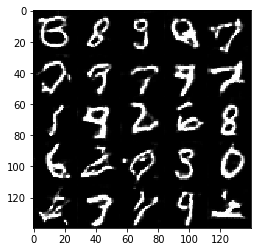

Epoch 2/2 Discriminator loss: 1.7224 Generator loss: 0.3589
Epoch 2/2 Discriminator loss: 1.0229 Generator loss: 2.8505
Epoch 2/2 Discriminator loss: 1.5012 Generator loss: 0.4939
Epoch 2/2 Discriminator loss: 1.0947 Generator loss: 2.3723
Epoch 2/2 Discriminator loss: 1.0966 Generator loss: 0.8234
Epoch 2/2 Discriminator loss: 0.7415 Generator loss: 1.7184
Epoch 2/2 Discriminator loss: 0.9168 Generator loss: 1.0108
Epoch 2/2 Discriminator loss: 0.8787 Generator loss: 1.0807
Epoch 2/2 Discriminator loss: 0.7255 Generator loss: 1.4609
Epoch 2/2 Discriminator loss: 0.8649 Generator loss: 1.0190
Epoch 2/2 Discriminator loss: 0.7043 Generator loss: 1.4220
Epoch 2/2 Discriminator loss: 0.8481 Generator loss: 1.2955
Epoch 2/2 Discriminator loss: 0.7821 Generator loss: 1.2616
Epoch 2/2 Discriminator loss: 0.9727 Generator loss: 0.8410
Epoch 2/2 Discriminator loss: 0.7237 Generator loss: 2.2301
Epoch 2/2 Discriminator loss: 1.1283 Generator loss: 0.7293
Epoch 2/2 Discriminator loss: 0.7383 Gen

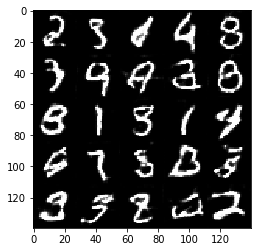

Epoch 2/2 Discriminator loss: 1.7442 Generator loss: 0.3795
Epoch 2/2 Discriminator loss: 0.9884 Generator loss: 2.1794
Epoch 2/2 Discriminator loss: 1.3878 Generator loss: 0.5658
Epoch 2/2 Discriminator loss: 1.3463 Generator loss: 2.4297
Epoch 2/2 Discriminator loss: 1.1343 Generator loss: 0.7805
Epoch 2/2 Discriminator loss: 0.5888 Generator loss: 2.1144
Epoch 2/2 Discriminator loss: 0.6444 Generator loss: 1.7557
Epoch 2/2 Discriminator loss: 0.7041 Generator loss: 1.3431
Epoch 2/2 Discriminator loss: 0.6920 Generator loss: 1.4723
Epoch 2/2 Discriminator loss: 0.6627 Generator loss: 1.6573
Epoch 2/2 Discriminator loss: 0.9677 Generator loss: 0.9017
Epoch 2/2 Discriminator loss: 0.7509 Generator loss: 1.6795
Epoch 2/2 Discriminator loss: 0.5477 Generator loss: 2.0778
Epoch 2/2 Discriminator loss: 0.9164 Generator loss: 1.0678
Epoch 2/2 Discriminator loss: 0.6381 Generator loss: 2.4063
Epoch 2/2 Discriminator loss: 1.0798 Generator loss: 0.8490
Epoch 2/2 Discriminator loss: 0.6721 Gen

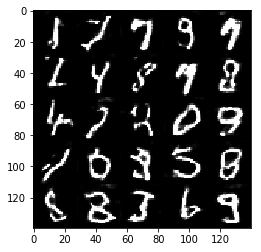

Epoch 2/2 Discriminator loss: 1.0677 Generator loss: 0.8087
Epoch 2/2 Discriminator loss: 0.7358 Generator loss: 1.6116
Epoch 2/2 Discriminator loss: 0.9499 Generator loss: 0.9292
Epoch 2/2 Discriminator loss: 0.8227 Generator loss: 1.4383
Epoch 2/2 Discriminator loss: 0.8247 Generator loss: 1.1040
Epoch 2/2 Discriminator loss: 0.7251 Generator loss: 2.0847
Epoch 2/2 Discriminator loss: 1.0218 Generator loss: 0.8320
Epoch 2/2 Discriminator loss: 0.7051 Generator loss: 1.6200
Epoch 2/2 Discriminator loss: 0.5222 Generator loss: 2.1701
Epoch 2/2 Discriminator loss: 0.6210 Generator loss: 1.6489
Epoch 2/2 Discriminator loss: 0.8267 Generator loss: 1.1336
Epoch 2/2 Discriminator loss: 0.6805 Generator loss: 1.9359
Epoch 2/2 Discriminator loss: 1.0404 Generator loss: 0.8862
Epoch 2/2 Discriminator loss: 0.7780 Generator loss: 2.3743
Epoch 2/2 Discriminator loss: 0.6565 Generator loss: 1.5906
Epoch 2/2 Discriminator loss: 0.6756 Generator loss: 1.4997
Epoch 2/2 Discriminator loss: 0.5780 Gen

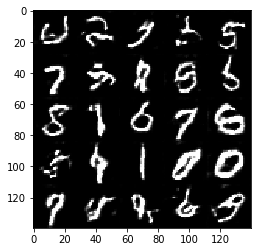

Epoch 2/2 Discriminator loss: 0.7034 Generator loss: 1.8479
Epoch 2/2 Discriminator loss: 0.6707 Generator loss: 1.5460
Epoch 2/2 Discriminator loss: 0.7014 Generator loss: 1.4062
Epoch 2/2 Discriminator loss: 0.7449 Generator loss: 1.3130
Epoch 2/2 Discriminator loss: 0.7124 Generator loss: 1.3643
Epoch 2/2 Discriminator loss: 0.5315 Generator loss: 2.1366
Epoch 2/2 Discriminator loss: 0.6253 Generator loss: 1.6302
Epoch 2/2 Discriminator loss: 0.5960 Generator loss: 1.7775
Epoch 2/2 Discriminator loss: 0.6416 Generator loss: 1.5935
Epoch 2/2 Discriminator loss: 0.6101 Generator loss: 1.7024
Epoch 2/2 Discriminator loss: 0.4589 Generator loss: 3.1517
Epoch 2/2 Discriminator loss: 0.5902 Generator loss: 1.7161
Epoch 2/2 Discriminator loss: 0.5975 Generator loss: 1.7837
Epoch 2/2 Discriminator loss: 0.5601 Generator loss: 1.9948
Epoch 2/2 Discriminator loss: 0.7069 Generator loss: 1.4691
Epoch 2/2 Discriminator loss: 0.6214 Generator loss: 1.9114
Epoch 2/2 Discriminator loss: 1.4939 Gen

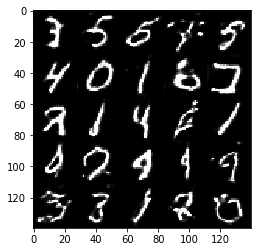

Epoch 2/2 Discriminator loss: 2.7509 Generator loss: 0.1498
Epoch 2/2 Discriminator loss: 2.5184 Generator loss: 4.2482
Epoch 2/2 Discriminator loss: 1.5283 Generator loss: 0.5830
Epoch 2/2 Discriminator loss: 0.8674 Generator loss: 1.7654
Epoch 2/2 Discriminator loss: 0.8224 Generator loss: 1.6128
Epoch 2/2 Discriminator loss: 1.0313 Generator loss: 0.8750
Epoch 2/2 Discriminator loss: 0.8742 Generator loss: 1.9996
Epoch 2/2 Discriminator loss: 1.3144 Generator loss: 0.5797
Epoch 2/2 Discriminator loss: 0.8473 Generator loss: 1.6330
Epoch 2/2 Discriminator loss: 1.2908 Generator loss: 0.6470
Epoch 2/2 Discriminator loss: 0.9299 Generator loss: 1.8416
Epoch 2/2 Discriminator loss: 1.2656 Generator loss: 0.6315
Epoch 2/2 Discriminator loss: 1.0081 Generator loss: 2.0936
Epoch 2/2 Discriminator loss: 1.2511 Generator loss: 0.6667
Epoch 2/2 Discriminator loss: 0.9100 Generator loss: 1.6591
Epoch 2/2 Discriminator loss: 0.9236 Generator loss: 1.0548
Epoch 2/2 Discriminator loss: 0.8843 Gen

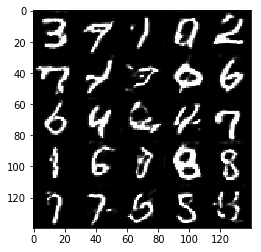

Epoch 2/2 Discriminator loss: 0.7346 Generator loss: 1.5106
Epoch 2/2 Discriminator loss: 0.9704 Generator loss: 0.9095
Epoch 2/2 Discriminator loss: 0.9913 Generator loss: 2.2243
Epoch 2/2 Discriminator loss: 1.2862 Generator loss: 0.6824
Epoch 2/2 Discriminator loss: 1.1670 Generator loss: 1.8443
Epoch 2/2 Discriminator loss: 2.6058 Generator loss: 0.1623
Epoch 2/2 Discriminator loss: 2.6815 Generator loss: 4.6098
Epoch 2/2 Discriminator loss: 1.2200 Generator loss: 0.8624
Epoch 2/2 Discriminator loss: 0.9537 Generator loss: 1.3844
Epoch 2/2 Discriminator loss: 0.9635 Generator loss: 1.4141
Epoch 2/2 Discriminator loss: 1.1616 Generator loss: 0.6891
Epoch 2/2 Discriminator loss: 0.9187 Generator loss: 1.3032
Epoch 2/2 Discriminator loss: 0.8358 Generator loss: 1.1235
Epoch 2/2 Discriminator loss: 0.8824 Generator loss: 1.1962
Epoch 2/2 Discriminator loss: 0.8498 Generator loss: 1.2068
Epoch 2/2 Discriminator loss: 0.8628 Generator loss: 1.0674
Epoch 2/2 Discriminator loss: 0.7657 Gen

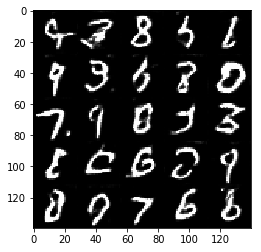

Epoch 2/2 Discriminator loss: 1.0155 Generator loss: 0.8456
Epoch 2/2 Discriminator loss: 0.7841 Generator loss: 1.5241
Epoch 2/2 Discriminator loss: 0.8007 Generator loss: 1.1696
Epoch 2/2 Discriminator loss: 0.7048 Generator loss: 1.6917
Epoch 2/2 Discriminator loss: 0.8548 Generator loss: 1.0981
Epoch 2/2 Discriminator loss: 0.7648 Generator loss: 1.6629
Epoch 2/2 Discriminator loss: 0.9032 Generator loss: 1.0687
Epoch 2/2 Discriminator loss: 0.8344 Generator loss: 1.2169
Epoch 2/2 Discriminator loss: 0.6244 Generator loss: 1.9651
Epoch 2/2 Discriminator loss: 0.5021 Generator loss: 2.3079
Epoch 2/2 Discriminator loss: 0.5622 Generator loss: 1.8217
Epoch 2/2 Discriminator loss: 0.5588 Generator loss: 1.8162
Epoch 2/2 Discriminator loss: 0.5790 Generator loss: 1.8442
Epoch 2/2 Discriminator loss: 0.7324 Generator loss: 1.2934
Epoch 2/2 Discriminator loss: 0.6408 Generator loss: 1.8143
Epoch 2/2 Discriminator loss: 0.7956 Generator loss: 1.1604
Epoch 2/2 Discriminator loss: 0.7433 Gen

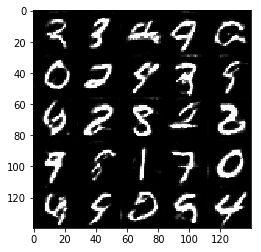

Epoch 2/2 Discriminator loss: 0.6723 Generator loss: 1.6535
Epoch 2/2 Discriminator loss: 0.7315 Generator loss: 1.3380
Epoch 2/2 Discriminator loss: 0.7639 Generator loss: 1.2962
Epoch 2/2 Discriminator loss: 0.8261 Generator loss: 1.1864
Epoch 2/2 Discriminator loss: 0.7712 Generator loss: 1.4400
Epoch 2/2 Discriminator loss: 0.5790 Generator loss: 1.8522
Epoch 2/2 Discriminator loss: 0.5514 Generator loss: 1.9754
Epoch 2/2 Discriminator loss: 0.5750 Generator loss: 1.7490
Epoch 2/2 Discriminator loss: 0.5511 Generator loss: 2.0502
Epoch 2/2 Discriminator loss: 0.5674 Generator loss: 1.9101
Epoch 2/2 Discriminator loss: 1.1439 Generator loss: 0.7774
Epoch 2/2 Discriminator loss: 0.7620 Generator loss: 2.6541
Epoch 2/2 Discriminator loss: 0.7886 Generator loss: 1.2352
Epoch 2/2 Discriminator loss: 1.0481 Generator loss: 0.7999
Epoch 2/2 Discriminator loss: 1.1146 Generator loss: 3.0506
Epoch 2/2 Discriminator loss: 1.6626 Generator loss: 0.4344
Epoch 2/2 Discriminator loss: 2.6080 Gen

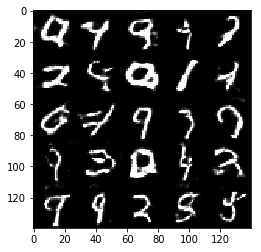

Epoch 2/2 Discriminator loss: 0.8417 Generator loss: 1.3699
Epoch 2/2 Discriminator loss: 0.8168 Generator loss: 1.4139
Epoch 2/2 Discriminator loss: 0.9410 Generator loss: 1.0621
Epoch 2/2 Discriminator loss: 0.7819 Generator loss: 1.5129
Epoch 2/2 Discriminator loss: 0.8875 Generator loss: 1.0457
Epoch 2/2 Discriminator loss: 0.8580 Generator loss: 1.3436
Epoch 2/2 Discriminator loss: 0.7809 Generator loss: 1.2373
Epoch 2/2 Discriminator loss: 0.7930 Generator loss: 1.3690
Epoch 2/2 Discriminator loss: 0.7779 Generator loss: 1.3502
Epoch 2/2 Discriminator loss: 0.9304 Generator loss: 0.9701
Epoch 2/2 Discriminator loss: 0.7084 Generator loss: 1.5172
Epoch 2/2 Discriminator loss: 0.8728 Generator loss: 1.1519
Epoch 2/2 Discriminator loss: 0.8284 Generator loss: 1.1450
Epoch 2/2 Discriminator loss: 0.8132 Generator loss: 1.1809
Epoch 2/2 Discriminator loss: 0.6205 Generator loss: 2.1312
Epoch 2/2 Discriminator loss: 0.7129 Generator loss: 1.3719
Epoch 2/2 Discriminator loss: 0.7652 Gen

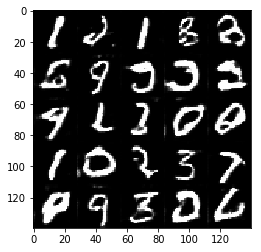

Epoch 2/2 Discriminator loss: 0.7371 Generator loss: 1.3255
Epoch 2/2 Discriminator loss: 0.6251 Generator loss: 1.6512
Epoch 2/2 Discriminator loss: 0.6970 Generator loss: 1.5599
Epoch 2/2 Discriminator loss: 0.8430 Generator loss: 1.1193
Epoch 2/2 Discriminator loss: 0.5825 Generator loss: 2.4309
Epoch 2/2 Discriminator loss: 1.0165 Generator loss: 0.8729
Epoch 2/2 Discriminator loss: 0.9116 Generator loss: 2.1990
Epoch 2/2 Discriminator loss: 1.3831 Generator loss: 0.6496
Epoch 2/2 Discriminator loss: 1.8292 Generator loss: 3.2047
Epoch 2/2 Discriminator loss: 2.2365 Generator loss: 0.2570
Epoch 2/2 Discriminator loss: 0.8341 Generator loss: 2.4559
Epoch 2/2 Discriminator loss: 1.2235 Generator loss: 0.6891
Epoch 2/2 Discriminator loss: 0.7672 Generator loss: 1.6120
Epoch 2/2 Discriminator loss: 0.7460 Generator loss: 1.4158
Epoch 2/2 Discriminator loss: 0.8595 Generator loss: 1.1266
Epoch 2/2 Discriminator loss: 0.6626 Generator loss: 1.7725
Epoch 2/2 Discriminator loss: 0.6377 Gen

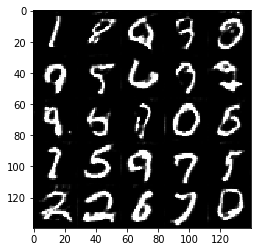

Epoch 2/2 Discriminator loss: 0.8996 Generator loss: 2.2879
Epoch 2/2 Discriminator loss: 0.9433 Generator loss: 0.9325
Epoch 2/2 Discriminator loss: 0.7635 Generator loss: 1.4905
Epoch 2/2 Discriminator loss: 0.8686 Generator loss: 1.1745
Epoch 2/2 Discriminator loss: 0.6561 Generator loss: 1.6494
Epoch 2/2 Discriminator loss: 0.5683 Generator loss: 2.0544
Epoch 2/2 Discriminator loss: 0.5744 Generator loss: 1.7998
Epoch 2/2 Discriminator loss: 0.5824 Generator loss: 1.9424
Epoch 2/2 Discriminator loss: 0.7509 Generator loss: 1.3104
Epoch 2/2 Discriminator loss: 0.7130 Generator loss: 1.3386
Epoch 2/2 Discriminator loss: 0.6391 Generator loss: 1.7373
Epoch 2/2 Discriminator loss: 0.9693 Generator loss: 0.9807
Epoch 2/2 Discriminator loss: 0.7044 Generator loss: 1.7665
Epoch 2/2 Discriminator loss: 0.8213 Generator loss: 1.1522


In [ ]:
batch_size = 64
z_dim = 100
learning_rate = 0.001
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1 Discriminator loss: 4.4708 Generator loss: 0.0276


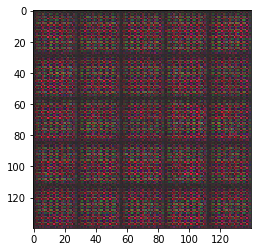

Epoch 1/1 Discriminator loss: 1.0348 Generator loss: 2.6328
Epoch 1/1 Discriminator loss: 2.1676 Generator loss: 0.3597
Epoch 1/1 Discriminator loss: 0.5853 Generator loss: 6.7561
Epoch 1/1 Discriminator loss: 0.7711 Generator loss: 1.7264
Epoch 1/1 Discriminator loss: 0.9684 Generator loss: 1.0310
Epoch 1/1 Discriminator loss: 0.7046 Generator loss: 9.3230
Epoch 1/1 Discriminator loss: 0.6527 Generator loss: 3.2058
Epoch 1/1 Discriminator loss: 2.5485 Generator loss: 0.2075
Epoch 1/1 Discriminator loss: 1.0171 Generator loss: 15.1245
Epoch 1/1 Discriminator loss: 0.4631 Generator loss: 9.7380
Epoch 1/1 Discriminator loss: 3.8425 Generator loss: 0.0583
Epoch 1/1 Discriminator loss: 2.4438 Generator loss: 13.1127
Epoch 1/1 Discriminator loss: 0.8032 Generator loss: 2.7774
Epoch 1/1 Discriminator loss: 8.3286 Generator loss: 0.0055
Epoch 1/1 Discriminator loss: 1.1836 Generator loss: 7.2938
Epoch 1/1 Discriminator loss: 2.7037 Generator loss: 0.2105
Epoch 1/1 Discriminator loss: 1.7823 G

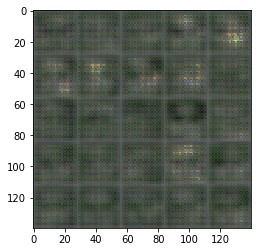

Epoch 1/1 Discriminator loss: 2.9869 Generator loss: 0.1231
Epoch 1/1 Discriminator loss: 1.6432 Generator loss: 2.1493
Epoch 1/1 Discriminator loss: 2.0787 Generator loss: 0.3453
Epoch 1/1 Discriminator loss: 1.4481 Generator loss: 1.1665
Epoch 1/1 Discriminator loss: 2.2175 Generator loss: 0.2558
Epoch 1/1 Discriminator loss: 1.7431 Generator loss: 1.3436
Epoch 1/1 Discriminator loss: 2.4402 Generator loss: 0.1861
Epoch 1/1 Discriminator loss: 1.9195 Generator loss: 1.5918
Epoch 1/1 Discriminator loss: 2.3203 Generator loss: 0.2047
Epoch 1/1 Discriminator loss: 1.8173 Generator loss: 1.7971
Epoch 1/1 Discriminator loss: 2.0593 Generator loss: 0.2524
Epoch 1/1 Discriminator loss: 1.5799 Generator loss: 1.6439
Epoch 1/1 Discriminator loss: 1.9361 Generator loss: 0.3077
Epoch 1/1 Discriminator loss: 1.8154 Generator loss: 1.7861
Epoch 1/1 Discriminator loss: 1.8838 Generator loss: 0.3061
Epoch 1/1 Discriminator loss: 1.5938 Generator loss: 1.0183
Epoch 1/1 Discriminator loss: 1.9422 Gen

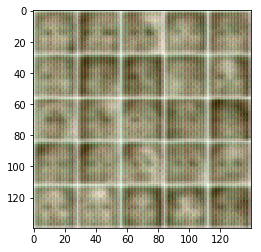

Epoch 1/1 Discriminator loss: 1.7249 Generator loss: 0.5201
Epoch 1/1 Discriminator loss: 1.5896 Generator loss: 0.7641
Epoch 1/1 Discriminator loss: 1.7602 Generator loss: 0.4060
Epoch 1/1 Discriminator loss: 1.6535 Generator loss: 1.0471
Epoch 1/1 Discriminator loss: 2.1832 Generator loss: 0.2044
Epoch 1/1 Discriminator loss: 2.1953 Generator loss: 2.2408
Epoch 1/1 Discriminator loss: 1.7542 Generator loss: 0.3656
Epoch 1/1 Discriminator loss: 1.5087 Generator loss: 0.7256
Epoch 1/1 Discriminator loss: 1.5772 Generator loss: 0.6730
Epoch 1/1 Discriminator loss: 1.4672 Generator loss: 0.6387
Epoch 1/1 Discriminator loss: 1.6468 Generator loss: 0.6181
Epoch 1/1 Discriminator loss: 1.5815 Generator loss: 0.6298
Epoch 1/1 Discriminator loss: 1.5889 Generator loss: 0.5831
Epoch 1/1 Discriminator loss: 1.6714 Generator loss: 0.5222
Epoch 1/1 Discriminator loss: 1.6310 Generator loss: 0.7514
Epoch 1/1 Discriminator loss: 1.7945 Generator loss: 0.3850
Epoch 1/1 Discriminator loss: 1.8023 Gen

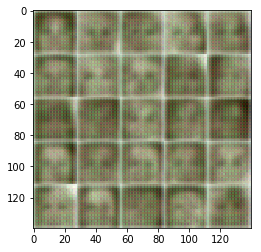

Epoch 1/1 Discriminator loss: 1.5855 Generator loss: 0.8555
Epoch 1/1 Discriminator loss: 1.6774 Generator loss: 0.4894
Epoch 1/1 Discriminator loss: 1.5565 Generator loss: 0.7281
Epoch 1/1 Discriminator loss: 1.6646 Generator loss: 0.4901
Epoch 1/1 Discriminator loss: 1.6818 Generator loss: 0.6238
Epoch 1/1 Discriminator loss: 1.6253 Generator loss: 0.5328
Epoch 1/1 Discriminator loss: 1.5664 Generator loss: 0.8547
Epoch 1/1 Discriminator loss: 1.8140 Generator loss: 0.3192
Epoch 1/1 Discriminator loss: 1.7625 Generator loss: 1.4996
Epoch 1/1 Discriminator loss: 1.8721 Generator loss: 0.2843
Epoch 1/1 Discriminator loss: 1.4902 Generator loss: 1.2200
Epoch 1/1 Discriminator loss: 1.7113 Generator loss: 0.4122
Epoch 1/1 Discriminator loss: 1.5644 Generator loss: 0.7868
Epoch 1/1 Discriminator loss: 1.3366 Generator loss: 0.7158
Epoch 1/1 Discriminator loss: 1.2654 Generator loss: 0.9073
Epoch 1/1 Discriminator loss: 1.7115 Generator loss: 0.4181
Epoch 1/1 Discriminator loss: 1.7161 Gen

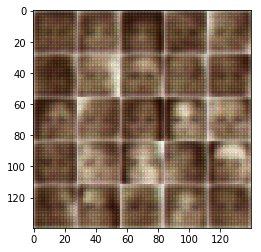

Epoch 1/1 Discriminator loss: 1.4622 Generator loss: 1.3834
Epoch 1/1 Discriminator loss: 1.6230 Generator loss: 0.4390
Epoch 1/1 Discriminator loss: 1.4402 Generator loss: 0.7960
Epoch 1/1 Discriminator loss: 1.5095 Generator loss: 0.5887
Epoch 1/1 Discriminator loss: 1.5253 Generator loss: 0.5492
Epoch 1/1 Discriminator loss: 1.6164 Generator loss: 0.7035
Epoch 1/1 Discriminator loss: 1.5429 Generator loss: 0.4781
Epoch 1/1 Discriminator loss: 1.3494 Generator loss: 1.8428
Epoch 1/1 Discriminator loss: 2.2941 Generator loss: 0.1731
Epoch 1/1 Discriminator loss: 1.5865 Generator loss: 1.7275
Epoch 1/1 Discriminator loss: 1.5704 Generator loss: 0.4465
Epoch 1/1 Discriminator loss: 1.3614 Generator loss: 0.7258
Epoch 1/1 Discriminator loss: 1.6492 Generator loss: 0.5836
Epoch 1/1 Discriminator loss: 1.5573 Generator loss: 0.7337
Epoch 1/1 Discriminator loss: 1.5673 Generator loss: 0.5149
Epoch 1/1 Discriminator loss: 1.4550 Generator loss: 1.1288
Epoch 1/1 Discriminator loss: 1.8202 Gen

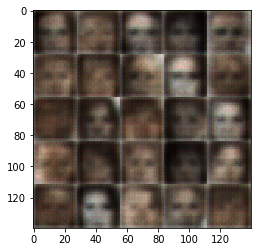

Epoch 1/1 Discriminator loss: 1.3263 Generator loss: 0.8477
Epoch 1/1 Discriminator loss: 1.2982 Generator loss: 0.7603
Epoch 1/1 Discriminator loss: 1.3826 Generator loss: 0.6792
Epoch 1/1 Discriminator loss: 1.5196 Generator loss: 0.7399
Epoch 1/1 Discriminator loss: 1.3399 Generator loss: 0.7150
Epoch 1/1 Discriminator loss: 1.4539 Generator loss: 0.6090
Epoch 1/1 Discriminator loss: 1.3604 Generator loss: 0.8617
Epoch 1/1 Discriminator loss: 1.2590 Generator loss: 0.7575
Epoch 1/1 Discriminator loss: 1.1678 Generator loss: 0.9366
Epoch 1/1 Discriminator loss: 1.4886 Generator loss: 0.5038
Epoch 1/1 Discriminator loss: 2.0167 Generator loss: 1.8103
Epoch 1/1 Discriminator loss: 2.5933 Generator loss: 0.1366
Epoch 1/1 Discriminator loss: 1.5745 Generator loss: 1.4674
Epoch 1/1 Discriminator loss: 1.5021 Generator loss: 0.5636
Epoch 1/1 Discriminator loss: 1.4983 Generator loss: 0.6129
Epoch 1/1 Discriminator loss: 1.4180 Generator loss: 0.8372
Epoch 1/1 Discriminator loss: 1.5516 Gen

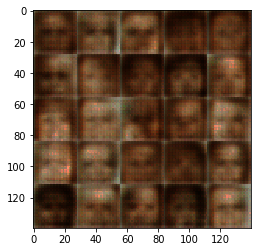

Epoch 1/1 Discriminator loss: 2.2722 Generator loss: 0.1686
Epoch 1/1 Discriminator loss: 1.5858 Generator loss: 1.6032
Epoch 1/1 Discriminator loss: 1.5221 Generator loss: 0.4994
Epoch 1/1 Discriminator loss: 1.3148 Generator loss: 1.0636
Epoch 1/1 Discriminator loss: 1.3782 Generator loss: 0.6410
Epoch 1/1 Discriminator loss: 1.4070 Generator loss: 0.7263
Epoch 1/1 Discriminator loss: 1.3407 Generator loss: 0.8014
Epoch 1/1 Discriminator loss: 1.2203 Generator loss: 0.8876
Epoch 1/1 Discriminator loss: 1.5414 Generator loss: 0.4465
Epoch 1/1 Discriminator loss: 1.6700 Generator loss: 1.2479
Epoch 1/1 Discriminator loss: 1.9748 Generator loss: 0.2403
Epoch 1/1 Discriminator loss: 1.7731 Generator loss: 1.3085
Epoch 1/1 Discriminator loss: 1.5524 Generator loss: 0.4457
Epoch 1/1 Discriminator loss: 1.3290 Generator loss: 0.8350
Epoch 1/1 Discriminator loss: 1.4011 Generator loss: 0.6949
Epoch 1/1 Discriminator loss: 1.4218 Generator loss: 0.7390
Epoch 1/1 Discriminator loss: 1.2963 Gen

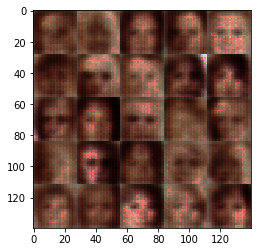

Epoch 1/1 Discriminator loss: 1.6903 Generator loss: 0.3597
Epoch 1/1 Discriminator loss: 1.4572 Generator loss: 1.1502
Epoch 1/1 Discriminator loss: 1.5231 Generator loss: 0.5070
Epoch 1/1 Discriminator loss: 1.4135 Generator loss: 0.6997
Epoch 1/1 Discriminator loss: 1.3316 Generator loss: 0.7413
Epoch 1/1 Discriminator loss: 1.3678 Generator loss: 0.9317
Epoch 1/1 Discriminator loss: 1.6987 Generator loss: 0.3713
Epoch 1/1 Discriminator loss: 1.6366 Generator loss: 1.1642
Epoch 1/1 Discriminator loss: 1.6841 Generator loss: 0.3598
Epoch 1/1 Discriminator loss: 1.6386 Generator loss: 1.0377
Epoch 1/1 Discriminator loss: 1.5981 Generator loss: 0.4429
Epoch 1/1 Discriminator loss: 1.2478 Generator loss: 1.1096
Epoch 1/1 Discriminator loss: 1.5533 Generator loss: 0.4392
Epoch 1/1 Discriminator loss: 1.3536 Generator loss: 0.7593
Epoch 1/1 Discriminator loss: 1.4214 Generator loss: 0.8756
Epoch 1/1 Discriminator loss: 1.5185 Generator loss: 0.5297
Epoch 1/1 Discriminator loss: 1.3260 Gen

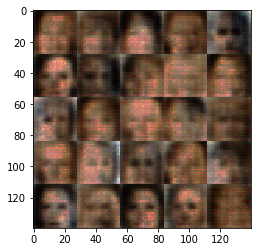

Epoch 1/1 Discriminator loss: 1.4395 Generator loss: 1.0659
Epoch 1/1 Discriminator loss: 1.6880 Generator loss: 0.3688
Epoch 1/1 Discriminator loss: 1.5487 Generator loss: 1.1511
Epoch 1/1 Discriminator loss: 1.6265 Generator loss: 0.4266
Epoch 1/1 Discriminator loss: 1.4391 Generator loss: 1.1798
Epoch 1/1 Discriminator loss: 1.5962 Generator loss: 0.4645
Epoch 1/1 Discriminator loss: 1.4208 Generator loss: 0.9100
Epoch 1/1 Discriminator loss: 1.5825 Generator loss: 0.5268
Epoch 1/1 Discriminator loss: 1.3613 Generator loss: 0.8913
Epoch 1/1 Discriminator loss: 1.5242 Generator loss: 0.6314
Epoch 1/1 Discriminator loss: 1.3602 Generator loss: 0.7902
Epoch 1/1 Discriminator loss: 1.3924 Generator loss: 0.7018
Epoch 1/1 Discriminator loss: 1.4910 Generator loss: 0.6450
Epoch 1/1 Discriminator loss: 1.4755 Generator loss: 0.5386
Epoch 1/1 Discriminator loss: 1.4822 Generator loss: 0.8425
Epoch 1/1 Discriminator loss: 1.4046 Generator loss: 0.6865
Epoch 1/1 Discriminator loss: 1.6028 Gen

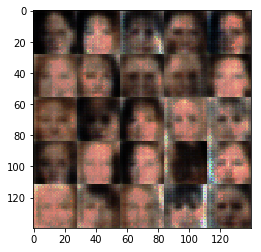

Epoch 1/1 Discriminator loss: 1.4036 Generator loss: 0.8122
Epoch 1/1 Discriminator loss: 1.4696 Generator loss: 0.5726
Epoch 1/1 Discriminator loss: 1.4722 Generator loss: 0.7683
Epoch 1/1 Discriminator loss: 1.5164 Generator loss: 0.5433
Epoch 1/1 Discriminator loss: 1.5293 Generator loss: 0.6148
Epoch 1/1 Discriminator loss: 1.4184 Generator loss: 1.1175
Epoch 1/1 Discriminator loss: 2.0416 Generator loss: 0.2564
Epoch 1/1 Discriminator loss: 1.9386 Generator loss: 1.7157
Epoch 1/1 Discriminator loss: 1.6776 Generator loss: 0.3892
Epoch 1/1 Discriminator loss: 1.3636 Generator loss: 1.0341
Epoch 1/1 Discriminator loss: 1.4950 Generator loss: 0.5056
Epoch 1/1 Discriminator loss: 1.5602 Generator loss: 0.7816
Epoch 1/1 Discriminator loss: 1.5125 Generator loss: 0.5802
Epoch 1/1 Discriminator loss: 1.5088 Generator loss: 0.7629
Epoch 1/1 Discriminator loss: 1.4926 Generator loss: 0.6827
Epoch 1/1 Discriminator loss: 1.4244 Generator loss: 0.7513
Epoch 1/1 Discriminator loss: 1.4586 Gen

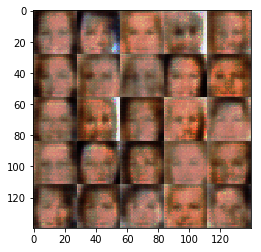

Epoch 1/1 Discriminator loss: 1.4953 Generator loss: 0.7401
Epoch 1/1 Discriminator loss: 1.5243 Generator loss: 0.5804
Epoch 1/1 Discriminator loss: 1.4763 Generator loss: 0.6241
Epoch 1/1 Discriminator loss: 1.5576 Generator loss: 0.6302
Epoch 1/1 Discriminator loss: 1.5495 Generator loss: 0.6335
Epoch 1/1 Discriminator loss: 1.5436 Generator loss: 0.6245
Epoch 1/1 Discriminator loss: 1.5536 Generator loss: 0.6566
Epoch 1/1 Discriminator loss: 1.4800 Generator loss: 0.6558
Epoch 1/1 Discriminator loss: 1.5365 Generator loss: 0.6515
Epoch 1/1 Discriminator loss: 1.5402 Generator loss: 0.7756
Epoch 1/1 Discriminator loss: 1.5290 Generator loss: 0.6492
Epoch 1/1 Discriminator loss: 1.4990 Generator loss: 0.5348
Epoch 1/1 Discriminator loss: 1.5069 Generator loss: 0.9572
Epoch 1/1 Discriminator loss: 1.5261 Generator loss: 0.5276
Epoch 1/1 Discriminator loss: 1.5444 Generator loss: 0.6529
Epoch 1/1 Discriminator loss: 1.5121 Generator loss: 0.5676
Epoch 1/1 Discriminator loss: 1.4540 Gen

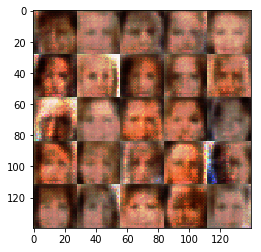

Epoch 1/1 Discriminator loss: 1.4847 Generator loss: 0.7028
Epoch 1/1 Discriminator loss: 1.4606 Generator loss: 0.6163
Epoch 1/1 Discriminator loss: 1.5425 Generator loss: 0.8335
Epoch 1/1 Discriminator loss: 1.4592 Generator loss: 0.6479
Epoch 1/1 Discriminator loss: 1.5307 Generator loss: 0.6083
Epoch 1/1 Discriminator loss: 1.5303 Generator loss: 0.7753
Epoch 1/1 Discriminator loss: 1.4854 Generator loss: 0.5658
Epoch 1/1 Discriminator loss: 1.5073 Generator loss: 0.7685
Epoch 1/1 Discriminator loss: 1.4391 Generator loss: 0.6118
Epoch 1/1 Discriminator loss: 1.5817 Generator loss: 0.6858
Epoch 1/1 Discriminator loss: 1.4937 Generator loss: 0.6359
Epoch 1/1 Discriminator loss: 1.4317 Generator loss: 0.7880
Epoch 1/1 Discriminator loss: 1.4837 Generator loss: 0.6561
Epoch 1/1 Discriminator loss: 1.4174 Generator loss: 0.7897
Epoch 1/1 Discriminator loss: 1.5029 Generator loss: 0.6055
Epoch 1/1 Discriminator loss: 1.5641 Generator loss: 0.6199
Epoch 1/1 Discriminator loss: 1.4902 Gen

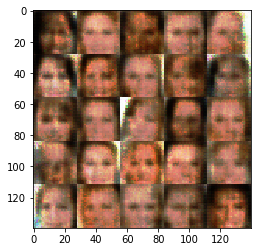

Epoch 1/1 Discriminator loss: 1.4784 Generator loss: 0.9866
Epoch 1/1 Discriminator loss: 1.4857 Generator loss: 0.5840
Epoch 1/1 Discriminator loss: 1.4226 Generator loss: 0.8112
Epoch 1/1 Discriminator loss: 1.4774 Generator loss: 0.6432
Epoch 1/1 Discriminator loss: 1.4931 Generator loss: 0.6157
Epoch 1/1 Discriminator loss: 1.4577 Generator loss: 0.7812
Epoch 1/1 Discriminator loss: 1.4615 Generator loss: 0.5946
Epoch 1/1 Discriminator loss: 1.4599 Generator loss: 0.7980
Epoch 1/1 Discriminator loss: 1.4688 Generator loss: 0.6087
Epoch 1/1 Discriminator loss: 1.5245 Generator loss: 0.7556
Epoch 1/1 Discriminator loss: 1.4872 Generator loss: 0.5666
Epoch 1/1 Discriminator loss: 1.4441 Generator loss: 0.8543
Epoch 1/1 Discriminator loss: 1.5552 Generator loss: 0.5340
Epoch 1/1 Discriminator loss: 1.4967 Generator loss: 0.8764
Epoch 1/1 Discriminator loss: 1.4969 Generator loss: 0.5587
Epoch 1/1 Discriminator loss: 1.4550 Generator loss: 0.6943
Epoch 1/1 Discriminator loss: 1.4054 Gen

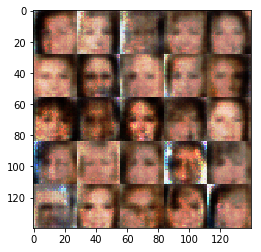

Epoch 1/1 Discriminator loss: 1.4201 Generator loss: 0.6959
Epoch 1/1 Discriminator loss: 1.4584 Generator loss: 0.6820
Epoch 1/1 Discriminator loss: 1.5347 Generator loss: 0.7181
Epoch 1/1 Discriminator loss: 1.4508 Generator loss: 0.6567
Epoch 1/1 Discriminator loss: 1.4808 Generator loss: 0.6771
Epoch 1/1 Discriminator loss: 1.4849 Generator loss: 0.7592
Epoch 1/1 Discriminator loss: 1.4571 Generator loss: 0.6502
Epoch 1/1 Discriminator loss: 1.4233 Generator loss: 0.7328
Epoch 1/1 Discriminator loss: 1.4219 Generator loss: 0.6272
Epoch 1/1 Discriminator loss: 1.3853 Generator loss: 0.8120
Epoch 1/1 Discriminator loss: 1.4174 Generator loss: 0.6663
Epoch 1/1 Discriminator loss: 1.5151 Generator loss: 0.8112
Epoch 1/1 Discriminator loss: 1.5260 Generator loss: 0.5302
Epoch 1/1 Discriminator loss: 1.4999 Generator loss: 0.7783
Epoch 1/1 Discriminator loss: 1.4457 Generator loss: 0.5963
Epoch 1/1 Discriminator loss: 1.5104 Generator loss: 0.8741
Epoch 1/1 Discriminator loss: 1.4535 Gen

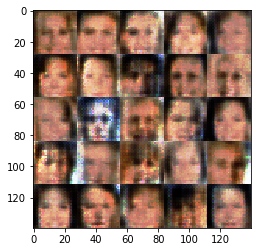

Epoch 1/1 Discriminator loss: 1.4906 Generator loss: 0.5880
Epoch 1/1 Discriminator loss: 1.3680 Generator loss: 0.8082
Epoch 1/1 Discriminator loss: 1.4412 Generator loss: 0.6782
Epoch 1/1 Discriminator loss: 1.4565 Generator loss: 0.7263
Epoch 1/1 Discriminator loss: 1.4721 Generator loss: 0.6570
Epoch 1/1 Discriminator loss: 1.5019 Generator loss: 0.7272
Epoch 1/1 Discriminator loss: 1.4878 Generator loss: 0.5886
Epoch 1/1 Discriminator loss: 1.4668 Generator loss: 0.7714
Epoch 1/1 Discriminator loss: 1.4603 Generator loss: 0.5190
Epoch 1/1 Discriminator loss: 1.4077 Generator loss: 0.9741
Epoch 1/1 Discriminator loss: 1.4316 Generator loss: 0.6119
Epoch 1/1 Discriminator loss: 1.4061 Generator loss: 0.7674
Epoch 1/1 Discriminator loss: 1.4599 Generator loss: 0.7202
Epoch 1/1 Discriminator loss: 1.4220 Generator loss: 0.7164
Epoch 1/1 Discriminator loss: 1.3832 Generator loss: 0.7036
Epoch 1/1 Discriminator loss: 1.4041 Generator loss: 0.7682
Epoch 1/1 Discriminator loss: 1.4267 Gen

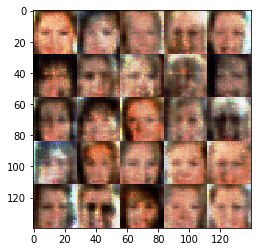

Epoch 1/1 Discriminator loss: 1.4304 Generator loss: 0.8169
Epoch 1/1 Discriminator loss: 1.4509 Generator loss: 0.6287
Epoch 1/1 Discriminator loss: 1.4736 Generator loss: 0.7083
Epoch 1/1 Discriminator loss: 1.4127 Generator loss: 0.7846
Epoch 1/1 Discriminator loss: 1.4096 Generator loss: 0.6585
Epoch 1/1 Discriminator loss: 1.4028 Generator loss: 0.6658
Epoch 1/1 Discriminator loss: 1.4136 Generator loss: 0.8685
Epoch 1/1 Discriminator loss: 1.4833 Generator loss: 0.5817
Epoch 1/1 Discriminator loss: 1.4591 Generator loss: 0.8210
Epoch 1/1 Discriminator loss: 1.5171 Generator loss: 0.5585
Epoch 1/1 Discriminator loss: 1.4657 Generator loss: 0.8438
Epoch 1/1 Discriminator loss: 1.5374 Generator loss: 0.5098
Epoch 1/1 Discriminator loss: 1.5038 Generator loss: 1.1626
Epoch 1/1 Discriminator loss: 1.6797 Generator loss: 0.3584
Epoch 1/1 Discriminator loss: 1.5634 Generator loss: 1.2826
Epoch 1/1 Discriminator loss: 1.4614 Generator loss: 0.6016
Epoch 1/1 Discriminator loss: 1.4824 Gen

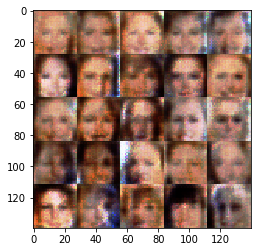

Epoch 1/1 Discriminator loss: 1.4138 Generator loss: 0.7158
Epoch 1/1 Discriminator loss: 1.4599 Generator loss: 0.6070
Epoch 1/1 Discriminator loss: 1.3861 Generator loss: 0.8786
Epoch 1/1 Discriminator loss: 1.4036 Generator loss: 0.6914
Epoch 1/1 Discriminator loss: 1.4225 Generator loss: 0.7478
Epoch 1/1 Discriminator loss: 1.3956 Generator loss: 0.6887
Epoch 1/1 Discriminator loss: 1.4190 Generator loss: 0.8152
Epoch 1/1 Discriminator loss: 1.4633 Generator loss: 0.6092
Epoch 1/1 Discriminator loss: 1.3817 Generator loss: 0.9430
Epoch 1/1 Discriminator loss: 1.4441 Generator loss: 0.5687
Epoch 1/1 Discriminator loss: 1.4967 Generator loss: 1.0937
Epoch 1/1 Discriminator loss: 1.5289 Generator loss: 0.4977
Epoch 1/1 Discriminator loss: 1.5160 Generator loss: 0.9590
Epoch 1/1 Discriminator loss: 1.5051 Generator loss: 0.4844
Epoch 1/1 Discriminator loss: 1.4519 Generator loss: 1.0486
Epoch 1/1 Discriminator loss: 1.5092 Generator loss: 0.4868
Epoch 1/1 Discriminator loss: 1.3560 Gen

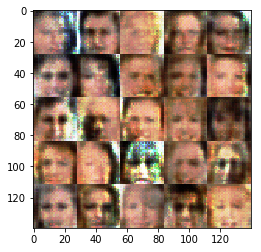

Epoch 1/1 Discriminator loss: 1.4114 Generator loss: 0.7046
Epoch 1/1 Discriminator loss: 1.4417 Generator loss: 0.6923
Epoch 1/1 Discriminator loss: 1.3746 Generator loss: 0.8273
Epoch 1/1 Discriminator loss: 1.5061 Generator loss: 0.5752
Epoch 1/1 Discriminator loss: 1.4259 Generator loss: 0.7338
Epoch 1/1 Discriminator loss: 1.4336 Generator loss: 0.7698
Epoch 1/1 Discriminator loss: 1.4733 Generator loss: 0.7015
Epoch 1/1 Discriminator loss: 1.3793 Generator loss: 0.7362
Epoch 1/1 Discriminator loss: 1.3751 Generator loss: 0.7873
Epoch 1/1 Discriminator loss: 1.3422 Generator loss: 0.8771
Epoch 1/1 Discriminator loss: 1.3522 Generator loss: 0.6274
Epoch 1/1 Discriminator loss: 1.3651 Generator loss: 0.9905
Epoch 1/1 Discriminator loss: 1.4407 Generator loss: 0.5251
Epoch 1/1 Discriminator loss: 1.3671 Generator loss: 0.8818
Epoch 1/1 Discriminator loss: 1.4403 Generator loss: 0.6156
Epoch 1/1 Discriminator loss: 1.3968 Generator loss: 0.8630
Epoch 1/1 Discriminator loss: 1.4722 Gen

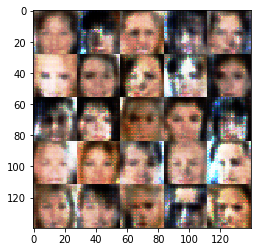

Epoch 1/1 Discriminator loss: 1.4901 Generator loss: 0.4675
Epoch 1/1 Discriminator loss: 1.6201 Generator loss: 1.4530
Epoch 1/1 Discriminator loss: 1.6081 Generator loss: 0.3564
Epoch 1/1 Discriminator loss: 1.5144 Generator loss: 1.1084
Epoch 1/1 Discriminator loss: 1.4508 Generator loss: 0.6186
Epoch 1/1 Discriminator loss: 1.5101 Generator loss: 0.6438
Epoch 1/1 Discriminator loss: 1.4618 Generator loss: 0.8354
Epoch 1/1 Discriminator loss: 1.4987 Generator loss: 0.7095
Epoch 1/1 Discriminator loss: 1.3923 Generator loss: 0.7937
Epoch 1/1 Discriminator loss: 1.3923 Generator loss: 0.7259
Epoch 1/1 Discriminator loss: 1.4188 Generator loss: 0.8233
Epoch 1/1 Discriminator loss: 1.3727 Generator loss: 0.7387
Epoch 1/1 Discriminator loss: 1.3155 Generator loss: 0.9025
Epoch 1/1 Discriminator loss: 1.4862 Generator loss: 0.5240
Epoch 1/1 Discriminator loss: 1.4156 Generator loss: 1.0226
Epoch 1/1 Discriminator loss: 1.4757 Generator loss: 0.4950
Epoch 1/1 Discriminator loss: 1.3782 Gen

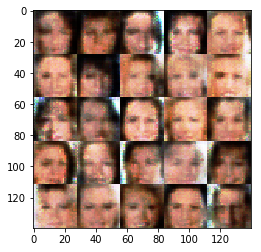

Epoch 1/1 Discriminator loss: 1.4293 Generator loss: 0.6705
Epoch 1/1 Discriminator loss: 1.3610 Generator loss: 0.7727
Epoch 1/1 Discriminator loss: 1.4384 Generator loss: 0.7680
Epoch 1/1 Discriminator loss: 1.4090 Generator loss: 0.6630
Epoch 1/1 Discriminator loss: 1.3867 Generator loss: 0.8475
Epoch 1/1 Discriminator loss: 1.3986 Generator loss: 0.6384
Epoch 1/1 Discriminator loss: 1.3880 Generator loss: 0.8729
Epoch 1/1 Discriminator loss: 1.3895 Generator loss: 0.7202
Epoch 1/1 Discriminator loss: 1.3932 Generator loss: 0.7228
Epoch 1/1 Discriminator loss: 1.4008 Generator loss: 0.9081
Epoch 1/1 Discriminator loss: 1.4129 Generator loss: 0.6601
Epoch 1/1 Discriminator loss: 1.4257 Generator loss: 0.7763
Epoch 1/1 Discriminator loss: 1.4228 Generator loss: 0.6655
Epoch 1/1 Discriminator loss: 1.3988 Generator loss: 0.8055
Epoch 1/1 Discriminator loss: 1.4150 Generator loss: 0.6431
Epoch 1/1 Discriminator loss: 1.3788 Generator loss: 0.7782
Epoch 1/1 Discriminator loss: 1.3260 Gen

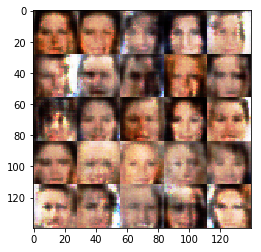

Epoch 1/1 Discriminator loss: 1.3810 Generator loss: 0.5715
Epoch 1/1 Discriminator loss: 1.4093 Generator loss: 1.1692
Epoch 1/1 Discriminator loss: 1.4731 Generator loss: 0.4900
Epoch 1/1 Discriminator loss: 1.5148 Generator loss: 0.9197
Epoch 1/1 Discriminator loss: 1.4113 Generator loss: 0.6082
Epoch 1/1 Discriminator loss: 1.3809 Generator loss: 0.8506
Epoch 1/1 Discriminator loss: 1.4151 Generator loss: 0.6445
Epoch 1/1 Discriminator loss: 1.3963 Generator loss: 0.9211
Epoch 1/1 Discriminator loss: 1.3979 Generator loss: 0.6353
Epoch 1/1 Discriminator loss: 1.3715 Generator loss: 0.9616
Epoch 1/1 Discriminator loss: 1.3911 Generator loss: 0.5890
Epoch 1/1 Discriminator loss: 1.3649 Generator loss: 0.9613
Epoch 1/1 Discriminator loss: 1.4418 Generator loss: 0.5687
Epoch 1/1 Discriminator loss: 1.4321 Generator loss: 1.0450
Epoch 1/1 Discriminator loss: 1.4019 Generator loss: 0.5950
Epoch 1/1 Discriminator loss: 1.4254 Generator loss: 0.8972
Epoch 1/1 Discriminator loss: 1.3803 Gen

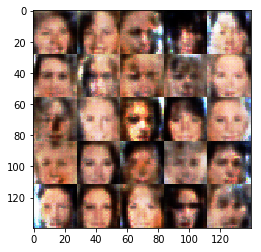

Epoch 1/1 Discriminator loss: 1.4123 Generator loss: 0.8325
Epoch 1/1 Discriminator loss: 1.3830 Generator loss: 0.8422
Epoch 1/1 Discriminator loss: 1.4170 Generator loss: 0.7496
Epoch 1/1 Discriminator loss: 1.4014 Generator loss: 0.7183
Epoch 1/1 Discriminator loss: 1.3715 Generator loss: 0.6936
Epoch 1/1 Discriminator loss: 1.3134 Generator loss: 0.8317
Epoch 1/1 Discriminator loss: 1.3701 Generator loss: 0.7232
Epoch 1/1 Discriminator loss: 1.3386 Generator loss: 0.7247
Epoch 1/1 Discriminator loss: 1.3201 Generator loss: 0.8979
Epoch 1/1 Discriminator loss: 1.4838 Generator loss: 0.4753
Epoch 1/1 Discriminator loss: 1.4368 Generator loss: 1.3535
Epoch 1/1 Discriminator loss: 1.6098 Generator loss: 0.4149
Epoch 1/1 Discriminator loss: 1.8204 Generator loss: 1.6439
Epoch 1/1 Discriminator loss: 1.4890 Generator loss: 0.4703
Epoch 1/1 Discriminator loss: 1.3946 Generator loss: 0.8905
Epoch 1/1 Discriminator loss: 1.3957 Generator loss: 0.7921
Epoch 1/1 Discriminator loss: 1.4545 Gen

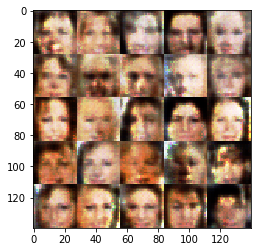

Epoch 1/1 Discriminator loss: 1.4519 Generator loss: 0.7533
Epoch 1/1 Discriminator loss: 1.3976 Generator loss: 0.7679
Epoch 1/1 Discriminator loss: 1.3854 Generator loss: 0.7778
Epoch 1/1 Discriminator loss: 1.4041 Generator loss: 0.6625
Epoch 1/1 Discriminator loss: 1.3720 Generator loss: 0.9903
Epoch 1/1 Discriminator loss: 1.3655 Generator loss: 0.7123
Epoch 1/1 Discriminator loss: 1.3873 Generator loss: 0.7262
Epoch 1/1 Discriminator loss: 1.3579 Generator loss: 0.7548
Epoch 1/1 Discriminator loss: 1.4192 Generator loss: 0.7971
Epoch 1/1 Discriminator loss: 1.3748 Generator loss: 0.6755
Epoch 1/1 Discriminator loss: 1.3930 Generator loss: 0.7718
Epoch 1/1 Discriminator loss: 1.4022 Generator loss: 0.7610
Epoch 1/1 Discriminator loss: 1.3594 Generator loss: 0.8334
Epoch 1/1 Discriminator loss: 1.3823 Generator loss: 0.6901
Epoch 1/1 Discriminator loss: 1.3790 Generator loss: 0.7937
Epoch 1/1 Discriminator loss: 1.3940 Generator loss: 0.7874
Epoch 1/1 Discriminator loss: 1.4117 Gen

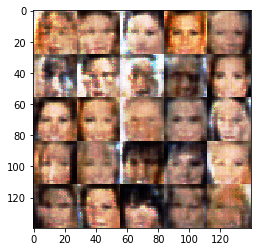

Epoch 1/1 Discriminator loss: 1.3655 Generator loss: 0.6719
Epoch 1/1 Discriminator loss: 1.3889 Generator loss: 0.7403
Epoch 1/1 Discriminator loss: 1.3480 Generator loss: 0.6839
Epoch 1/1 Discriminator loss: 1.3972 Generator loss: 0.9484
Epoch 1/1 Discriminator loss: 1.5005 Generator loss: 0.4913
Epoch 1/1 Discriminator loss: 1.5260 Generator loss: 1.1430
Epoch 1/1 Discriminator loss: 1.4498 Generator loss: 0.5698
Epoch 1/1 Discriminator loss: 1.3838 Generator loss: 0.9668
Epoch 1/1 Discriminator loss: 1.3681 Generator loss: 0.6893
Epoch 1/1 Discriminator loss: 1.3639 Generator loss: 0.8148
Epoch 1/1 Discriminator loss: 1.3381 Generator loss: 0.7469
Epoch 1/1 Discriminator loss: 1.3537 Generator loss: 0.7401
Epoch 1/1 Discriminator loss: 1.3912 Generator loss: 0.7782
Epoch 1/1 Discriminator loss: 1.2358 Generator loss: 0.9484
Epoch 1/1 Discriminator loss: 1.3943 Generator loss: 0.6066
Epoch 1/1 Discriminator loss: 1.3809 Generator loss: 1.0416
Epoch 1/1 Discriminator loss: 1.4378 Gen

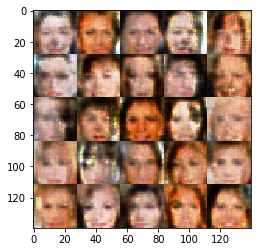

Epoch 1/1 Discriminator loss: 1.4493 Generator loss: 0.6145
Epoch 1/1 Discriminator loss: 1.3991 Generator loss: 0.8862
Epoch 1/1 Discriminator loss: 1.3478 Generator loss: 0.6962
Epoch 1/1 Discriminator loss: 1.3392 Generator loss: 1.1403
Epoch 1/1 Discriminator loss: 1.4804 Generator loss: 0.4587
Epoch 1/1 Discriminator loss: 1.4113 Generator loss: 1.0086
Epoch 1/1 Discriminator loss: 1.3664 Generator loss: 0.6140
Epoch 1/1 Discriminator loss: 1.3844 Generator loss: 0.7855
Epoch 1/1 Discriminator loss: 1.3587 Generator loss: 0.6829
Epoch 1/1 Discriminator loss: 1.3769 Generator loss: 1.0393
Epoch 1/1 Discriminator loss: 1.5089 Generator loss: 0.4843
Epoch 1/1 Discriminator loss: 1.5340 Generator loss: 1.3259
Epoch 1/1 Discriminator loss: 1.5850 Generator loss: 0.4185
Epoch 1/1 Discriminator loss: 1.4419 Generator loss: 1.0270
Epoch 1/1 Discriminator loss: 1.4337 Generator loss: 0.6488
Epoch 1/1 Discriminator loss: 1.4177 Generator loss: 0.7186
Epoch 1/1 Discriminator loss: 1.3943 Gen

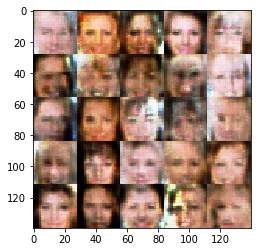

Epoch 1/1 Discriminator loss: 1.4451 Generator loss: 0.5079
Epoch 1/1 Discriminator loss: 1.5090 Generator loss: 1.1037
Epoch 1/1 Discriminator loss: 1.4151 Generator loss: 0.6069
Epoch 1/1 Discriminator loss: 1.4241 Generator loss: 0.8445
Epoch 1/1 Discriminator loss: 1.3702 Generator loss: 0.6448
Epoch 1/1 Discriminator loss: 1.3806 Generator loss: 0.8015
Epoch 1/1 Discriminator loss: 1.3460 Generator loss: 0.8124
Epoch 1/1 Discriminator loss: 1.3372 Generator loss: 0.7887
Epoch 1/1 Discriminator loss: 1.3249 Generator loss: 0.7618
Epoch 1/1 Discriminator loss: 1.3274 Generator loss: 0.9124
Epoch 1/1 Discriminator loss: 1.3887 Generator loss: 0.6076
Epoch 1/1 Discriminator loss: 1.4539 Generator loss: 0.9296
Epoch 1/1 Discriminator loss: 1.3858 Generator loss: 0.5695
Epoch 1/1 Discriminator loss: 1.4790 Generator loss: 0.9589
Epoch 1/1 Discriminator loss: 1.4348 Generator loss: 0.6094
Epoch 1/1 Discriminator loss: 1.4339 Generator loss: 0.9767
Epoch 1/1 Discriminator loss: 1.4736 Gen

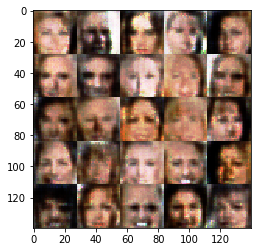

Epoch 1/1 Discriminator loss: 1.4802 Generator loss: 0.5902
Epoch 1/1 Discriminator loss: 1.4608 Generator loss: 0.8368
Epoch 1/1 Discriminator loss: 1.3812 Generator loss: 0.6778
Epoch 1/1 Discriminator loss: 1.3630 Generator loss: 0.8734
Epoch 1/1 Discriminator loss: 1.3777 Generator loss: 0.6525
Epoch 1/1 Discriminator loss: 1.3098 Generator loss: 0.9724
Epoch 1/1 Discriminator loss: 1.3565 Generator loss: 0.6663
Epoch 1/1 Discriminator loss: 1.3443 Generator loss: 0.8959
Epoch 1/1 Discriminator loss: 1.4008 Generator loss: 0.6417
Epoch 1/1 Discriminator loss: 1.3945 Generator loss: 0.9414
Epoch 1/1 Discriminator loss: 1.4227 Generator loss: 0.5980
Epoch 1/1 Discriminator loss: 1.4016 Generator loss: 1.0178
Epoch 1/1 Discriminator loss: 1.3917 Generator loss: 0.5956
Epoch 1/1 Discriminator loss: 1.3696 Generator loss: 1.1935
Epoch 1/1 Discriminator loss: 1.5632 Generator loss: 0.3903
Epoch 1/1 Discriminator loss: 1.8728 Generator loss: 1.4091
Epoch 1/1 Discriminator loss: 1.6499 Gen

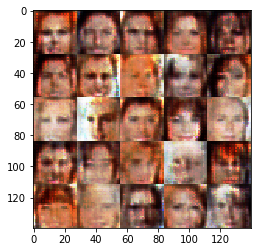

Epoch 1/1 Discriminator loss: 1.4861 Generator loss: 0.7074
Epoch 1/1 Discriminator loss: 1.4068 Generator loss: 0.8208
Epoch 1/1 Discriminator loss: 1.3847 Generator loss: 0.7533
Epoch 1/1 Discriminator loss: 1.4773 Generator loss: 0.7034
Epoch 1/1 Discriminator loss: 1.4202 Generator loss: 0.7214
Epoch 1/1 Discriminator loss: 1.4089 Generator loss: 0.7095
Epoch 1/1 Discriminator loss: 1.3977 Generator loss: 0.7387
Epoch 1/1 Discriminator loss: 1.3632 Generator loss: 0.8677
Epoch 1/1 Discriminator loss: 1.3842 Generator loss: 0.8601
Epoch 1/1 Discriminator loss: 1.3640 Generator loss: 0.7052
Epoch 1/1 Discriminator loss: 1.4540 Generator loss: 0.9062
Epoch 1/1 Discriminator loss: 1.4027 Generator loss: 0.6737
Epoch 1/1 Discriminator loss: 1.3577 Generator loss: 0.8732
Epoch 1/1 Discriminator loss: 1.3655 Generator loss: 0.7425
Epoch 1/1 Discriminator loss: 1.4169 Generator loss: 0.7325
Epoch 1/1 Discriminator loss: 1.3847 Generator loss: 0.7676
Epoch 1/1 Discriminator loss: 1.4024 Gen

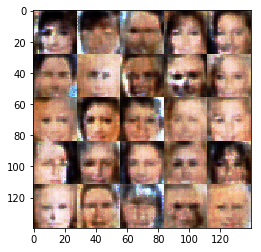

Epoch 1/1 Discriminator loss: 1.3389 Generator loss: 0.7370
Epoch 1/1 Discriminator loss: 1.3620 Generator loss: 0.7651
Epoch 1/1 Discriminator loss: 1.4404 Generator loss: 0.7113
Epoch 1/1 Discriminator loss: 1.3842 Generator loss: 0.7411
Epoch 1/1 Discriminator loss: 1.3779 Generator loss: 0.7940
Epoch 1/1 Discriminator loss: 1.3443 Generator loss: 0.7939
Epoch 1/1 Discriminator loss: 1.2815 Generator loss: 0.8958
Epoch 1/1 Discriminator loss: 1.3842 Generator loss: 0.5969
Epoch 1/1 Discriminator loss: 1.4606 Generator loss: 1.1085
Epoch 1/1 Discriminator loss: 1.4625 Generator loss: 0.5027
Epoch 1/1 Discriminator loss: 1.4347 Generator loss: 1.0267
Epoch 1/1 Discriminator loss: 1.4527 Generator loss: 0.5165
Epoch 1/1 Discriminator loss: 1.4685 Generator loss: 0.9656
Epoch 1/1 Discriminator loss: 1.4853 Generator loss: 0.5663
Epoch 1/1 Discriminator loss: 1.3964 Generator loss: 0.9442
Epoch 1/1 Discriminator loss: 1.3463 Generator loss: 0.8025
Epoch 1/1 Discriminator loss: 1.3684 Gen

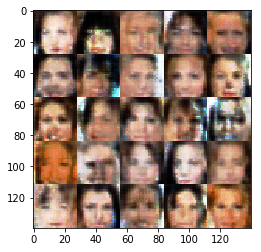

Epoch 1/1 Discriminator loss: 1.4961 Generator loss: 0.4653
Epoch 1/1 Discriminator loss: 1.5014 Generator loss: 1.3961
Epoch 1/1 Discriminator loss: 1.4909 Generator loss: 0.4637
Epoch 1/1 Discriminator loss: 1.4554 Generator loss: 0.7354
Epoch 1/1 Discriminator loss: 1.4275 Generator loss: 0.7600
Epoch 1/1 Discriminator loss: 1.3708 Generator loss: 0.8375
Epoch 1/1 Discriminator loss: 1.3651 Generator loss: 0.7559
Epoch 1/1 Discriminator loss: 1.3941 Generator loss: 0.7702
Epoch 1/1 Discriminator loss: 1.4260 Generator loss: 0.7182
Epoch 1/1 Discriminator loss: 1.3743 Generator loss: 0.7897
Epoch 1/1 Discriminator loss: 1.3669 Generator loss: 0.7396
Epoch 1/1 Discriminator loss: 1.3683 Generator loss: 0.7889
Epoch 1/1 Discriminator loss: 1.3813 Generator loss: 0.7199
Epoch 1/1 Discriminator loss: 1.3516 Generator loss: 0.6795
Epoch 1/1 Discriminator loss: 1.3785 Generator loss: 0.9642
Epoch 1/1 Discriminator loss: 1.4199 Generator loss: 0.5762
Epoch 1/1 Discriminator loss: 1.3603 Gen

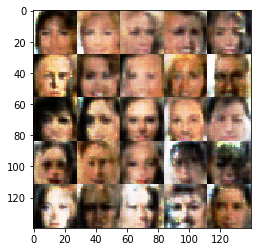

Epoch 1/1 Discriminator loss: 1.3578 Generator loss: 0.7889
Epoch 1/1 Discriminator loss: 1.3875 Generator loss: 0.7184
Epoch 1/1 Discriminator loss: 1.3369 Generator loss: 0.7795
Epoch 1/1 Discriminator loss: 1.3331 Generator loss: 0.7469
Epoch 1/1 Discriminator loss: 1.3425 Generator loss: 0.9157
Epoch 1/1 Discriminator loss: 1.3765 Generator loss: 0.6413
Epoch 1/1 Discriminator loss: 1.2359 Generator loss: 1.0349
Epoch 1/1 Discriminator loss: 1.6763 Generator loss: 0.3458
Epoch 1/1 Discriminator loss: 2.0663 Generator loss: 1.9869
Epoch 1/1 Discriminator loss: 1.4957 Generator loss: 0.4503
Epoch 1/1 Discriminator loss: 1.3688 Generator loss: 0.9364
Epoch 1/1 Discriminator loss: 1.5048 Generator loss: 0.7142
Epoch 1/1 Discriminator loss: 1.5202 Generator loss: 0.5971
Epoch 1/1 Discriminator loss: 1.4525 Generator loss: 0.8022
Epoch 1/1 Discriminator loss: 1.4199 Generator loss: 0.7960
Epoch 1/1 Discriminator loss: 1.3740 Generator loss: 0.7782
Epoch 1/1 Discriminator loss: 1.4189 Gen

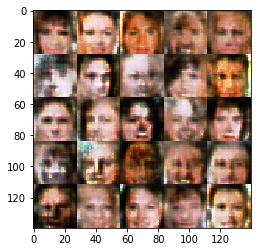

Epoch 1/1 Discriminator loss: 1.4454 Generator loss: 0.7311
Epoch 1/1 Discriminator loss: 1.4061 Generator loss: 0.7570
Epoch 1/1 Discriminator loss: 1.4303 Generator loss: 0.7030
Epoch 1/1 Discriminator loss: 1.3639 Generator loss: 0.8371
Epoch 1/1 Discriminator loss: 1.4192 Generator loss: 0.7420
Epoch 1/1 Discriminator loss: 1.4108 Generator loss: 0.6890
Epoch 1/1 Discriminator loss: 1.3822 Generator loss: 0.8671
Epoch 1/1 Discriminator loss: 1.3852 Generator loss: 0.8164
Epoch 1/1 Discriminator loss: 1.3864 Generator loss: 0.7647
Epoch 1/1 Discriminator loss: 1.3573 Generator loss: 0.7515
Epoch 1/1 Discriminator loss: 1.3751 Generator loss: 0.8097
Epoch 1/1 Discriminator loss: 1.3616 Generator loss: 0.7856
Epoch 1/1 Discriminator loss: 1.3864 Generator loss: 0.6811
Epoch 1/1 Discriminator loss: 1.3892 Generator loss: 0.7840
Epoch 1/1 Discriminator loss: 1.3483 Generator loss: 0.7790
Epoch 1/1 Discriminator loss: 1.3251 Generator loss: 0.8328
Epoch 1/1 Discriminator loss: 1.4106 Gen

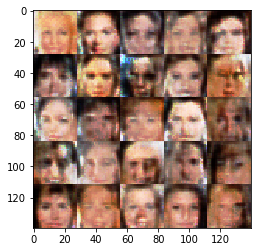

Epoch 1/1 Discriminator loss: 1.3495 Generator loss: 0.8032
Epoch 1/1 Discriminator loss: 1.3451 Generator loss: 0.7956
Epoch 1/1 Discriminator loss: 1.3147 Generator loss: 1.0159
Epoch 1/1 Discriminator loss: 1.5475 Generator loss: 0.4205
Epoch 1/1 Discriminator loss: 1.4487 Generator loss: 1.1314
Epoch 1/1 Discriminator loss: 1.4319 Generator loss: 0.5481
Epoch 1/1 Discriminator loss: 1.4014 Generator loss: 0.7610
Epoch 1/1 Discriminator loss: 1.4460 Generator loss: 0.8429
Epoch 1/1 Discriminator loss: 1.4028 Generator loss: 0.7113
Epoch 1/1 Discriminator loss: 1.3925 Generator loss: 0.7669
Epoch 1/1 Discriminator loss: 1.3900 Generator loss: 0.7494
Epoch 1/1 Discriminator loss: 1.3541 Generator loss: 0.9629
Epoch 1/1 Discriminator loss: 1.3995 Generator loss: 0.6009
Epoch 1/1 Discriminator loss: 1.3559 Generator loss: 0.8355
Epoch 1/1 Discriminator loss: 1.3665 Generator loss: 0.6999
Epoch 1/1 Discriminator loss: 1.3339 Generator loss: 0.8811
Epoch 1/1 Discriminator loss: 1.3306 Gen

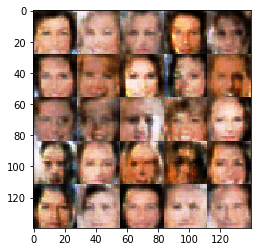

Epoch 1/1 Discriminator loss: 1.3909 Generator loss: 0.6502
Epoch 1/1 Discriminator loss: 1.3712 Generator loss: 1.0436
Epoch 1/1 Discriminator loss: 1.4541 Generator loss: 0.5601
Epoch 1/1 Discriminator loss: 1.4117 Generator loss: 0.9827
Epoch 1/1 Discriminator loss: 1.3404 Generator loss: 0.6679
Epoch 1/1 Discriminator loss: 1.3251 Generator loss: 0.7924
Epoch 1/1 Discriminator loss: 1.3271 Generator loss: 0.8158
Epoch 1/1 Discriminator loss: 1.2335 Generator loss: 0.8681
Epoch 1/1 Discriminator loss: 1.1538 Generator loss: 0.9964
Epoch 1/1 Discriminator loss: 1.4858 Generator loss: 0.4643
Epoch 1/1 Discriminator loss: 1.9567 Generator loss: 1.7518
Epoch 1/1 Discriminator loss: 1.6354 Generator loss: 0.3556
Epoch 1/1 Discriminator loss: 1.4893 Generator loss: 1.1986
Epoch 1/1 Discriminator loss: 1.6186 Generator loss: 0.4308
Epoch 1/1 Discriminator loss: 1.5558 Generator loss: 0.8778
Epoch 1/1 Discriminator loss: 1.4999 Generator loss: 0.6569
Epoch 1/1 Discriminator loss: 1.4548 Gen

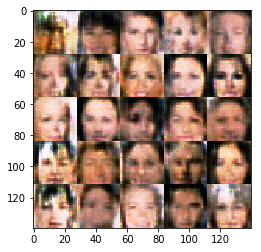

Epoch 1/1 Discriminator loss: 1.4045 Generator loss: 0.8320
Epoch 1/1 Discriminator loss: 1.4364 Generator loss: 0.7515
Epoch 1/1 Discriminator loss: 1.3666 Generator loss: 0.7473
Epoch 1/1 Discriminator loss: 1.3840 Generator loss: 0.7307
Epoch 1/1 Discriminator loss: 1.3913 Generator loss: 0.7636
Epoch 1/1 Discriminator loss: 1.3610 Generator loss: 0.7982
Epoch 1/1 Discriminator loss: 1.3457 Generator loss: 0.7649
Epoch 1/1 Discriminator loss: 1.3368 Generator loss: 0.7585
Epoch 1/1 Discriminator loss: 1.3089 Generator loss: 0.8916
Epoch 1/1 Discriminator loss: 1.3450 Generator loss: 0.7276
Epoch 1/1 Discriminator loss: 1.3900 Generator loss: 0.7211
Epoch 1/1 Discriminator loss: 1.3624 Generator loss: 0.9344
Epoch 1/1 Discriminator loss: 1.4037 Generator loss: 0.6620
Epoch 1/1 Discriminator loss: 1.3998 Generator loss: 0.7133
Epoch 1/1 Discriminator loss: 1.3662 Generator loss: 0.8779
Epoch 1/1 Discriminator loss: 1.3746 Generator loss: 0.6669
Epoch 1/1 Discriminator loss: 1.3579 Gen

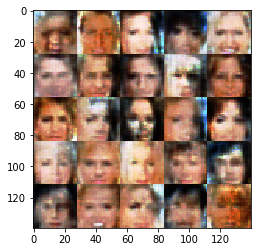

Epoch 1/1 Discriminator loss: 1.3956 Generator loss: 0.6908
Epoch 1/1 Discriminator loss: 1.3795 Generator loss: 0.7791
Epoch 1/1 Discriminator loss: 1.3528 Generator loss: 0.8648
Epoch 1/1 Discriminator loss: 1.3936 Generator loss: 0.6829
Epoch 1/1 Discriminator loss: 1.3915 Generator loss: 0.8787
Epoch 1/1 Discriminator loss: 1.4213 Generator loss: 0.5592
Epoch 1/1 Discriminator loss: 1.3749 Generator loss: 0.8551
Epoch 1/1 Discriminator loss: 1.3579 Generator loss: 0.6600
Epoch 1/1 Discriminator loss: 1.3457 Generator loss: 0.9046
Epoch 1/1 Discriminator loss: 1.3562 Generator loss: 0.6977
Epoch 1/1 Discriminator loss: 1.3444 Generator loss: 0.9697
Epoch 1/1 Discriminator loss: 1.4312 Generator loss: 0.5502
Epoch 1/1 Discriminator loss: 1.4224 Generator loss: 1.0207
Epoch 1/1 Discriminator loss: 1.4649 Generator loss: 0.5048
Epoch 1/1 Discriminator loss: 1.4013 Generator loss: 1.1722
Epoch 1/1 Discriminator loss: 1.3630 Generator loss: 0.6419
Epoch 1/1 Discriminator loss: 1.3496 Gen

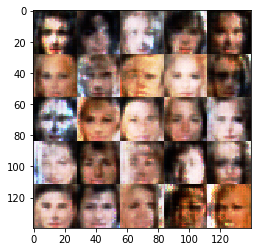

Epoch 1/1 Discriminator loss: 1.5730 Generator loss: 0.4154
Epoch 1/1 Discriminator loss: 1.4817 Generator loss: 1.1332
Epoch 1/1 Discriminator loss: 1.4339 Generator loss: 0.5265
Epoch 1/1 Discriminator loss: 1.3834 Generator loss: 0.8766
Epoch 1/1 Discriminator loss: 1.3476 Generator loss: 0.8381
Epoch 1/1 Discriminator loss: 1.3985 Generator loss: 0.7403
Epoch 1/1 Discriminator loss: 1.3504 Generator loss: 0.8349
Epoch 1/1 Discriminator loss: 1.3477 Generator loss: 0.7700
Epoch 1/1 Discriminator loss: 1.3403 Generator loss: 0.8831
Epoch 1/1 Discriminator loss: 1.3493 Generator loss: 0.6358
Epoch 1/1 Discriminator loss: 1.4236 Generator loss: 1.1571
Epoch 1/1 Discriminator loss: 1.6074 Generator loss: 0.3757
Epoch 1/1 Discriminator loss: 1.4316 Generator loss: 1.1765
Epoch 1/1 Discriminator loss: 1.3920 Generator loss: 0.6325
Epoch 1/1 Discriminator loss: 1.3879 Generator loss: 0.7962
Epoch 1/1 Discriminator loss: 1.3333 Generator loss: 0.8633
Epoch 1/1 Discriminator loss: 1.3924 Gen

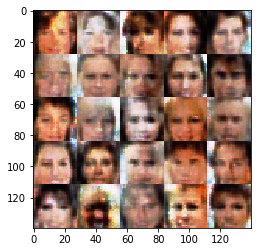

Epoch 1/1 Discriminator loss: 1.3600 Generator loss: 0.7265
Epoch 1/1 Discriminator loss: 1.3712 Generator loss: 0.6962
Epoch 1/1 Discriminator loss: 1.3626 Generator loss: 0.8115
Epoch 1/1 Discriminator loss: 1.3185 Generator loss: 0.7364
Epoch 1/1 Discriminator loss: 1.3173 Generator loss: 0.9491
Epoch 1/1 Discriminator loss: 1.2834 Generator loss: 0.7822
Epoch 1/1 Discriminator loss: 1.3126 Generator loss: 0.9298
Epoch 1/1 Discriminator loss: 1.4561 Generator loss: 0.4728
Epoch 1/1 Discriminator loss: 1.6723 Generator loss: 1.5626
Epoch 1/1 Discriminator loss: 1.5542 Generator loss: 0.4107
Epoch 1/1 Discriminator loss: 1.5636 Generator loss: 1.0798
Epoch 1/1 Discriminator loss: 1.4747 Generator loss: 0.5807
Epoch 1/1 Discriminator loss: 1.3997 Generator loss: 0.7652
Epoch 1/1 Discriminator loss: 1.3873 Generator loss: 0.7910
Epoch 1/1 Discriminator loss: 1.3919 Generator loss: 0.8132
Epoch 1/1 Discriminator loss: 1.3638 Generator loss: 0.7413
Epoch 1/1 Discriminator loss: 1.3478 Gen

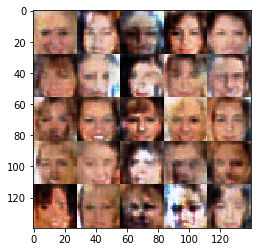

Epoch 1/1 Discriminator loss: 1.4024 Generator loss: 0.6401
Epoch 1/1 Discriminator loss: 1.3718 Generator loss: 1.0053
Epoch 1/1 Discriminator loss: 1.4367 Generator loss: 0.5424
Epoch 1/1 Discriminator loss: 1.3564 Generator loss: 1.1421
Epoch 1/1 Discriminator loss: 1.3476 Generator loss: 0.6699
Epoch 1/1 Discriminator loss: 1.3697 Generator loss: 0.7815
Epoch 1/1 Discriminator loss: 1.4083 Generator loss: 0.6926
Epoch 1/1 Discriminator loss: 1.3419 Generator loss: 0.7631
Epoch 1/1 Discriminator loss: 1.3299 Generator loss: 0.7314
Epoch 1/1 Discriminator loss: 1.2959 Generator loss: 0.8336
Epoch 1/1 Discriminator loss: 1.3717 Generator loss: 0.7989
Epoch 1/1 Discriminator loss: 1.3902 Generator loss: 0.6639
Epoch 1/1 Discriminator loss: 1.3210 Generator loss: 1.1992
Epoch 1/1 Discriminator loss: 1.5490 Generator loss: 0.4461
Epoch 1/1 Discriminator loss: 1.8374 Generator loss: 1.4793
Epoch 1/1 Discriminator loss: 1.4970 Generator loss: 0.4681
Epoch 1/1 Discriminator loss: 1.3814 Gen

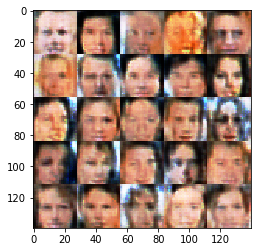

Epoch 1/1 Discriminator loss: 1.3847 Generator loss: 0.6638
Epoch 1/1 Discriminator loss: 1.4041 Generator loss: 0.9874
Epoch 1/1 Discriminator loss: 1.3789 Generator loss: 0.5638
Epoch 1/1 Discriminator loss: 1.3712 Generator loss: 1.0289
Epoch 1/1 Discriminator loss: 1.3577 Generator loss: 0.7051
Epoch 1/1 Discriminator loss: 1.3634 Generator loss: 0.7102
Epoch 1/1 Discriminator loss: 1.3077 Generator loss: 0.9713
Epoch 1/1 Discriminator loss: 1.3372 Generator loss: 0.6809
Epoch 1/1 Discriminator loss: 1.3372 Generator loss: 0.7529
Epoch 1/1 Discriminator loss: 1.3544 Generator loss: 0.8114
Epoch 1/1 Discriminator loss: 1.3975 Generator loss: 0.7148
Epoch 1/1 Discriminator loss: 1.3894 Generator loss: 0.6398
Epoch 1/1 Discriminator loss: 1.4667 Generator loss: 1.1188
Epoch 1/1 Discriminator loss: 1.5627 Generator loss: 0.4151
Epoch 1/1 Discriminator loss: 1.6334 Generator loss: 1.4090
Epoch 1/1 Discriminator loss: 1.4121 Generator loss: 0.6258
Epoch 1/1 Discriminator loss: 1.4032 Gen

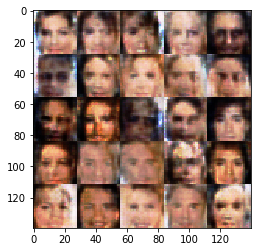

Epoch 1/1 Discriminator loss: 1.3509 Generator loss: 0.7442
Epoch 1/1 Discriminator loss: 1.3747 Generator loss: 0.9737
Epoch 1/1 Discriminator loss: 1.4343 Generator loss: 0.5466
Epoch 1/1 Discriminator loss: 1.4226 Generator loss: 1.0097
Epoch 1/1 Discriminator loss: 1.3995 Generator loss: 0.5918
Epoch 1/1 Discriminator loss: 1.3491 Generator loss: 0.7775
Epoch 1/1 Discriminator loss: 1.3178 Generator loss: 0.8776
Epoch 1/1 Discriminator loss: 1.3001 Generator loss: 0.8684
Epoch 1/1 Discriminator loss: 1.3172 Generator loss: 0.8167
Epoch 1/1 Discriminator loss: 1.3683 Generator loss: 0.6309
Epoch 1/1 Discriminator loss: 1.3324 Generator loss: 1.0003
Epoch 1/1 Discriminator loss: 1.3915 Generator loss: 0.5515
Epoch 1/1 Discriminator loss: 1.3833 Generator loss: 1.1046
Epoch 1/1 Discriminator loss: 1.3807 Generator loss: 0.6021
Epoch 1/1 Discriminator loss: 1.2892 Generator loss: 0.9092
Epoch 1/1 Discriminator loss: 1.3482 Generator loss: 0.8337
Epoch 1/1 Discriminator loss: 1.4206 Gen

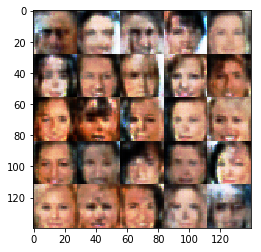

Epoch 1/1 Discriminator loss: 1.3645 Generator loss: 0.7835
Epoch 1/1 Discriminator loss: 1.3418 Generator loss: 0.7837
Epoch 1/1 Discriminator loss: 1.3317 Generator loss: 0.8467
Epoch 1/1 Discriminator loss: 1.2662 Generator loss: 0.8920
Epoch 1/1 Discriminator loss: 1.2823 Generator loss: 0.6999
Epoch 1/1 Discriminator loss: 1.3570 Generator loss: 0.8141
Epoch 1/1 Discriminator loss: 1.3408 Generator loss: 0.5968
Epoch 1/1 Discriminator loss: 1.3007 Generator loss: 0.8374
Epoch 1/1 Discriminator loss: 1.4457 Generator loss: 0.5680
Epoch 1/1 Discriminator loss: 1.3823 Generator loss: 1.2548
Epoch 1/1 Discriminator loss: 1.5457 Generator loss: 0.4211
Epoch 1/1 Discriminator loss: 1.6457 Generator loss: 1.3804
Epoch 1/1 Discriminator loss: 1.4394 Generator loss: 0.5582
Epoch 1/1 Discriminator loss: 1.3342 Generator loss: 0.8630
Epoch 1/1 Discriminator loss: 1.3900 Generator loss: 0.8522
Epoch 1/1 Discriminator loss: 1.3773 Generator loss: 0.6935
Epoch 1/1 Discriminator loss: 1.4138 Gen

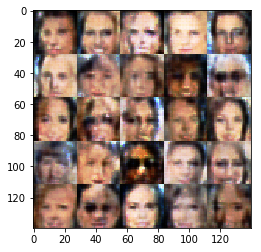

Epoch 1/1 Discriminator loss: 1.3387 Generator loss: 0.8765
Epoch 1/1 Discriminator loss: 1.3988 Generator loss: 0.6467
Epoch 1/1 Discriminator loss: 1.3630 Generator loss: 0.8578
Epoch 1/1 Discriminator loss: 1.3204 Generator loss: 0.7945
Epoch 1/1 Discriminator loss: 1.3028 Generator loss: 0.7187
Epoch 1/1 Discriminator loss: 1.3221 Generator loss: 0.7669
Epoch 1/1 Discriminator loss: 1.3510 Generator loss: 0.8031
Epoch 1/1 Discriminator loss: 1.2938 Generator loss: 0.9009
Epoch 1/1 Discriminator loss: 1.3831 Generator loss: 0.6255
Epoch 1/1 Discriminator loss: 1.3252 Generator loss: 0.8658
Epoch 1/1 Discriminator loss: 1.3632 Generator loss: 0.6115
Epoch 1/1 Discriminator loss: 1.3861 Generator loss: 0.8536
Epoch 1/1 Discriminator loss: 1.3389 Generator loss: 0.7081
Epoch 1/1 Discriminator loss: 1.2907 Generator loss: 1.0332
Epoch 1/1 Discriminator loss: 1.5556 Generator loss: 0.4437
Epoch 1/1 Discriminator loss: 1.9090 Generator loss: 1.9140
Epoch 1/1 Discriminator loss: 1.5523 Gen

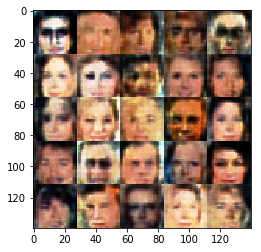

Epoch 1/1 Discriminator loss: 1.3653 Generator loss: 0.8067
Epoch 1/1 Discriminator loss: 1.4075 Generator loss: 0.8103
Epoch 1/1 Discriminator loss: 1.4248 Generator loss: 0.6802
Epoch 1/1 Discriminator loss: 1.3975 Generator loss: 0.7710
Epoch 1/1 Discriminator loss: 1.3998 Generator loss: 0.7726
Epoch 1/1 Discriminator loss: 1.4162 Generator loss: 0.7802
Epoch 1/1 Discriminator loss: 1.3870 Generator loss: 0.7424
Epoch 1/1 Discriminator loss: 1.3671 Generator loss: 0.7994
Epoch 1/1 Discriminator loss: 1.3573 Generator loss: 0.7946
Epoch 1/1 Discriminator loss: 1.3683 Generator loss: 0.7312
Epoch 1/1 Discriminator loss: 1.3659 Generator loss: 0.8024
Epoch 1/1 Discriminator loss: 1.3874 Generator loss: 0.6959
Epoch 1/1 Discriminator loss: 1.3654 Generator loss: 0.7940
Epoch 1/1 Discriminator loss: 1.3381 Generator loss: 0.7721
Epoch 1/1 Discriminator loss: 1.3758 Generator loss: 0.7658
Epoch 1/1 Discriminator loss: 1.3514 Generator loss: 0.7266
Epoch 1/1 Discriminator loss: 1.3539 Gen

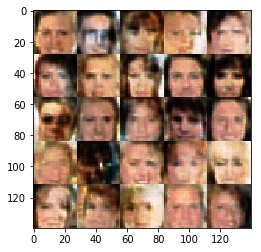

Epoch 1/1 Discriminator loss: 1.5655 Generator loss: 1.2017
Epoch 1/1 Discriminator loss: 1.3900 Generator loss: 0.6659
Epoch 1/1 Discriminator loss: 1.3606 Generator loss: 0.7567
Epoch 1/1 Discriminator loss: 1.3825 Generator loss: 0.7016
Epoch 1/1 Discriminator loss: 1.3147 Generator loss: 0.9518
Epoch 1/1 Discriminator loss: 1.3484 Generator loss: 0.7171
Epoch 1/1 Discriminator loss: 1.3135 Generator loss: 0.8933
Epoch 1/1 Discriminator loss: 1.3441 Generator loss: 0.7488
Epoch 1/1 Discriminator loss: 1.3726 Generator loss: 0.6748
Epoch 1/1 Discriminator loss: 1.3481 Generator loss: 0.9187
Epoch 1/1 Discriminator loss: 1.4487 Generator loss: 0.5523
Epoch 1/1 Discriminator loss: 1.3927 Generator loss: 1.0676
Epoch 1/1 Discriminator loss: 1.4394 Generator loss: 0.5214
Epoch 1/1 Discriminator loss: 1.4344 Generator loss: 1.0804
Epoch 1/1 Discriminator loss: 1.4807 Generator loss: 0.4824
Epoch 1/1 Discriminator loss: 1.5463 Generator loss: 1.4312
Epoch 1/1 Discriminator loss: 1.4873 Gen

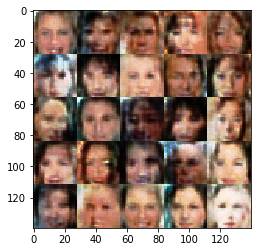

Epoch 1/1 Discriminator loss: 1.3748 Generator loss: 0.7320
Epoch 1/1 Discriminator loss: 1.3692 Generator loss: 0.6259
Epoch 1/1 Discriminator loss: 1.3160 Generator loss: 0.9313
Epoch 1/1 Discriminator loss: 1.4395 Generator loss: 0.5721
Epoch 1/1 Discriminator loss: 1.3557 Generator loss: 1.4153
Epoch 1/1 Discriminator loss: 1.5825 Generator loss: 0.3846
Epoch 1/1 Discriminator loss: 1.4146 Generator loss: 1.4296
Epoch 1/1 Discriminator loss: 1.3838 Generator loss: 0.5707
Epoch 1/1 Discriminator loss: 1.3696 Generator loss: 1.0401
Epoch 1/1 Discriminator loss: 1.3800 Generator loss: 0.6736
Epoch 1/1 Discriminator loss: 1.3857 Generator loss: 0.7745
Epoch 1/1 Discriminator loss: 1.3815 Generator loss: 0.8015
Epoch 1/1 Discriminator loss: 1.3361 Generator loss: 0.7068
Epoch 1/1 Discriminator loss: 1.3515 Generator loss: 0.9467
Epoch 1/1 Discriminator loss: 1.3749 Generator loss: 0.6981
Epoch 1/1 Discriminator loss: 1.4086 Generator loss: 0.8103
Epoch 1/1 Discriminator loss: 1.3786 Gen

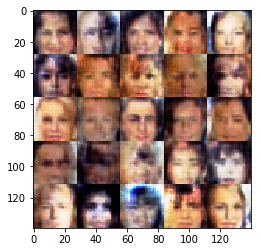

Epoch 1/1 Discriminator loss: 1.3451 Generator loss: 0.6820
Epoch 1/1 Discriminator loss: 1.3306 Generator loss: 0.7791
Epoch 1/1 Discriminator loss: 1.3189 Generator loss: 0.8062
Epoch 1/1 Discriminator loss: 1.3496 Generator loss: 0.8024
Epoch 1/1 Discriminator loss: 1.3520 Generator loss: 0.8549
Epoch 1/1 Discriminator loss: 1.3089 Generator loss: 0.8270
Epoch 1/1 Discriminator loss: 1.3048 Generator loss: 0.7700
Epoch 1/1 Discriminator loss: 1.3600 Generator loss: 0.9484
Epoch 1/1 Discriminator loss: 1.4394 Generator loss: 0.5185
Epoch 1/1 Discriminator loss: 1.3523 Generator loss: 1.0884
Epoch 1/1 Discriminator loss: 1.3816 Generator loss: 0.7077
Epoch 1/1 Discriminator loss: 1.3734 Generator loss: 0.6572
Epoch 1/1 Discriminator loss: 1.4097 Generator loss: 0.8550
Epoch 1/1 Discriminator loss: 1.3980 Generator loss: 0.5887
Epoch 1/1 Discriminator loss: 1.3747 Generator loss: 0.9804
Epoch 1/1 Discriminator loss: 1.3683 Generator loss: 0.6196
Epoch 1/1 Discriminator loss: 1.4092 Gen

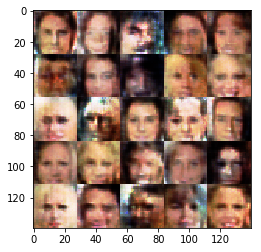

Epoch 1/1 Discriminator loss: 1.3538 Generator loss: 1.0455
Epoch 1/1 Discriminator loss: 1.3463 Generator loss: 0.7151
Epoch 1/1 Discriminator loss: 1.3575 Generator loss: 0.8673
Epoch 1/1 Discriminator loss: 1.4560 Generator loss: 0.5694
Epoch 1/1 Discriminator loss: 1.3795 Generator loss: 0.9546
Epoch 1/1 Discriminator loss: 1.4314 Generator loss: 0.5212
Epoch 1/1 Discriminator loss: 1.3037 Generator loss: 0.9521
Epoch 1/1 Discriminator loss: 1.3859 Generator loss: 0.6575
Epoch 1/1 Discriminator loss: 1.2820 Generator loss: 0.9272
Epoch 1/1 Discriminator loss: 1.2751 Generator loss: 0.7488
Epoch 1/1 Discriminator loss: 1.2787 Generator loss: 1.1458
Epoch 1/1 Discriminator loss: 1.6287 Generator loss: 0.3661
Epoch 1/1 Discriminator loss: 2.0557 Generator loss: 1.9827
Epoch 1/1 Discriminator loss: 1.4474 Generator loss: 0.5304
Epoch 1/1 Discriminator loss: 1.3737 Generator loss: 0.6963
Epoch 1/1 Discriminator loss: 1.3607 Generator loss: 0.9168
Epoch 1/1 Discriminator loss: 1.3739 Gen

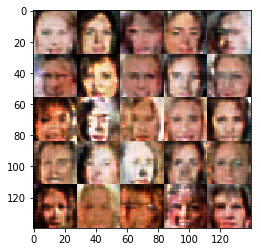

Epoch 1/1 Discriminator loss: 1.4254 Generator loss: 0.7119
Epoch 1/1 Discriminator loss: 1.4328 Generator loss: 0.7899
Epoch 1/1 Discriminator loss: 1.4027 Generator loss: 0.7928
Epoch 1/1 Discriminator loss: 1.3954 Generator loss: 0.7639
Epoch 1/1 Discriminator loss: 1.3546 Generator loss: 0.8043
Epoch 1/1 Discriminator loss: 1.3771 Generator loss: 0.8175
Epoch 1/1 Discriminator loss: 1.3697 Generator loss: 0.7230
Epoch 1/1 Discriminator loss: 1.3384 Generator loss: 0.7637
Epoch 1/1 Discriminator loss: 1.3324 Generator loss: 0.8760
Epoch 1/1 Discriminator loss: 1.3521 Generator loss: 0.6551
Epoch 1/1 Discriminator loss: 1.3276 Generator loss: 0.8182
Epoch 1/1 Discriminator loss: 1.3695 Generator loss: 0.7028
Epoch 1/1 Discriminator loss: 1.3961 Generator loss: 0.7727
Epoch 1/1 Discriminator loss: 1.3504 Generator loss: 0.8385
Epoch 1/1 Discriminator loss: 1.2945 Generator loss: 0.7646
Epoch 1/1 Discriminator loss: 1.3273 Generator loss: 0.9232
Epoch 1/1 Discriminator loss: 1.3104 Gen

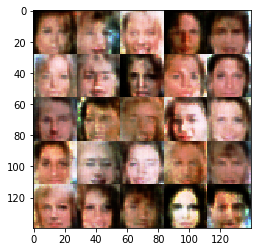

Epoch 1/1 Discriminator loss: 1.3326 Generator loss: 0.8391
Epoch 1/1 Discriminator loss: 1.3266 Generator loss: 0.6698
Epoch 1/1 Discriminator loss: 1.2648 Generator loss: 1.1735
Epoch 1/1 Discriminator loss: 1.6463 Generator loss: 0.3472
Epoch 1/1 Discriminator loss: 1.4912 Generator loss: 1.4381
Epoch 1/1 Discriminator loss: 1.3229 Generator loss: 0.6642
Epoch 1/1 Discriminator loss: 1.3005 Generator loss: 0.7952
Epoch 1/1 Discriminator loss: 1.4050 Generator loss: 0.7479
Epoch 1/1 Discriminator loss: 1.3573 Generator loss: 0.8353
Epoch 1/1 Discriminator loss: 1.3146 Generator loss: 0.8668
Epoch 1/1 Discriminator loss: 1.3250 Generator loss: 0.7091
Epoch 1/1 Discriminator loss: 1.3399 Generator loss: 0.7865
Epoch 1/1 Discriminator loss: 1.2698 Generator loss: 0.9686
Epoch 1/1 Discriminator loss: 1.3137 Generator loss: 0.6572
Epoch 1/1 Discriminator loss: 1.2173 Generator loss: 1.0039
Epoch 1/1 Discriminator loss: 1.2665 Generator loss: 0.7121
Epoch 1/1 Discriminator loss: 1.3513 Gen

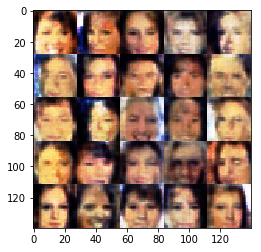

Epoch 1/1 Discriminator loss: 1.4574 Generator loss: 0.7515
Epoch 1/1 Discriminator loss: 1.4798 Generator loss: 0.8036
Epoch 1/1 Discriminator loss: 1.4058 Generator loss: 0.7656
Epoch 1/1 Discriminator loss: 1.3886 Generator loss: 0.7945
Epoch 1/1 Discriminator loss: 1.3530 Generator loss: 0.7960
Epoch 1/1 Discriminator loss: 1.3824 Generator loss: 0.7855
Epoch 1/1 Discriminator loss: 1.3784 Generator loss: 0.7875
Epoch 1/1 Discriminator loss: 1.3383 Generator loss: 0.8366
Epoch 1/1 Discriminator loss: 1.3488 Generator loss: 0.8333
Epoch 1/1 Discriminator loss: 1.3385 Generator loss: 0.7270
Epoch 1/1 Discriminator loss: 1.3371 Generator loss: 0.8326
Epoch 1/1 Discriminator loss: 1.3506 Generator loss: 0.7006
Epoch 1/1 Discriminator loss: 1.3448 Generator loss: 0.8794
Epoch 1/1 Discriminator loss: 1.3413 Generator loss: 0.7669
Epoch 1/1 Discriminator loss: 1.3607 Generator loss: 0.6529
Epoch 1/1 Discriminator loss: 1.3739 Generator loss: 1.0665
Epoch 1/1 Discriminator loss: 1.4399 Gen

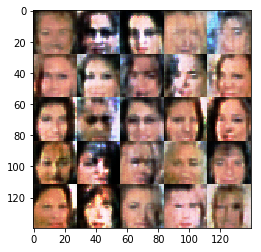

Epoch 1/1 Discriminator loss: 1.3245 Generator loss: 0.8402
Epoch 1/1 Discriminator loss: 1.2741 Generator loss: 0.8410
Epoch 1/1 Discriminator loss: 1.3505 Generator loss: 0.6346
Epoch 1/1 Discriminator loss: 1.2935 Generator loss: 0.9467
Epoch 1/1 Discriminator loss: 1.2171 Generator loss: 0.7885
Epoch 1/1 Discriminator loss: 1.2205 Generator loss: 1.2452
Epoch 1/1 Discriminator loss: 1.5592 Generator loss: 0.4053
Epoch 1/1 Discriminator loss: 2.1658 Generator loss: 1.8799
Epoch 1/1 Discriminator loss: 1.5755 Generator loss: 0.5092
Epoch 1/1 Discriminator loss: 1.4101 Generator loss: 0.8866
Epoch 1/1 Discriminator loss: 1.3870 Generator loss: 0.8897
Epoch 1/1 Discriminator loss: 1.2946 Generator loss: 0.8570
Epoch 1/1 Discriminator loss: 1.2989 Generator loss: 0.8525
Epoch 1/1 Discriminator loss: 1.3810 Generator loss: 0.7748
Epoch 1/1 Discriminator loss: 1.4386 Generator loss: 0.7258
Epoch 1/1 Discriminator loss: 1.4116 Generator loss: 0.7185
Epoch 1/1 Discriminator loss: 1.3846 Gen

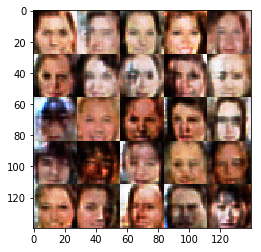

Epoch 1/1 Discriminator loss: 1.4191 Generator loss: 0.7596
Epoch 1/1 Discriminator loss: 1.4288 Generator loss: 0.7184
Epoch 1/1 Discriminator loss: 1.4246 Generator loss: 0.7739
Epoch 1/1 Discriminator loss: 1.3499 Generator loss: 0.8050
Epoch 1/1 Discriminator loss: 1.3268 Generator loss: 0.7681
Epoch 1/1 Discriminator loss: 1.3478 Generator loss: 0.8289
Epoch 1/1 Discriminator loss: 1.2840 Generator loss: 0.7335
Epoch 1/1 Discriminator loss: 1.3737 Generator loss: 0.7380
Epoch 1/1 Discriminator loss: 1.3320 Generator loss: 0.8546
Epoch 1/1 Discriminator loss: 1.3302 Generator loss: 0.7498
Epoch 1/1 Discriminator loss: 1.3985 Generator loss: 0.7784
Epoch 1/1 Discriminator loss: 1.3533 Generator loss: 0.6707
Epoch 1/1 Discriminator loss: 1.4104 Generator loss: 1.0231
Epoch 1/1 Discriminator loss: 1.3821 Generator loss: 0.5672
Epoch 1/1 Discriminator loss: 1.3622 Generator loss: 1.1127
Epoch 1/1 Discriminator loss: 1.5279 Generator loss: 0.4313
Epoch 1/1 Discriminator loss: 1.5494 Gen

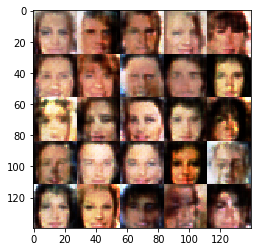

Epoch 1/1 Discriminator loss: 1.3192 Generator loss: 0.8529
Epoch 1/1 Discriminator loss: 1.3210 Generator loss: 0.9051
Epoch 1/1 Discriminator loss: 1.3222 Generator loss: 0.6766
Epoch 1/1 Discriminator loss: 1.3329 Generator loss: 0.9934
Epoch 1/1 Discriminator loss: 1.4359 Generator loss: 0.5622
Epoch 1/1 Discriminator loss: 1.3680 Generator loss: 0.9855
Epoch 1/1 Discriminator loss: 1.3361 Generator loss: 0.7242
Epoch 1/1 Discriminator loss: 1.3248 Generator loss: 0.7218
Epoch 1/1 Discriminator loss: 1.3831 Generator loss: 0.8157
Epoch 1/1 Discriminator loss: 1.3762 Generator loss: 0.5954
Epoch 1/1 Discriminator loss: 1.2609 Generator loss: 1.2157
Epoch 1/1 Discriminator loss: 1.4955 Generator loss: 0.4351
Epoch 1/1 Discriminator loss: 1.4324 Generator loss: 1.1500
Epoch 1/1 Discriminator loss: 1.2876 Generator loss: 0.8620
Epoch 1/1 Discriminator loss: 1.2052 Generator loss: 0.9651
Epoch 1/1 Discriminator loss: 1.2465 Generator loss: 0.7482
Epoch 1/1 Discriminator loss: 1.2773 Gen

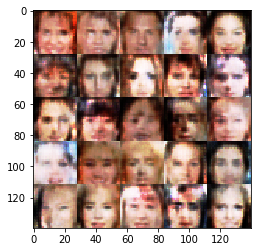

Epoch 1/1 Discriminator loss: 1.4164 Generator loss: 1.2492
Epoch 1/1 Discriminator loss: 1.5634 Generator loss: 0.4429
Epoch 1/1 Discriminator loss: 1.4275 Generator loss: 1.2482
Epoch 1/1 Discriminator loss: 1.3241 Generator loss: 0.7984
Epoch 1/1 Discriminator loss: 1.2983 Generator loss: 0.8127
Epoch 1/1 Discriminator loss: 1.3729 Generator loss: 0.7434
Epoch 1/1 Discriminator loss: 1.3015 Generator loss: 0.8299
Epoch 1/1 Discriminator loss: 1.3097 Generator loss: 0.8349
Epoch 1/1 Discriminator loss: 1.3469 Generator loss: 0.6550
Epoch 1/1 Discriminator loss: 1.2905 Generator loss: 0.7741
Epoch 1/1 Discriminator loss: 1.3357 Generator loss: 0.9113
Epoch 1/1 Discriminator loss: 1.3127 Generator loss: 0.6828
Epoch 1/1 Discriminator loss: 1.3357 Generator loss: 0.8235
Epoch 1/1 Discriminator loss: 1.2307 Generator loss: 1.0165
Epoch 1/1 Discriminator loss: 1.3054 Generator loss: 0.6865
Epoch 1/1 Discriminator loss: 1.2417 Generator loss: 0.9454
Epoch 1/1 Discriminator loss: 1.3635 Gen

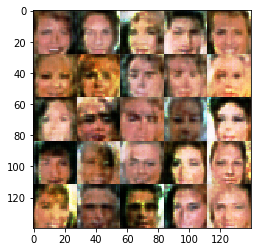

Epoch 1/1 Discriminator loss: 1.5620 Generator loss: 0.4157
Epoch 1/1 Discriminator loss: 1.3553 Generator loss: 1.0350
Epoch 1/1 Discriminator loss: 1.3882 Generator loss: 0.6753
Epoch 1/1 Discriminator loss: 1.2826 Generator loss: 1.0346
Epoch 1/1 Discriminator loss: 1.3569 Generator loss: 0.6771
Epoch 1/1 Discriminator loss: 1.2978 Generator loss: 0.9186
Epoch 1/1 Discriminator loss: 1.3520 Generator loss: 0.7079
Epoch 1/1 Discriminator loss: 1.3210 Generator loss: 0.8772
Epoch 1/1 Discriminator loss: 1.3325 Generator loss: 0.6805
Epoch 1/1 Discriminator loss: 1.2658 Generator loss: 0.9584
Epoch 1/1 Discriminator loss: 1.1910 Generator loss: 0.8194
Epoch 1/1 Discriminator loss: 1.2779 Generator loss: 0.6988
Epoch 1/1 Discriminator loss: 1.1966 Generator loss: 1.3479
Epoch 1/1 Discriminator loss: 1.6034 Generator loss: 0.3794
Epoch 1/1 Discriminator loss: 1.5616 Generator loss: 1.5618
Epoch 1/1 Discriminator loss: 1.3736 Generator loss: 0.6584
Epoch 1/1 Discriminator loss: 1.3652 Gen

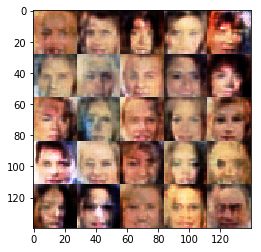

Epoch 1/1 Discriminator loss: 1.3565 Generator loss: 0.6188
Epoch 1/1 Discriminator loss: 1.2296 Generator loss: 1.2664
Epoch 1/1 Discriminator loss: 1.4304 Generator loss: 0.4930
Epoch 1/1 Discriminator loss: 1.3784 Generator loss: 1.2871
Epoch 1/1 Discriminator loss: 1.3898 Generator loss: 0.5290
Epoch 1/1 Discriminator loss: 1.3941 Generator loss: 1.1290
Epoch 1/1 Discriminator loss: 1.4783 Generator loss: 0.5098
Epoch 1/1 Discriminator loss: 1.3744 Generator loss: 1.0909
Epoch 1/1 Discriminator loss: 1.4228 Generator loss: 0.5719
Epoch 1/1 Discriminator loss: 1.3129 Generator loss: 0.9959
Epoch 1/1 Discriminator loss: 1.3491 Generator loss: 0.6721
Epoch 1/1 Discriminator loss: 1.2825 Generator loss: 1.0597
Epoch 1/1 Discriminator loss: 1.2386 Generator loss: 0.7401
Epoch 1/1 Discriminator loss: 1.3349 Generator loss: 1.2277
Epoch 1/1 Discriminator loss: 1.4169 Generator loss: 0.5153
Epoch 1/1 Discriminator loss: 1.5056 Generator loss: 1.1867
Epoch 1/1 Discriminator loss: 1.4558 Gen

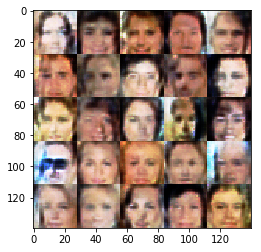

Epoch 1/1 Discriminator loss: 1.2543 Generator loss: 0.7385
Epoch 1/1 Discriminator loss: 1.2677 Generator loss: 0.9063
Epoch 1/1 Discriminator loss: 1.2877 Generator loss: 0.7561
Epoch 1/1 Discriminator loss: 1.1976 Generator loss: 1.0904
Epoch 1/1 Discriminator loss: 1.2442 Generator loss: 0.7022
Epoch 1/1 Discriminator loss: 1.1722 Generator loss: 0.9586
Epoch 1/1 Discriminator loss: 1.2832 Generator loss: 0.6225
Epoch 1/1 Discriminator loss: 1.3564 Generator loss: 1.4191
Epoch 1/1 Discriminator loss: 1.5985 Generator loss: 0.3859
Epoch 1/1 Discriminator loss: 1.7357 Generator loss: 1.4562
Epoch 1/1 Discriminator loss: 1.5852 Generator loss: 0.5718
Epoch 1/1 Discriminator loss: 1.5400 Generator loss: 0.6869
Epoch 1/1 Discriminator loss: 1.4784 Generator loss: 0.8663
Epoch 1/1 Discriminator loss: 1.4377 Generator loss: 0.7367
Epoch 1/1 Discriminator loss: 1.4430 Generator loss: 0.7381
Epoch 1/1 Discriminator loss: 1.4407 Generator loss: 0.7726
Epoch 1/1 Discriminator loss: 1.4069 Gen

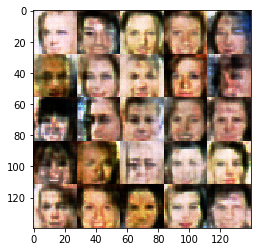

Epoch 1/1 Discriminator loss: 1.3851 Generator loss: 0.7765
Epoch 1/1 Discriminator loss: 1.4261 Generator loss: 0.7615
Epoch 1/1 Discriminator loss: 1.4072 Generator loss: 0.7549
Epoch 1/1 Discriminator loss: 1.4050 Generator loss: 0.7769
Epoch 1/1 Discriminator loss: 1.4264 Generator loss: 0.7681
Epoch 1/1 Discriminator loss: 1.3635 Generator loss: 0.8494
Epoch 1/1 Discriminator loss: 1.4065 Generator loss: 0.7607
Epoch 1/1 Discriminator loss: 1.4027 Generator loss: 0.7229
Epoch 1/1 Discriminator loss: 1.3571 Generator loss: 0.8270
Epoch 1/1 Discriminator loss: 1.3779 Generator loss: 0.7391
Epoch 1/1 Discriminator loss: 1.3968 Generator loss: 0.7401
Epoch 1/1 Discriminator loss: 1.4105 Generator loss: 0.7442
Epoch 1/1 Discriminator loss: 1.4373 Generator loss: 0.7496
Epoch 1/1 Discriminator loss: 1.4173 Generator loss: 0.7278
Epoch 1/1 Discriminator loss: 1.3794 Generator loss: 0.8027
Epoch 1/1 Discriminator loss: 1.3366 Generator loss: 0.7924
Epoch 1/1 Discriminator loss: 1.4180 Gen

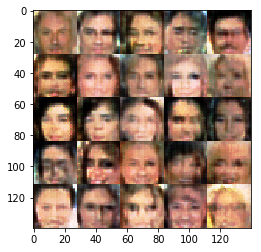

Epoch 1/1 Discriminator loss: 1.3950 Generator loss: 0.7545
Epoch 1/1 Discriminator loss: 1.3723 Generator loss: 0.8852
Epoch 1/1 Discriminator loss: 1.3784 Generator loss: 0.6809
Epoch 1/1 Discriminator loss: 1.3736 Generator loss: 0.9325
Epoch 1/1 Discriminator loss: 1.4338 Generator loss: 0.5719
Epoch 1/1 Discriminator loss: 1.4233 Generator loss: 0.9993
Epoch 1/1 Discriminator loss: 1.3673 Generator loss: 0.6179
Epoch 1/1 Discriminator loss: 1.3078 Generator loss: 0.9221
Epoch 1/1 Discriminator loss: 1.3354 Generator loss: 0.7229
Epoch 1/1 Discriminator loss: 1.2961 Generator loss: 0.9581
Epoch 1/1 Discriminator loss: 1.3731 Generator loss: 0.6477
Epoch 1/1 Discriminator loss: 1.3510 Generator loss: 0.9665
Epoch 1/1 Discriminator loss: 1.2942 Generator loss: 0.6877
Epoch 1/1 Discriminator loss: 1.3129 Generator loss: 0.8526
Epoch 1/1 Discriminator loss: 1.2915 Generator loss: 0.8036
Epoch 1/1 Discriminator loss: 1.1831 Generator loss: 0.9654
Epoch 1/1 Discriminator loss: 1.2914 Gen

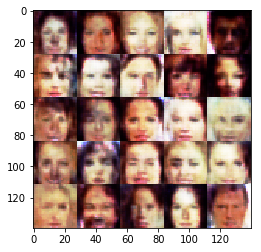

Epoch 1/1 Discriminator loss: 1.4769 Generator loss: 0.5316
Epoch 1/1 Discriminator loss: 1.8649 Generator loss: 1.2828
Epoch 1/1 Discriminator loss: 2.0658 Generator loss: 0.2173
Epoch 1/1 Discriminator loss: 2.2448 Generator loss: 2.2429
Epoch 1/1 Discriminator loss: 1.3806 Generator loss: 0.7588
Epoch 1/1 Discriminator loss: 1.4354 Generator loss: 0.6310
Epoch 1/1 Discriminator loss: 1.3851 Generator loss: 0.8965
Epoch 1/1 Discriminator loss: 1.3720 Generator loss: 1.0120
Epoch 1/1 Discriminator loss: 1.4249 Generator loss: 0.7161
Epoch 1/1 Discriminator loss: 1.4023 Generator loss: 0.8690
Epoch 1/1 Discriminator loss: 1.4087 Generator loss: 0.7085
Epoch 1/1 Discriminator loss: 1.4186 Generator loss: 0.7395
Epoch 1/1 Discriminator loss: 1.4359 Generator loss: 0.7369
Epoch 1/1 Discriminator loss: 1.4099 Generator loss: 0.7716
Epoch 1/1 Discriminator loss: 1.4238 Generator loss: 0.7518
Epoch 1/1 Discriminator loss: 1.3726 Generator loss: 0.8029
Epoch 1/1 Discriminator loss: 1.3689 Gen

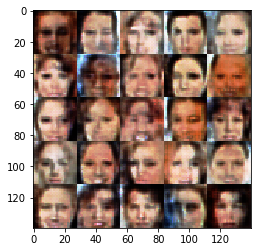

Epoch 1/1 Discriminator loss: 1.3897 Generator loss: 0.7995
Epoch 1/1 Discriminator loss: 1.3810 Generator loss: 0.7651
Epoch 1/1 Discriminator loss: 1.3859 Generator loss: 0.7793
Epoch 1/1 Discriminator loss: 1.3990 Generator loss: 0.8177
Epoch 1/1 Discriminator loss: 1.4028 Generator loss: 0.8152
Epoch 1/1 Discriminator loss: 1.4241 Generator loss: 0.7187
Epoch 1/1 Discriminator loss: 1.4114 Generator loss: 0.7672
Epoch 1/1 Discriminator loss: 1.3702 Generator loss: 0.7811
Epoch 1/1 Discriminator loss: 1.4118 Generator loss: 0.7796
Epoch 1/1 Discriminator loss: 1.3676 Generator loss: 0.7905
Epoch 1/1 Discriminator loss: 1.3659 Generator loss: 0.8345
Epoch 1/1 Discriminator loss: 1.3905 Generator loss: 0.7820
Epoch 1/1 Discriminator loss: 1.4374 Generator loss: 0.7531
Epoch 1/1 Discriminator loss: 1.3844 Generator loss: 0.7990
Epoch 1/1 Discriminator loss: 1.3879 Generator loss: 0.7690
Epoch 1/1 Discriminator loss: 1.3727 Generator loss: 0.8214
Epoch 1/1 Discriminator loss: 1.4024 Gen

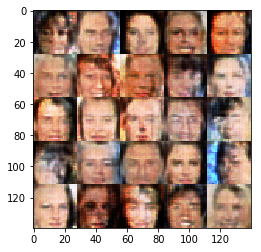

Epoch 1/1 Discriminator loss: 1.3464 Generator loss: 0.8590
Epoch 1/1 Discriminator loss: 1.3595 Generator loss: 0.7879
Epoch 1/1 Discriminator loss: 1.4066 Generator loss: 0.7344
Epoch 1/1 Discriminator loss: 1.3323 Generator loss: 0.8259
Epoch 1/1 Discriminator loss: 1.3810 Generator loss: 0.7822
Epoch 1/1 Discriminator loss: 1.3606 Generator loss: 0.7637
Epoch 1/1 Discriminator loss: 1.3778 Generator loss: 0.7743
Epoch 1/1 Discriminator loss: 1.4033 Generator loss: 0.7510
Epoch 1/1 Discriminator loss: 1.3758 Generator loss: 0.7908
Epoch 1/1 Discriminator loss: 1.4084 Generator loss: 0.8543
Epoch 1/1 Discriminator loss: 1.3168 Generator loss: 0.8226
Epoch 1/1 Discriminator loss: 1.3776 Generator loss: 0.7647
Epoch 1/1 Discriminator loss: 1.3967 Generator loss: 0.7985
Epoch 1/1 Discriminator loss: 1.4028 Generator loss: 0.7883
Epoch 1/1 Discriminator loss: 1.3598 Generator loss: 0.7311
Epoch 1/1 Discriminator loss: 1.3561 Generator loss: 0.7936
Epoch 1/1 Discriminator loss: 1.3231 Gen

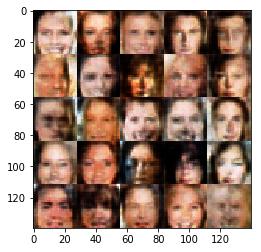

Epoch 1/1 Discriminator loss: 1.3073 Generator loss: 0.7799
Epoch 1/1 Discriminator loss: 1.3535 Generator loss: 0.8798
Epoch 1/1 Discriminator loss: 1.3817 Generator loss: 0.6843
Epoch 1/1 Discriminator loss: 1.3696 Generator loss: 0.7841
Epoch 1/1 Discriminator loss: 1.3098 Generator loss: 0.8607
Epoch 1/1 Discriminator loss: 1.3395 Generator loss: 0.6541
Epoch 1/1 Discriminator loss: 1.3412 Generator loss: 0.9250
Epoch 1/1 Discriminator loss: 1.3936 Generator loss: 0.7806
Epoch 1/1 Discriminator loss: 1.3728 Generator loss: 0.6601
Epoch 1/1 Discriminator loss: 1.3035 Generator loss: 0.9487
Epoch 1/1 Discriminator loss: 1.3742 Generator loss: 0.6947
Epoch 1/1 Discriminator loss: 1.3486 Generator loss: 0.9344
Epoch 1/1 Discriminator loss: 1.3460 Generator loss: 0.6751
Epoch 1/1 Discriminator loss: 1.3394 Generator loss: 0.8984
Epoch 1/1 Discriminator loss: 1.3728 Generator loss: 0.7382
Epoch 1/1 Discriminator loss: 1.4082 Generator loss: 0.5970
Epoch 1/1 Discriminator loss: 1.3159 Gen

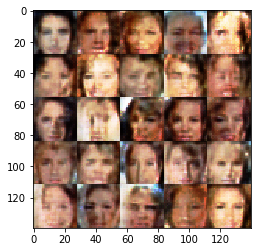

Epoch 1/1 Discriminator loss: 1.2834 Generator loss: 0.8350
Epoch 1/1 Discriminator loss: 1.2977 Generator loss: 0.7228
Epoch 1/1 Discriminator loss: 1.3154 Generator loss: 0.8779
Epoch 1/1 Discriminator loss: 1.2699 Generator loss: 0.6817
Epoch 1/1 Discriminator loss: 1.3314 Generator loss: 0.9095
Epoch 1/1 Discriminator loss: 1.3288 Generator loss: 0.6018
Epoch 1/1 Discriminator loss: 1.4074 Generator loss: 1.2695
Epoch 1/1 Discriminator loss: 1.4567 Generator loss: 0.4967
Epoch 1/1 Discriminator loss: 1.3397 Generator loss: 0.9864
Epoch 1/1 Discriminator loss: 1.3626 Generator loss: 0.7066
Epoch 1/1 Discriminator loss: 1.3801 Generator loss: 0.7144
Epoch 1/1 Discriminator loss: 1.3845 Generator loss: 0.8776
Epoch 1/1 Discriminator loss: 1.3513 Generator loss: 0.8277
Epoch 1/1 Discriminator loss: 1.3001 Generator loss: 0.8467
Epoch 1/1 Discriminator loss: 1.3391 Generator loss: 0.7461
Epoch 1/1 Discriminator loss: 1.3575 Generator loss: 0.7215
Epoch 1/1 Discriminator loss: 1.2781 Gen

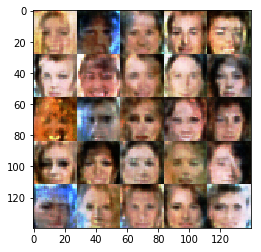

Epoch 1/1 Discriminator loss: 1.3300 Generator loss: 0.8558
Epoch 1/1 Discriminator loss: 1.3591 Generator loss: 0.8984
Epoch 1/1 Discriminator loss: 1.5315 Generator loss: 0.4354
Epoch 1/1 Discriminator loss: 1.7000 Generator loss: 1.8894
Epoch 1/1 Discriminator loss: 1.4822 Generator loss: 0.4655
Epoch 1/1 Discriminator loss: 1.3844 Generator loss: 0.9239
Epoch 1/1 Discriminator loss: 1.3414 Generator loss: 0.8117
Epoch 1/1 Discriminator loss: 1.3637 Generator loss: 0.7579
Epoch 1/1 Discriminator loss: 1.3314 Generator loss: 0.8603
Epoch 1/1 Discriminator loss: 1.3521 Generator loss: 0.8010
Epoch 1/1 Discriminator loss: 1.3648 Generator loss: 0.7623
Epoch 1/1 Discriminator loss: 1.3828 Generator loss: 0.7593
Epoch 1/1 Discriminator loss: 1.3839 Generator loss: 0.7736
Epoch 1/1 Discriminator loss: 1.3337 Generator loss: 0.8097
Epoch 1/1 Discriminator loss: 1.2841 Generator loss: 0.7587
Epoch 1/1 Discriminator loss: 1.2538 Generator loss: 0.8355
Epoch 1/1 Discriminator loss: 1.3071 Gen

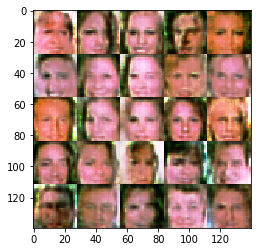

Epoch 1/1 Discriminator loss: 1.3447 Generator loss: 0.5548
Epoch 1/1 Discriminator loss: 1.4588 Generator loss: 1.1960
Epoch 1/1 Discriminator loss: 1.5941 Generator loss: 0.3866
Epoch 1/1 Discriminator loss: 1.4296 Generator loss: 1.0465
Epoch 1/1 Discriminator loss: 1.3778 Generator loss: 0.7794
Epoch 1/1 Discriminator loss: 1.3508 Generator loss: 0.7635
Epoch 1/1 Discriminator loss: 1.4477 Generator loss: 0.7354
Epoch 1/1 Discriminator loss: 1.5187 Generator loss: 0.7389
Epoch 1/1 Discriminator loss: 1.4143 Generator loss: 0.6696
Epoch 1/1 Discriminator loss: 1.3349 Generator loss: 0.8842
Epoch 1/1 Discriminator loss: 1.4022 Generator loss: 0.7790
Epoch 1/1 Discriminator loss: 1.2929 Generator loss: 0.7254
Epoch 1/1 Discriminator loss: 1.2602 Generator loss: 1.0407
Epoch 1/1 Discriminator loss: 1.5012 Generator loss: 0.4663
Epoch 1/1 Discriminator loss: 1.5399 Generator loss: 1.3717
Epoch 1/1 Discriminator loss: 1.6265 Generator loss: 0.3835
Epoch 1/1 Discriminator loss: 1.4151 Gen

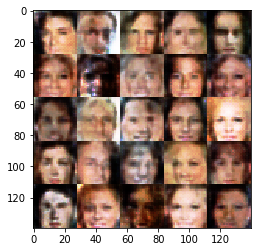

Epoch 1/1 Discriminator loss: 1.3072 Generator loss: 0.7843
Epoch 1/1 Discriminator loss: 1.3434 Generator loss: 0.7794
Epoch 1/1 Discriminator loss: 1.3252 Generator loss: 0.8321
Epoch 1/1 Discriminator loss: 1.3783 Generator loss: 0.6573
Epoch 1/1 Discriminator loss: 1.3387 Generator loss: 0.9875
Epoch 1/1 Discriminator loss: 1.2388 Generator loss: 0.7469
Epoch 1/1 Discriminator loss: 1.2635 Generator loss: 0.7605
Epoch 1/1 Discriminator loss: 1.2206 Generator loss: 0.8221
Epoch 1/1 Discriminator loss: 1.1302 Generator loss: 1.1848
Epoch 1/1 Discriminator loss: 1.4547 Generator loss: 0.4669
Epoch 1/1 Discriminator loss: 1.8897 Generator loss: 1.3819
Epoch 1/1 Discriminator loss: 1.5761 Generator loss: 0.4533
Epoch 1/1 Discriminator loss: 1.4649 Generator loss: 0.6157
Epoch 1/1 Discriminator loss: 1.5089 Generator loss: 0.7483
Epoch 1/1 Discriminator loss: 1.6250 Generator loss: 0.7294
Epoch 1/1 Discriminator loss: 1.3608 Generator loss: 0.8366
Epoch 1/1 Discriminator loss: 1.3045 Gen

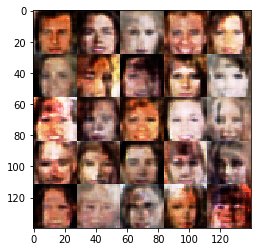

Epoch 1/1 Discriminator loss: 1.3497 Generator loss: 0.7339
Epoch 1/1 Discriminator loss: 1.3843 Generator loss: 0.6459
Epoch 1/1 Discriminator loss: 1.3696 Generator loss: 0.8762
Epoch 1/1 Discriminator loss: 1.3428 Generator loss: 0.6551
Epoch 1/1 Discriminator loss: 1.3466 Generator loss: 0.7228
Epoch 1/1 Discriminator loss: 1.2945 Generator loss: 0.7112
Epoch 1/1 Discriminator loss: 1.4260 Generator loss: 0.9740
Epoch 1/1 Discriminator loss: 1.4509 Generator loss: 0.5600
Epoch 1/1 Discriminator loss: 1.3595 Generator loss: 1.1107
Epoch 1/1 Discriminator loss: 1.3082 Generator loss: 0.7220
Epoch 1/1 Discriminator loss: 1.2494 Generator loss: 0.8762
Epoch 1/1 Discriminator loss: 1.2789 Generator loss: 0.8241
Epoch 1/1 Discriminator loss: 1.1381 Generator loss: 0.9936
Epoch 1/1 Discriminator loss: 1.2051 Generator loss: 0.7937
Epoch 1/1 Discriminator loss: 1.2100 Generator loss: 1.2251
Epoch 1/1 Discriminator loss: 1.2333 Generator loss: 0.6600
Epoch 1/1 Discriminator loss: 1.4574 Gen

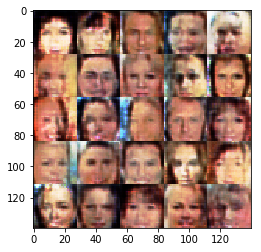

Epoch 1/1 Discriminator loss: 1.2859 Generator loss: 0.9585
Epoch 1/1 Discriminator loss: 1.3751 Generator loss: 0.8276
Epoch 1/1 Discriminator loss: 1.3720 Generator loss: 0.6046
Epoch 1/1 Discriminator loss: 1.2702 Generator loss: 1.1343
Epoch 1/1 Discriminator loss: 1.1978 Generator loss: 0.8323
Epoch 1/1 Discriminator loss: 1.3618 Generator loss: 0.6027
Epoch 1/1 Discriminator loss: 1.4153 Generator loss: 1.2087
Epoch 1/1 Discriminator loss: 1.5863 Generator loss: 0.3770
Epoch 1/1 Discriminator loss: 1.5955 Generator loss: 1.3249
Epoch 1/1 Discriminator loss: 1.3975 Generator loss: 0.6083
Epoch 1/1 Discriminator loss: 1.3414 Generator loss: 0.8828
Epoch 1/1 Discriminator loss: 1.3476 Generator loss: 0.8146
Epoch 1/1 Discriminator loss: 1.3499 Generator loss: 0.9179
Epoch 1/1 Discriminator loss: 1.3923 Generator loss: 0.7244
Epoch 1/1 Discriminator loss: 1.3668 Generator loss: 0.7799
Epoch 1/1 Discriminator loss: 1.3653 Generator loss: 0.9174
Epoch 1/1 Discriminator loss: 1.4005 Gen

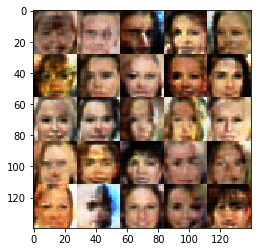

Epoch 1/1 Discriminator loss: 1.3470 Generator loss: 0.7195
Epoch 1/1 Discriminator loss: 1.3557 Generator loss: 0.8016
Epoch 1/1 Discriminator loss: 1.2772 Generator loss: 0.9188
Epoch 1/1 Discriminator loss: 1.3528 Generator loss: 0.5931
Epoch 1/1 Discriminator loss: 1.4503 Generator loss: 1.1157
Epoch 1/1 Discriminator loss: 1.3637 Generator loss: 0.6211
Epoch 1/1 Discriminator loss: 1.4032 Generator loss: 0.6985
Epoch 1/1 Discriminator loss: 1.3040 Generator loss: 0.7966
Epoch 1/1 Discriminator loss: 1.3387 Generator loss: 0.7391
Epoch 1/1 Discriminator loss: 1.2498 Generator loss: 0.8573
Epoch 1/1 Discriminator loss: 1.1557 Generator loss: 1.1793
Epoch 1/1 Discriminator loss: 1.2138 Generator loss: 0.7589
Epoch 1/1 Discriminator loss: 1.2667 Generator loss: 0.9025
Epoch 1/1 Discriminator loss: 1.4396 Generator loss: 0.4654
Epoch 1/1 Discriminator loss: 1.9379 Generator loss: 1.8990
Epoch 1/1 Discriminator loss: 1.4667 Generator loss: 0.4495
Epoch 1/1 Discriminator loss: 1.3753 Gen

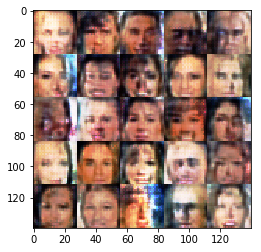

Epoch 1/1 Discriminator loss: 1.4156 Generator loss: 0.6953
Epoch 1/1 Discriminator loss: 1.3279 Generator loss: 0.8053
Epoch 1/1 Discriminator loss: 1.3583 Generator loss: 0.8121
Epoch 1/1 Discriminator loss: 1.3798 Generator loss: 0.8520
Epoch 1/1 Discriminator loss: 1.3883 Generator loss: 0.6966
Epoch 1/1 Discriminator loss: 1.3746 Generator loss: 0.8097
Epoch 1/1 Discriminator loss: 1.3866 Generator loss: 0.8007
Epoch 1/1 Discriminator loss: 1.3089 Generator loss: 0.7803
Epoch 1/1 Discriminator loss: 1.3753 Generator loss: 0.7528
Epoch 1/1 Discriminator loss: 1.4275 Generator loss: 0.7439
Epoch 1/1 Discriminator loss: 1.4086 Generator loss: 0.7743
Epoch 1/1 Discriminator loss: 1.3218 Generator loss: 0.7319
Epoch 1/1 Discriminator loss: 1.3278 Generator loss: 0.8480
Epoch 1/1 Discriminator loss: 1.2094 Generator loss: 0.9350
Epoch 1/1 Discriminator loss: 1.0242 Generator loss: 1.1726
Epoch 1/1 Discriminator loss: 1.3983 Generator loss: 0.5055
Epoch 1/1 Discriminator loss: 1.6166 Gen

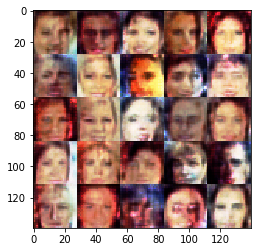

Epoch 1/1 Discriminator loss: 1.4246 Generator loss: 0.7392
Epoch 1/1 Discriminator loss: 1.4147 Generator loss: 0.8574
Epoch 1/1 Discriminator loss: 1.3623 Generator loss: 0.7674
Epoch 1/1 Discriminator loss: 1.3730 Generator loss: 0.7657
Epoch 1/1 Discriminator loss: 1.4337 Generator loss: 0.7377
Epoch 1/1 Discriminator loss: 1.3558 Generator loss: 0.8408
Epoch 1/1 Discriminator loss: 1.3294 Generator loss: 0.7893
Epoch 1/1 Discriminator loss: 1.2548 Generator loss: 0.9405
Epoch 1/1 Discriminator loss: 1.0779 Generator loss: 1.1435
Epoch 1/1 Discriminator loss: 1.4182 Generator loss: 0.4888
Epoch 1/1 Discriminator loss: 1.5367 Generator loss: 1.3830
Epoch 1/1 Discriminator loss: 1.5604 Generator loss: 0.4081
Epoch 1/1 Discriminator loss: 1.3676 Generator loss: 0.9788
Epoch 1/1 Discriminator loss: 1.2244 Generator loss: 0.8049
Epoch 1/1 Discriminator loss: 1.2756 Generator loss: 0.9108
Epoch 1/1 Discriminator loss: 1.1625 Generator loss: 0.9496
Epoch 1/1 Discriminator loss: 1.0789 Gen

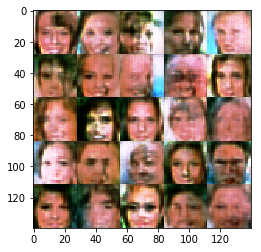

Epoch 1/1 Discriminator loss: 1.3608 Generator loss: 0.6699
Epoch 1/1 Discriminator loss: 1.5168 Generator loss: 1.3785
Epoch 1/1 Discriminator loss: 1.4494 Generator loss: 0.5443
Epoch 1/1 Discriminator loss: 1.3589 Generator loss: 0.8073
Epoch 1/1 Discriminator loss: 1.3820 Generator loss: 0.8619
Epoch 1/1 Discriminator loss: 1.3427 Generator loss: 0.7395
Epoch 1/1 Discriminator loss: 1.3468 Generator loss: 0.7892
Epoch 1/1 Discriminator loss: 1.3468 Generator loss: 0.8555
Epoch 1/1 Discriminator loss: 1.3425 Generator loss: 0.6549
Epoch 1/1 Discriminator loss: 1.2271 Generator loss: 0.9861
Epoch 1/1 Discriminator loss: 1.4543 Generator loss: 0.5006
Epoch 1/1 Discriminator loss: 1.4259 Generator loss: 1.2825
Epoch 1/1 Discriminator loss: 1.4115 Generator loss: 0.5287
Epoch 1/1 Discriminator loss: 1.3782 Generator loss: 1.0200
Epoch 1/1 Discriminator loss: 1.1705 Generator loss: 0.8481
Epoch 1/1 Discriminator loss: 1.2197 Generator loss: 0.9938
Epoch 1/1 Discriminator loss: 1.1166 Gen

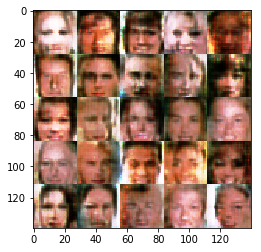

Epoch 1/1 Discriminator loss: 1.3358 Generator loss: 0.8174
Epoch 1/1 Discriminator loss: 1.4098 Generator loss: 0.6823
Epoch 1/1 Discriminator loss: 1.4318 Generator loss: 0.6652
Epoch 1/1 Discriminator loss: 1.3419 Generator loss: 1.0243
Epoch 1/1 Discriminator loss: 1.3553 Generator loss: 0.7053
Epoch 1/1 Discriminator loss: 1.2937 Generator loss: 0.8429
Epoch 1/1 Discriminator loss: 1.3485 Generator loss: 0.8356
Epoch 1/1 Discriminator loss: 1.4550 Generator loss: 0.6664
Epoch 1/1 Discriminator loss: 1.4433 Generator loss: 0.6834
Epoch 1/1 Discriminator loss: 1.2999 Generator loss: 0.9312
Epoch 1/1 Discriminator loss: 1.3501 Generator loss: 0.6400
Epoch 1/1 Discriminator loss: 1.3380 Generator loss: 0.7118
Epoch 1/1 Discriminator loss: 1.3535 Generator loss: 0.9143
Epoch 1/1 Discriminator loss: 1.3177 Generator loss: 0.6151
Epoch 1/1 Discriminator loss: 1.2661 Generator loss: 1.0083
Epoch 1/1 Discriminator loss: 1.2379 Generator loss: 0.7653
Epoch 1/1 Discriminator loss: 1.2317 Gen

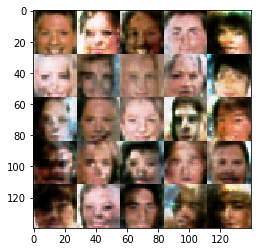

Epoch 1/1 Discriminator loss: 1.2338 Generator loss: 0.8183
Epoch 1/1 Discriminator loss: 1.2168 Generator loss: 0.7611
Epoch 1/1 Discriminator loss: 1.3271 Generator loss: 1.0216
Epoch 1/1 Discriminator loss: 1.2504 Generator loss: 0.7526
Epoch 1/1 Discriminator loss: 1.2532 Generator loss: 1.2009
Epoch 1/1 Discriminator loss: 1.3780 Generator loss: 0.5301
Epoch 1/1 Discriminator loss: 1.3343 Generator loss: 1.5544
Epoch 1/1 Discriminator loss: 1.4899 Generator loss: 0.4011
Epoch 1/1 Discriminator loss: 1.3398 Generator loss: 0.9829
Epoch 1/1 Discriminator loss: 1.3619 Generator loss: 0.5796
Epoch 1/1 Discriminator loss: 1.3753 Generator loss: 1.6145
Epoch 1/1 Discriminator loss: 1.5996 Generator loss: 0.4008
Epoch 1/1 Discriminator loss: 1.4792 Generator loss: 1.4100
Epoch 1/1 Discriminator loss: 1.3004 Generator loss: 0.7721
Epoch 1/1 Discriminator loss: 1.2239 Generator loss: 0.9294
Epoch 1/1 Discriminator loss: 1.2003 Generator loss: 0.8541
Epoch 1/1 Discriminator loss: 1.3707 Gen

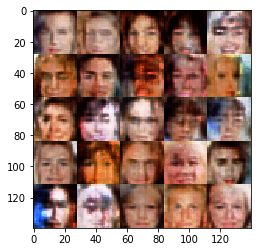

Epoch 1/1 Discriminator loss: 1.2427 Generator loss: 0.7597
Epoch 1/1 Discriminator loss: 1.0347 Generator loss: 1.5430
Epoch 1/1 Discriminator loss: 2.0095 Generator loss: 0.2228
Epoch 1/1 Discriminator loss: 2.1645 Generator loss: 1.8193
Epoch 1/1 Discriminator loss: 1.4488 Generator loss: 0.5324
Epoch 1/1 Discriminator loss: 1.3552 Generator loss: 0.8008
Epoch 1/1 Discriminator loss: 1.3221 Generator loss: 0.8367
Epoch 1/1 Discriminator loss: 1.3257 Generator loss: 0.8233
Epoch 1/1 Discriminator loss: 1.3932 Generator loss: 0.7969
Epoch 1/1 Discriminator loss: 1.3655 Generator loss: 0.7648
Epoch 1/1 Discriminator loss: 1.3488 Generator loss: 0.7538
Epoch 1/1 Discriminator loss: 1.3747 Generator loss: 0.8408
Epoch 1/1 Discriminator loss: 1.3586 Generator loss: 0.8212
Epoch 1/1 Discriminator loss: 1.3549 Generator loss: 0.7305
Epoch 1/1 Discriminator loss: 1.3354 Generator loss: 0.9139
Epoch 1/1 Discriminator loss: 1.3900 Generator loss: 0.7377
Epoch 1/1 Discriminator loss: 1.2961 Gen

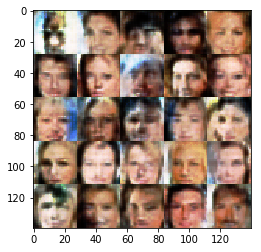

Epoch 1/1 Discriminator loss: 1.3070 Generator loss: 0.8063
Epoch 1/1 Discriminator loss: 1.3569 Generator loss: 0.6813
Epoch 1/1 Discriminator loss: 1.3730 Generator loss: 0.7900
Epoch 1/1 Discriminator loss: 1.3565 Generator loss: 1.0295
Epoch 1/1 Discriminator loss: 1.3376 Generator loss: 0.6693
Epoch 1/1 Discriminator loss: 1.2982 Generator loss: 0.9530
Epoch 1/1 Discriminator loss: 1.3637 Generator loss: 0.5857
Epoch 1/1 Discriminator loss: 1.2272 Generator loss: 0.8650
Epoch 1/1 Discriminator loss: 1.3405 Generator loss: 0.7051
Epoch 1/1 Discriminator loss: 1.3642 Generator loss: 1.0016
Epoch 1/1 Discriminator loss: 1.2405 Generator loss: 0.7149
Epoch 1/1 Discriminator loss: 1.2261 Generator loss: 1.0124
Epoch 1/1 Discriminator loss: 1.2661 Generator loss: 0.7478
Epoch 1/1 Discriminator loss: 1.3408 Generator loss: 0.7644
Epoch 1/1 Discriminator loss: 1.3462 Generator loss: 0.8856
Epoch 1/1 Discriminator loss: 1.4064 Generator loss: 0.5666
Epoch 1/1 Discriminator loss: 1.4282 Gen

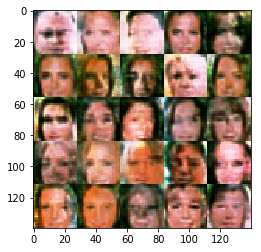

Epoch 1/1 Discriminator loss: 1.3642 Generator loss: 0.7113
Epoch 1/1 Discriminator loss: 1.3715 Generator loss: 0.8468
Epoch 1/1 Discriminator loss: 1.4212 Generator loss: 0.7565
Epoch 1/1 Discriminator loss: 1.3387 Generator loss: 0.8074
Epoch 1/1 Discriminator loss: 1.3992 Generator loss: 0.7472
Epoch 1/1 Discriminator loss: 1.3215 Generator loss: 0.8785
Epoch 1/1 Discriminator loss: 1.2992 Generator loss: 0.8292
Epoch 1/1 Discriminator loss: 1.4026 Generator loss: 0.7187
Epoch 1/1 Discriminator loss: 1.3804 Generator loss: 0.7501
Epoch 1/1 Discriminator loss: 1.3562 Generator loss: 0.7782
Epoch 1/1 Discriminator loss: 1.3796 Generator loss: 0.7749
Epoch 1/1 Discriminator loss: 1.3662 Generator loss: 0.7266
Epoch 1/1 Discriminator loss: 1.3579 Generator loss: 0.8357
Epoch 1/1 Discriminator loss: 1.3175 Generator loss: 0.6804
Epoch 1/1 Discriminator loss: 1.3756 Generator loss: 0.8173
Epoch 1/1 Discriminator loss: 1.3296 Generator loss: 0.7770
Epoch 1/1 Discriminator loss: 1.3271 Gen

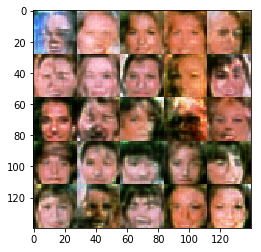

Epoch 1/1 Discriminator loss: 1.2954 Generator loss: 0.6929
Epoch 1/1 Discriminator loss: 1.3035 Generator loss: 0.8316
Epoch 1/1 Discriminator loss: 1.2049 Generator loss: 0.9691
Epoch 1/1 Discriminator loss: 1.2969 Generator loss: 0.6670
Epoch 1/1 Discriminator loss: 1.3297 Generator loss: 0.8854
Epoch 1/1 Discriminator loss: 1.1985 Generator loss: 0.8053
Epoch 1/1 Discriminator loss: 1.2429 Generator loss: 0.7945
Epoch 1/1 Discriminator loss: 1.2085 Generator loss: 1.1138
Epoch 1/1 Discriminator loss: 1.7074 Generator loss: 0.3382
Epoch 1/1 Discriminator loss: 1.7543 Generator loss: 1.6076
Epoch 1/1 Discriminator loss: 1.3571 Generator loss: 0.7021
Epoch 1/1 Discriminator loss: 1.3679 Generator loss: 0.8094
Epoch 1/1 Discriminator loss: 1.4248 Generator loss: 0.8853
Epoch 1/1 Discriminator loss: 1.3942 Generator loss: 0.8951
Epoch 1/1 Discriminator loss: 1.3215 Generator loss: 0.7832
Epoch 1/1 Discriminator loss: 1.3922 Generator loss: 0.7736
Epoch 1/1 Discriminator loss: 1.3543 Gen

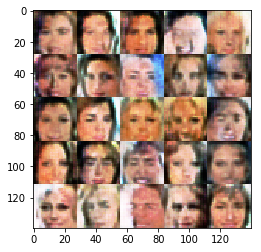

Epoch 1/1 Discriminator loss: 1.2851 Generator loss: 0.8288
Epoch 1/1 Discriminator loss: 1.3268 Generator loss: 0.8538
Epoch 1/1 Discriminator loss: 1.4032 Generator loss: 0.6857
Epoch 1/1 Discriminator loss: 1.3580 Generator loss: 0.7754
Epoch 1/1 Discriminator loss: 1.3421 Generator loss: 0.8308
Epoch 1/1 Discriminator loss: 1.3370 Generator loss: 0.7833
Epoch 1/1 Discriminator loss: 1.3614 Generator loss: 0.7988
Epoch 1/1 Discriminator loss: 1.3390 Generator loss: 0.8283
Epoch 1/1 Discriminator loss: 1.2974 Generator loss: 0.7184
Epoch 1/1 Discriminator loss: 1.2815 Generator loss: 0.9560
Epoch 1/1 Discriminator loss: 1.3391 Generator loss: 0.5846
Epoch 1/1 Discriminator loss: 1.2686 Generator loss: 0.9361
Epoch 1/1 Discriminator loss: 1.3094 Generator loss: 0.7551
Epoch 1/1 Discriminator loss: 1.2841 Generator loss: 0.9806
Epoch 1/1 Discriminator loss: 1.1036 Generator loss: 0.9446
Epoch 1/1 Discriminator loss: 1.3090 Generator loss: 0.6745
Epoch 1/1 Discriminator loss: 1.4816 Gen

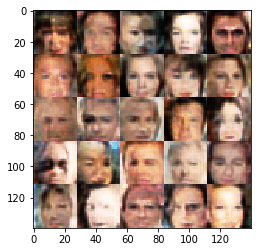

Epoch 1/1 Discriminator loss: 1.3800 Generator loss: 0.7661
Epoch 1/1 Discriminator loss: 1.3357 Generator loss: 0.8085
Epoch 1/1 Discriminator loss: 1.3853 Generator loss: 0.7935
Epoch 1/1 Discriminator loss: 1.3503 Generator loss: 0.7582
Epoch 1/1 Discriminator loss: 1.3753 Generator loss: 0.6983
Epoch 1/1 Discriminator loss: 1.3650 Generator loss: 0.8845
Epoch 1/1 Discriminator loss: 1.3761 Generator loss: 0.7929
Epoch 1/1 Discriminator loss: 1.3239 Generator loss: 0.7852
Epoch 1/1 Discriminator loss: 1.3410 Generator loss: 0.7637
Epoch 1/1 Discriminator loss: 1.2346 Generator loss: 1.0158
Epoch 1/1 Discriminator loss: 1.3335 Generator loss: 0.6500
Epoch 1/1 Discriminator loss: 1.2386 Generator loss: 0.9307


In [ ]:
batch_size = 64
z_dim = 100
learning_rate = 0.001
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.